In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
sns.set_context('notebook', font_scale=1.5, rc={'lines.markeredgewidth': 2})

In [2]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

In [3]:
import matplotlib
print('matplotlib:', matplotlib.__version__)
import numpy
print('numpy:', numpy.__version__)
import scipy
print('scipy:', scipy.__version__)
import pandas 
print('pandas:', pandas.__version__)
import seaborn
print('seaborn:', seaborn.__version__)
import allensdk
print('allensdk:', allensdk.__version__)

matplotlib: 3.8.4
numpy: 1.22.0
scipy: 1.10.1
pandas: 1.5.3
seaborn: 0.13.2
allensdk: 2.16.2


In [4]:
import visual_behavior.data_access.utilities as utilities
from visual_behavior.data_access import loading as loading

import visual_behavior.visualization.utils as utils
import visual_behavior.visualization.ophys.platform_paper_figures as ppf
import visual_behavior.visualization.ophys.platform_single_cell_examples as pse

from allensdk.brain_observatory.behavior.behavior_project_cache import VisualBehaviorOphysProjectCache

/opt/conda/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/root/capsule/visual_behavior_analysis/visual_behavior/data_access/from_lims.py:37: UserWarning: failed to set up LIMS/mtrain credentials
'LIMS_DBNAME'

         internal AIBS users should set up environment variables         appropriately
functions requiring database access will fail
  warnings.warn(warn_string)


In [5]:
experience_levels = utils.get_new_experience_levels()
experience_level_colors = utils.get_experience_level_colors()
cell_types = utils.get_cell_types()

### load experiments and cells tables

In [6]:
loading.get_platform_analysis_cache_dir()

'/data'

In [7]:
from allensdk.brain_observatory.behavior.behavior_project_cache import VisualBehaviorOphysProjectCache

platform_cache_dir = loading.get_platform_analysis_cache_dir()
cache = VisualBehaviorOphysProjectCache.from_local_cache(cache_dir=platform_cache_dir, use_static_cache=True)

experiments_table = cache.get_ophys_experiment_table()
print(len(experiments_table))

1936


/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


In [ ]:
# metadata tables
experiments_table = pd.read_csv(os.path.join(loading.get_metadata_tables_dir(), 'all_ophys_experiments_table.csv'), index_col=0)
platform_experiments = pd.read_csv(os.path.join(loading.get_metadata_tables_dir(), 'platform_paper_ophys_experiments_table.csv'), index_col=0)
platform_cells_table = pd.read_csv(os.path.join(loading.get_metadata_tables_dir(), 'platform_paper_ophys_cells_table.csv'), index_col=0)
matched_cells_table = pd.read_csv(os.path.join(loading.get_metadata_tables_dir(), 'platform_paper_matched_ophys_cells_table.csv'), index_col=0)


# get lists of matched cells and expts
matched_cells = matched_cells_table.cell_specimen_id.unique()
matched_experiments = matched_cells_table.ophys_experiment_id.unique()

# get cre_lines and cell types for plot labels
cre_lines = np.sort(platform_cells_table.cre_line.unique())
cell_types = utilities.get_cell_types_dict(cre_lines, platform_experiments)


In [9]:
print(len(experiments_table.mouse_id.unique()), 'mice')
print(len(experiments_table.ophys_session_id.unique()), 'sessions')
print(len(experiments_table.ophys_container_id.unique()), 'containers')
print(len(experiments_table.index.unique()), 'experiments')

107 mice
703 sessions
326 containers
1936 experiments


In [10]:
print(len(platform_experiments.mouse_id.unique()), 'mice')
print(len(platform_experiments.ophys_session_id.unique()), 'sessions')
print(len(platform_experiments.ophys_container_id.unique()), 'containers')
print(len(platform_experiments.index.unique()), 'experiments')

66 mice
202 sessions
134 containers
402 experiments


### get useful info

In [11]:
palette = utilities.get_experience_level_colors()

In [12]:
base_dir = r'/scratch'

# save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_figures_final\figure_3'
save_dir = os.path.join(base_dir, 'platform_paper_figures')
if not os.path.exists(save_dir):
    os.mkdir(save_dir)

folder = 'population_activity'
if os.path.exists(os.path.join(save_dir, folder)):
    os.mkdir(os.path.join(save_dir, folder))

## Load response metrics

In [14]:
import visual_behavior.ophys.response_analysis.cell_metrics as cm
import visual_behavior.dimensionality_reduction.clustering.processing as processing

The history saving thread hit an unexpected error (OperationalError('unable to open database file')).History will not be written to the database.


/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


#### Trace metrics

In [15]:
# data_type = 'events'
# condition = 'traces'
# stimuli = 'full_session'
# session_subset = 'full_session'
# inclusion_criteria = 'platform_experiment_table'


# trace_metrics = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)

# # filepath = cm.get_metrics_df_filepath('all_experiments', condition, stimuli, session_subset,
# #                                        data_type=data_type, interpolate=True, output_sampling_rate=30)
# # trace_metrics.to_hdf(filepath, key='df')

# print(len(trace_metrics.ophys_experiment_id.unique()))

#### Merged table of cell metrics across conditions

In [16]:

data_type = 'filtered_events'

session_subset = 'full_session'
    
inclusion_criteria = 'platform_experiment_table'

filtered_events_metrics_table = processing.generate_merged_table_of_model_free_metrics(data_type=data_type, session_subset=session_subset,
                                                inclusion_criteria=inclusion_criteria, save_dir=loading.get_metadata_tables_dir())

original_metrics_table = filtered_events_metrics_table.copy()
metrics_table = filtered_events_metrics_table.copy()
len(metrics_table.ophys_experiment_id.unique())


filepath: /data/visual_behavior_metadata_tables/merged_model_free_metrics_table_filtered_events_platform_experiment_table.csv
loading model free metrics table


402

In [17]:
print(len(metrics_table.cell_specimen_id.unique()), 'cells')
print(len(metrics_table.ophys_experiment_id.unique()), 'experiments')

14495 cells
402 experiments


In [18]:
platform_experiments = loading.get_platform_paper_experiment_table(limit_to_closest_active=True)

/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments


In [20]:
platform_experiments.experience_level.unique()

array(['Familiar', 'Novel', 'Novel +'], dtype=object)

In [21]:
print(len(platform_experiments.mouse_id.unique()), 'mice')
print(len(platform_experiments.ophys_session_id.unique()), 'sessions')
print(len(platform_experiments.ophys_container_id.unique()), 'containers')
print(len(platform_experiments.index.unique()), 'experiments')

66 mice
202 sessions
134 containers
402 experiments


In [22]:
platform_experiments.experience_level.unique()

array(['Familiar', 'Novel', 'Novel +'], dtype=object)

In [23]:

metrics_table = metrics_table.merge(platform_experiments.reset_index(), on=['ophys_experiment_id', 'experience_level'])
print(len(metrics_table.ophys_experiment_id.unique()))
print(len(metrics_table.cell_specimen_id.unique()))

402
14495


In [24]:
metrics_table.experience_level.unique()

array(['Familiar', 'Novel', 'Novel +'], dtype=object)

In [25]:
print(len(metrics_table.mouse_id.unique()), 'mice')
print(len(metrics_table.ophys_session_id.unique()), 'sessions')
print(len(metrics_table.ophys_container_id.unique()), 'containers')
print(len(metrics_table.ophys_experiment_id.unique()), 'experiments')
print(len(metrics_table.cell_specimen_id.unique()), 'cells')

66 mice
202 sessions
134 containers
402 experiments
14495 cells


In [26]:
metrics_table.drop_duplicates(subset=['cell_specimen_id']).groupby(['cre_line']).count()

,cell_specimen_id,experience_level,ophys_experiment_id,mean_response_pref_image,reliability_pref_image,fraction_significant_p_value_gray_screen_pref_image,fano_factor_pref_image,running_modulation_pref_image,mean_response_all_images,lifetime_sparseness_images,...,layer,area_layer,date,first_novel,n_relative_to_first_novel,last_familiar,last_familiar_active,second_novel,second_novel_active,experience_exposure
cre_line,,,,,,,,,,,,,,,,,,,,,
Slc17a7-IRES2-Cre,12826,12826,12826,12826,12757,12826,12818,12818,12826,12818,...,12826,12826,12826,12826,12826,12826,12826,12826,12826,12826
Sst-IRES-Cre,468,468,468,468,465,468,468,468,468,468,...,468,468,468,468,468,468,468,468,468,468
Vip-IRES-Cre,1201,1201,1201,1201,1195,1201,1201,1201,1201,1201,...,1201,1201,1201,1201,1201,1201,1201,1201,1201,1201


## load multi_session_dfs 

In [27]:
data_type = 'events'

interpolate = True
output_sampling_rate = 30

inclusion_criteria = 'platform_experiment_table'

In [30]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

multi_session_df = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

# limit to changes, convert experience level and merge with cluster IDs
change_mdf = multi_session_df[multi_session_df.is_change==True]

# limit to non-changes, convert experience level and merge with cluster IDs
image_mdf = multi_session_df[(multi_session_df.is_change==False)]


/opt/conda/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases

1936
loading files from /data/visual_behavior_multi_session_mean_responses
mean_response_df_events_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at /data/visual_behavior_multi_session_mean_responses/mean_response_df_events_all_is_change_platform_experiment_table.pkl
there are 1881 experiments in the full multi_session_df


/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 400 experiments in the multi_session_df after limiting to platform experiments
there are 400 experiments after filtering for inclusion criteria -  platform_experiment_table


In [31]:
print(len(change_mdf.mouse_id.unique()), 'mice')
print(len(change_mdf.ophys_session_id.unique()), 'sessions')
print(len(change_mdf.ophys_container_id.unique()), 'containers')
print(len(change_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(change_mdf.cell_specimen_id.unique()), 'cells')

66 mice
201 sessions
134 containers
400 experiments
14489 cells


In [32]:
change_mdf[change_mdf.ophys_session_id==919888953].head()

,cell_specimen_id,is_change,mean_response,sem_response,mean_trace,sem_trace,trace_timestamps,mean_responses,mean_baseline,sem_baseline,...,layer,area_layer,date,first_novel,n_relative_to_first_novel,last_familiar,last_familiar_active,second_novel,second_novel_active,experience_exposure
7211,1086571383,True,0.093237,0.021794,"[0.07725929897803802, 0.07007721630387377, 0.0...","[0.035335983462972675, 0.03218801901013489, 0....","[-2.0, -1.9666666666666677, -1.933333333333335...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.075114,0.024928,...,upper,VISp_upper,20190808,False,-1.0,True,True,False,False,Familiar > 3
7213,1086571766,True,0.004839,0.002134,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-2.0, -1.9666666666666677, -1.933333333333335...","[0.0, 0.0, 0.0, 0.0, 0.12465563753723786, 0.0,...",0.001040,0.001036,...,upper,VISp_upper,20190808,False,-1.0,True,True,False,False,Familiar > 3
7215,1086571958,True,0.034095,0.011616,"[0.03199363807107313, 0.02931084631445175, 0.0...","[0.018951035237850807, 0.016611644550008495, 0...","[-2.0, -1.9666666666666677, -1.933333333333335...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.028052,0.010212,...,upper,VISp_upper,20190808,False,-1.0,True,True,False,False,Familiar > 3
7217,1086572394,True,0.005397,0.002584,"[0.013836909326754807, 0.012144938384959045, 0...","[0.00870965704829356, 0.007722458805800935, 0....","[-2.0, -1.9666666666666677, -1.933333333333335...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.002458,0.001146,...,upper,VISp_upper,20190808,False,-1.0,True,True,False,False,Familiar > 3
7219,1086572887,True,0.003248,0.001352,"[0.008406376276954683, 0.00782287169250881, 0....","[0.0059485518685428425, 0.005500915362494535, ...","[-2.0, -1.9666666666666677, -1.933333333333335...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.001388,0.000991,...,upper,VISp_upper,20190808,False,-1.0,True,True,False,False,Familiar > 3


In [33]:
print(len(platform_experiments.mouse_id.unique()), 'mice')
print(len(platform_experiments.ophys_session_id.unique()), 'sessions')
print(len(platform_experiments.ophys_container_id.unique()), 'containers')
print(len(platform_experiments.index.unique()), 'experiments')


66 mice
202 sessions
134 containers
402 experiments


In [34]:
platform_experiments[platform_experiments.ophys_session_id==919888953]

,behavior_session_id,ophys_session_id,ophys_container_id,mouse_id,indicator,full_genotype,driver_line,cre_line,reporter_line,sex,...,layer,area_layer,date,first_novel,n_relative_to_first_novel,last_familiar,last_familiar_active,second_novel,second_novel_active,experience_exposure
ophys_experiment_id,,,,,,,,,,,,,,,,,,,,,
920288849,920015895,919888953,1018028166,453990,GCaMP6f,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,[Vip-IRES-Cre],Vip-IRES-Cre,Ai148(TIT2L-GC6f-ICL-tTA2),M,...,upper,VISp_upper,20190808,False,-1.0,True,True,False,False,Familiar > 3
920288845,920015895,919888953,1018028169,453990,GCaMP6f,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,[Vip-IRES-Cre],Vip-IRES-Cre,Ai148(TIT2L-GC6f-ICL-tTA2),M,...,upper,VISp_upper,20190808,False,-1.0,True,True,False,False,Familiar > 3
920288843,920015895,919888953,1018028172,453990,GCaMP6f,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,[Vip-IRES-Cre],Vip-IRES-Cre,Ai148(TIT2L-GC6f-ICL-tTA2),M,...,upper,VISp_upper,20190808,False,-1.0,True,True,False,False,Familiar > 3
920288851,920015895,919888953,1018028185,453990,GCaMP6f,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,[Vip-IRES-Cre],Vip-IRES-Cre,Ai148(TIT2L-GC6f-ICL-tTA2),M,...,upper,VISl_upper,20190808,False,-1.0,True,True,False,False,Familiar > 3
920288855,920015895,919888953,1018028188,453990,GCaMP6f,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,[Vip-IRES-Cre],Vip-IRES-Cre,Ai148(TIT2L-GC6f-ICL-tTA2),M,...,lower,VISl_lower,20190808,False,-1.0,True,True,False,False,Familiar > 3


In [35]:
# # limit to platform paper expts
# image_mdf = image_mdf[image_mdf.ophys_experiment_id.isin(platform_experiments.index.values)]
# change_mdf = change_mdf[change_mdf.ophys_experiment_id.isin(platform_experiments.index.values)]

In [36]:
print(len(change_mdf.mouse_id.unique()), 'mice')
print(len(change_mdf.ophys_session_id.unique()), 'sessions')
print(len(change_mdf.ophys_container_id.unique()), 'containers')
print(len(change_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(change_mdf.cell_specimen_id.unique()), 'cells')

66 mice
201 sessions
134 containers
400 experiments
14489 cells


In [37]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

omission_mdf = omission_mdf[omission_mdf.omitted==True]


/opt/conda/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases

1936
loading files from /data/visual_behavior_multi_session_mean_responses
mean_response_df_events_all_omitted_platform_experiment_table.pkl
loading multi_session_df from saved file at /data/visual_behavior_multi_session_mean_responses/mean_response_df_events_all_omitted_platform_experiment_table.pkl


there are 1879 experiments in the full multi_session_df


/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


In [38]:
print(len(omission_mdf.mouse_id.unique()), 'mice')
print(len(omission_mdf.ophys_session_id.unique()), 'sessions')
print(len(omission_mdf.ophys_container_id.unique()), 'containers')
print(len(omission_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(omission_mdf.cell_specimen_id.unique()), 'cells')

66 mice
201 sessions
134 containers
401 experiments
14490 cells


In [39]:
df = omission_mdf.copy()

print(len(df.mouse_id.unique()), 'mice')
print(len(df.ophys_session_id.unique()), 'sessions')
print(len(df.ophys_container_id.unique()), 'containers')
print(len(df.ophys_experiment_id.unique()), 'experiments')
print(len(df.cell_specimen_id.unique()), 'cells')

66 mice
201 sessions
134 containers
401 experiments
14490 cells


### per image mdf

In [40]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change', 'image_name']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

each_image_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)


/opt/conda/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases

1936
loading files from /data/visual_behavior_multi_session_mean_responses
mean_response_df_events_all_is_change_image_name_platform_experiment_table.pkl
loading multi_session_df from saved file at /data/visual_behavior_multi_session_mean_responses/mean_response_df_events_all_is_change_image_name_platform_experiment_table.pkl
there are 1885 experiments in the full multi_session_df


/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


### evaluate problem session

In [41]:
ophys_session_id = 919888953

In [42]:
# fig, ax = plt.subplots()
# bad_session_data = omission_mdf[omission_mdf.ophys_session_id==919888953]
# times = bad_session_data.trace_timestamps.values[0]
# for oeid in bad_session_data.ophys_experiment_id.unique():
#     mean_trace = bad_session_data[bad_session_data.ophys_experiment_id==oeid].mean_trace.mean()
#     ophys_container_id = bad_session_data[bad_session_data.ophys_experiment_id==oeid].ophys_container_id.unique()[0]
#     ax.plot(times, mean_trace, label=ophys_container_id)
#     ax.set_title(oeid)
#     ax.axvline(x=0, ymin=0, ymax=1)
# ax.legend(bbox_to_anchor=(1,1 ))

In [43]:
# fig, ax = plt.subplots()
# bad_session_data = change_mdf[change_mdf.ophys_session_id==919888953]
# times = bad_session_data.trace_timestamps.values[0]
# for oeid in bad_session_data.ophys_experiment_id.unique():
#     mean_trace = bad_session_data[bad_session_data.ophys_experiment_id==oeid].mean_trace.mean()
#     ophys_container_id = bad_session_data[bad_session_data.ophys_experiment_id==oeid].ophys_container_id.unique()[0]
#     ax.plot(times, mean_trace, label=ophys_container_id)
#     ax.set_title(oeid)
#     ax.axvline(x=0, ymin=0, ymax=1)
# ax.legend(bbox_to_anchor=(1,1 ))

In [44]:
# csids = [1086568099, 1086573689, 1086560073, 1086562892, 1086573585, 1086577313,]

# bad_session_data = change_mdf[change_mdf.ophys_session_id==919888953]
# times = bad_session_data.trace_timestamps.values[0]
# for oeid in bad_session_data.ophys_experiment_id.unique():
#     fig, ax = plt.subplots()
#     for csid in bad_session_data[bad_session_data.ophys_experiment_id==oeid].cell_specimen_id.unique():
#         mean_trace = bad_session_data[(bad_session_data.cell_specimen_id==csid) & 
#                                       (bad_session_data.ophys_experiment_id==oeid)].mean_trace.mean()
#         ax.plot(times, mean_trace, label=csid)
#     ax.axvline(x=0, ymin=0, ymax=1)
#     ax.set_title(oeid)
#     ax.legend(bbox_to_anchor=(1,1), fontsize='xx-small')

## population averages & heatmaps of cell responses

### images

In [45]:
data_type = 'events'

interpolate = True
output_sampling_rate = 30

# set inclusion criteria
# options: ['active_only', 'closest_familiar_and_novel', 'containers_with_all_levels']
# inclusion_criteria = 'platform_experiment_table'
inclusion_criteria = 'platform_experiment_table'

In [46]:
folder = 'population_averages'

In [47]:
len(image_mdf.ophys_experiment_id.unique())

400

In [48]:
len(platform_experiments.index.unique())

402

267


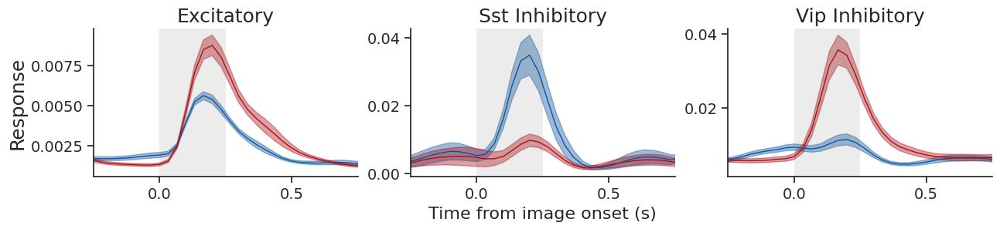

In [49]:

df = change_mdf.copy()
# csids = [1086573689, 1086573585, 1086577313, 1086577516, 1086560073, 1086560671, 1086562892, 1086563531,  1086568099, ]
# df = df[df.cell_specimen_id.isin(csids==False)]
# df = df[df.cell_specimen_id.isin([1086560073, 1086562892, 1086577313])==False]
# df = df[df.ophys_experiment_id.isin([[920288845, 920288849]])==False]
# df = df[df.ophys_session_id.isin([919888953])==False]
# for just familiar & novel (no novel+)
# df = df[df.ophys_experiment_id.isin(platform_experiments.index.values)]
df = df[df.experience_level.isin(['Familiar', 'Novel'])]
print(len(df.ophys_experiment_id.unique()))
# df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-0.25, 0.75]

suffix = '_images_F_N'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'all', axes_column, hue_column, 
                                                        horizontal=True, xlabel='Time from image onset (s)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=None, folder=folder, suffix=suffix)


267


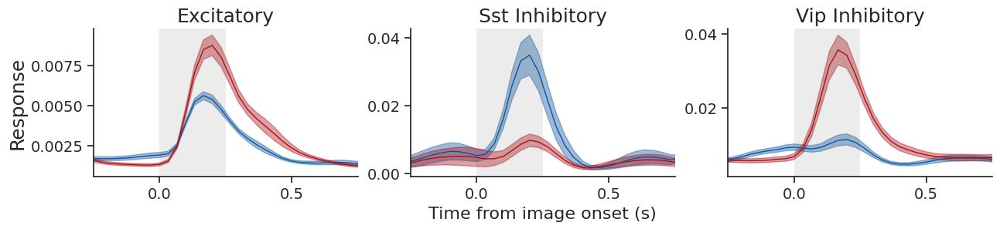

In [50]:

df = change_mdf.copy()
csids = [1086560073, 1086562892, 1086577313, 1086560671]
df = df[df.cell_specimen_id.isin(csids)==False]
# df = df[df.ophys_session_id.isin([919888953])==False]
# for just familiar & novel (no novel+)
# df = df[df.ophys_experiment_id.isin(platform_experiments.index.values)]
df = df[df.experience_level.isin(['Familiar', 'Novel'])]
print(len(df.ophys_experiment_id.unique()))
# df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-0.25, 0.75]

suffix = '_images_F_N'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'all', axes_column, hue_column, 
                                                        horizontal=True, xlabel='Time from image onset (s)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=None, folder=folder, suffix=suffix)


267


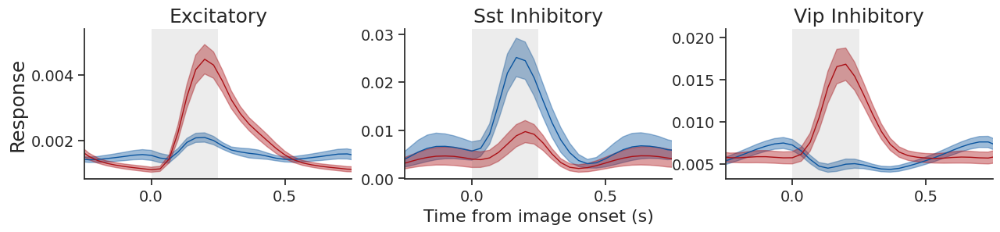

In [51]:
df = image_mdf.copy()
# df = df[df.ophys_session_id.isin([919888953])==False]
# for just familiar & novel (no novel+)
# df = df[df.ophys_experiment_id.isin(platform_experiments.index.values)]
df = df[df.experience_level.isin(['Familiar', 'Novel'])]
print(len(df.ophys_experiment_id.unique()))
# df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-0.25, 0.75]

suffix = '_images_F_N'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'all', axes_column, hue_column, 
                                                        horizontal=True, xlabel='Time from image onset (s)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=None, folder=folder, suffix=suffix)


267


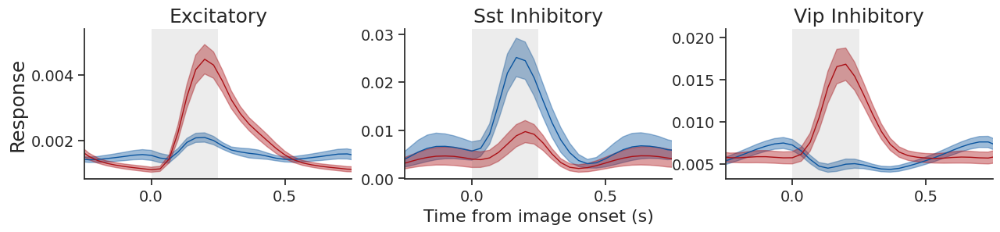

In [52]:
# 1086560073, 1086562892
df = image_mdf.copy()
# csids = [1086573689, 1086573585, 1086577313, 1086577516, 1086560073, 1086560671, 1086562892, 1086563531,  1086568099, ]
# csids = [1086573689, 1086573585, 1086577313, 1086577516, 1086560073,  1086560671, 1086562892, ]#1086563531,  1086568099, ]
# csids = [1086560073, 1086562892, 1086577313, 1086562892, 1086560671]
csids = [1086560073, 1086562892, 1086577313, 1086560671]
df = df[df.cell_specimen_id.isin(csids)==False]
# df = df[df.ophys_session_id.isin([919888953])==False]
# for just familiar & novel (no novel+)
# df = df[df.ophys_experiment_id.isin(platform_experiments.index.values)]
df = df[df.experience_level.isin(['Familiar', 'Novel'])]
print(len(df.ophys_experiment_id.unique()))
# df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-0.25, 0.75]

suffix = '_images_F_N'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'all', axes_column, hue_column, 
                                                        horizontal=True, xlabel='Time from image onset (s)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=None, folder=folder, suffix=suffix)


In [53]:
# df = image_mdf.copy()
# # for just familiar & novel (no novel+)
# # csids = [1086560073, 1086562892, 1086577313, 1086560671]
# # df = df[df.cell_specimen_id.isin(csids)==False]

# df = df[df.ophys_experiment_id.isin(platform_experiments.index.values)]
# df = df[df.experience_level.isin(['Familiar', 'Novel'])]
# print(len(df.ophys_experiment_id.unique()))
# # df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

# axes_column = 'cell_type'
# hue_column = 'experience_level'
# palette = utils.get_experience_level_colors()
# # xlim_seconds=[-1., 1.5]
# xlim_seconds=[-0.25, 0.75]

# suffix = '_images_F_N'

# ax = ppf.plot_population_averages_for_conditions(df, data_type, 'all', axes_column, hue_column, 
#                                                         horizontal=True, xlabel='Time from image onset (s)',
#                                                         xlim_seconds=xlim_seconds, interval_sec=0.5,
#                                                         palette=palette, ax=None, title=None, suptitle=None,
#                                                         save_dir=save_dir, folder=folder, suffix=suffix)


#### heatmaps

array([<Axes: title={'center': 'Familiar'}, ylabel='Excitatory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: ylabel='Sst Inhibitory\ncells'>, <Axes: >, <Axes: >,
       <Axes: ylabel='Vip Inhibitory\ncells'>,
       <Axes: xlabel='Time from image onset (s)'>, <Axes: >], dtype=object)

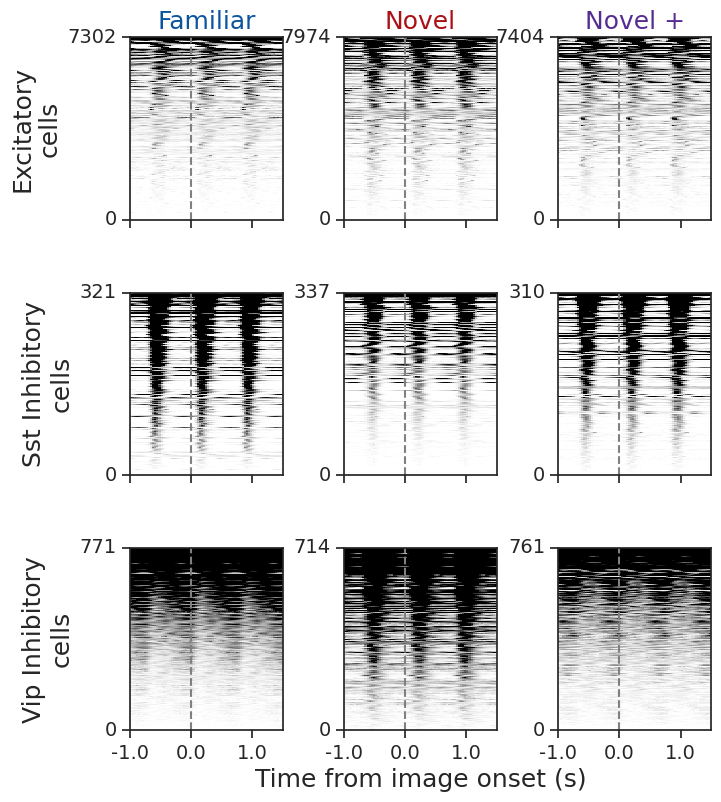

In [62]:
df = image_mdf.copy()

xlim_seconds = [-1, 1.5]

event_type = 'all'

timestamps = df.trace_timestamps.values[0]
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type, row_condition, col_condition, 
                                          cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time from image onset (s)',
                                          microscope=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='', ax=None)


# ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
#                                           row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
#                                           microscope=None, vmax=None, xlim_seconds=[-2, 2], match_cells=False, cbar=True,
#                                           save_dir=save_dir, folder=folder, suffix='_cbar', ax=None)

array([<Axes: title={'center': 'Familiar'}, ylabel='Excitatory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: ylabel='Sst Inhibitory\ncells'>, <Axes: >, <Axes: >,
       <Axes: ylabel='Vip Inhibitory\ncells'>,
       <Axes: xlabel='Time from image onset (s)'>, <Axes: >], dtype=object)

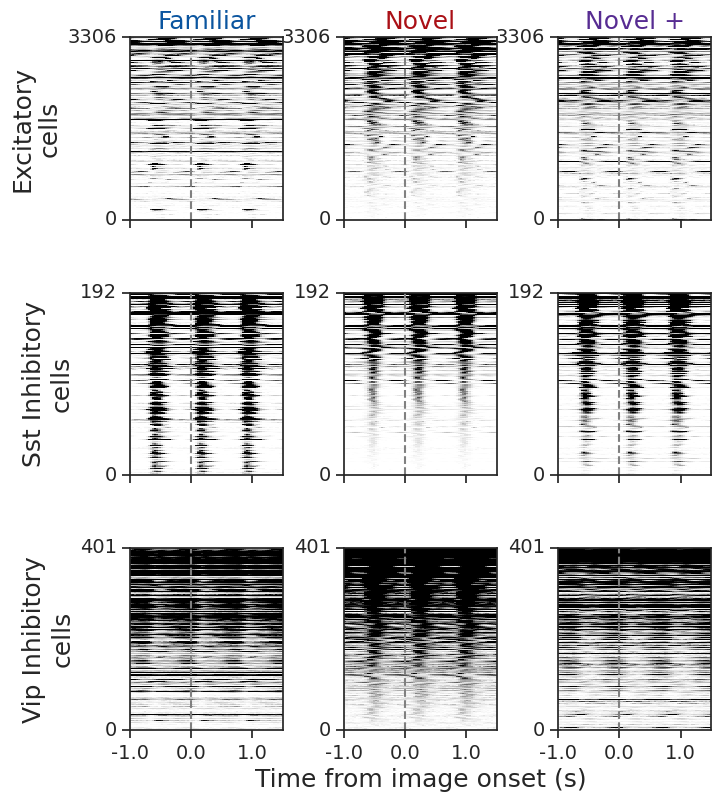

In [67]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(image_mdf)
xlim_seconds = [-1, 1.5]

ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'all', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time from image onset (s)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='_matched', ax=None)


### average image responses 

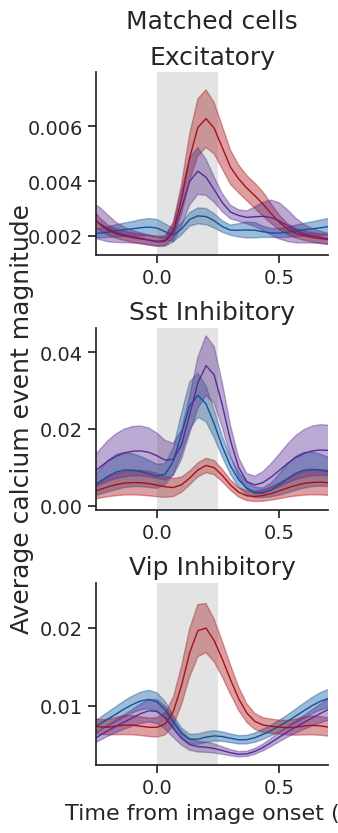

In [68]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(image_mdf)
xlim_seconds = [-0.25, 0.7]

suffix = '_images_matched'

axes_column = 'cell_type'
hue_column = 'experience_level'
ax = ppf.plot_population_averages_for_conditions(matched, data_type, 'all', axes_column, hue_column,
                                                    horizontal=False, xlabel='Time from image onset (s)',
                                                    ylabel='Average calcium event magnitude', legend=False,
                                                    xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                    palette=palette, ax=None, title=None, suptitle='Matched cells',
                                                    save_dir=save_dir, folder=folder, suffix=suffix)


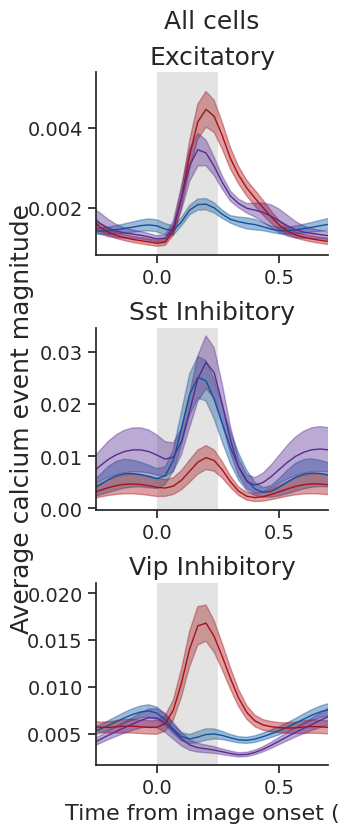

In [70]:
# matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(image_mdf)
xlim_seconds = [-0.25, 0.7]

suffix = '_images'

axes_column = 'cell_type'
hue_column = 'experience_level'
ax = ppf.plot_population_averages_for_conditions(image_mdf, data_type, 'all', axes_column, hue_column,
                                                    horizontal=False, xlabel='Time from image onset (s)',
                                                    ylabel='Average calcium event magnitude', legend=False,
                                                    xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                    palette=palette, ax=None, title=None, suptitle='All cells',
                                                    save_dir=save_dir, folder=folder, suffix=suffix)


### changes

400


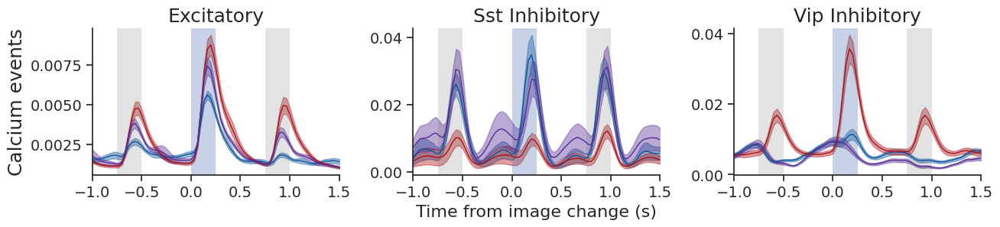

In [71]:
# with Novel +
df = change_mdf.copy()
# for just familiar & novel (no novel+)
# df = df[df.experience_level.isin(['Familiar', 'Novel 1'])]
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds=[-1., 1.5]
# xlim_seconds=[-1, 0.75]
# xlim_seconds = [-0.25, 0.7]


suffix = '_changes_only'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, ylabel='Calcium events',
                                                        horizontal=True, xlabel='Time from image change (s)', 
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5, legend=False,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


400


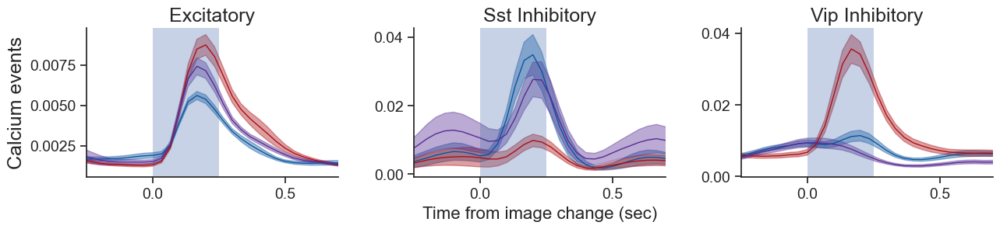

In [ ]:
# with Novel +
df = change_mdf.copy()
# for just familiar & novel (no novel+)
# df = df[df.experience_level.isin(['Familiar', 'Novel 1'])]
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
# xlim_seconds=[-1, 0.75]
xlim_seconds = [-0.25, 0.7]


suffix = '_changes_only'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, ylabel='Calcium events',
                                                        horizontal=True, xlabel='Time from image change (s)', 
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5, legend=False,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


400


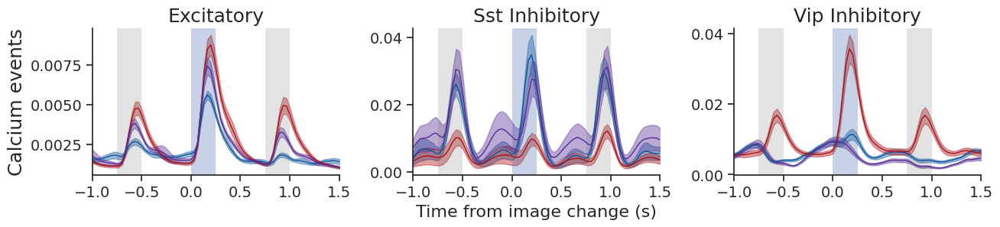

In [72]:
# with Novel +
df = change_mdf.copy()
# for just familiar & novel (no novel+)
# df = df[df.experience_level.isin(['Familiar', 'Novel 1'])]
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds=[-1., 1.5]
# xlim_seconds=[-1, 0.75]

suffix = '_changes_horiz'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, ylabel='Calcium events',
                                                        horizontal=True, xlabel='Time from image change (s)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5, legend=False,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


400


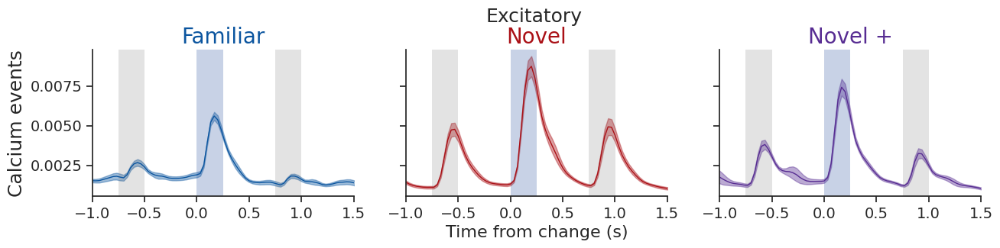

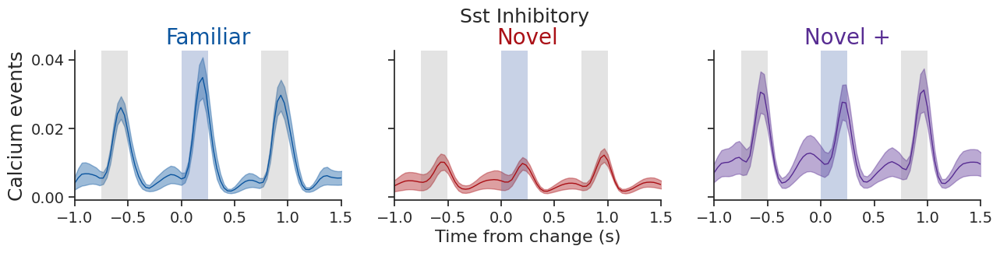

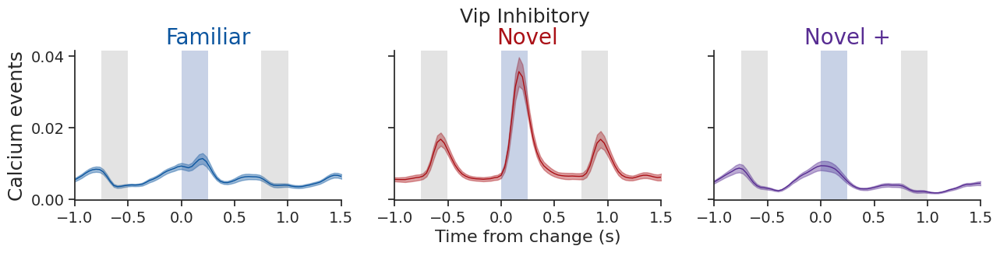

In [73]:

df = change_mdf.copy()
print(len(df.ophys_experiment_id.unique()))

axes_column = 'experience_level'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds=[-1, 0.75]
xlim_seconds=[-1., 1.5]

cell_types = utils.get_cell_types()

suffix = '_changes_split'

for i, cell_type in enumerate(cell_types):
    df = change_mdf[(change_mdf.cell_type == cell_type)]
    ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, 
                                                ylabel='Calcium events', sharey=True,
                                                horizontal=True, xlabel='Time from change (s)',
                                                xlim_seconds=xlim_seconds, interval_sec=0.5, legend=False,
                                                palette=palette, ax=None, title=None, suptitle=cell_type,
                                                save_dir=None, folder=folder, suffix=suffix)


400


/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

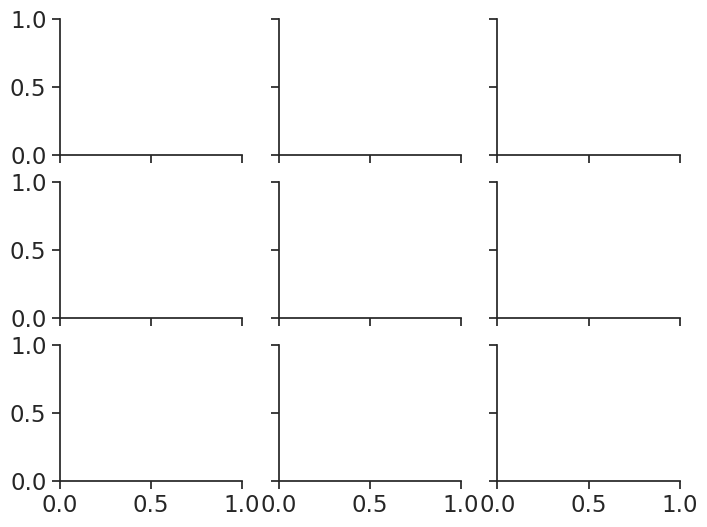

In [74]:

df = change_mdf.copy()
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1, 0.75]
xlim_seconds=[-1., 1.5]

suffix = '_changes_stacked'

ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='Time from omission (s)',
                                                              ylabel='Calcium events', 
                                                              data_type=data_type, event_type='changes', interval_sec=0.5,
                                                              save_dir=save_dir, folder=folder, suffix=suffix, ax=None)

array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Excitatory\ncells'>,
       <AxesSubplot:title={'center':'Novel'}>,
       <AxesSubplot:title={'center':'Novel +'}>,
       <AxesSubplot:ylabel='Sst Inhibitory\ncells'>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:ylabel='Vip Inhibitory\ncells'>,
       <AxesSubplot:xlabel='Time from image change (s)'>, <AxesSubplot:>],
      dtype=object)

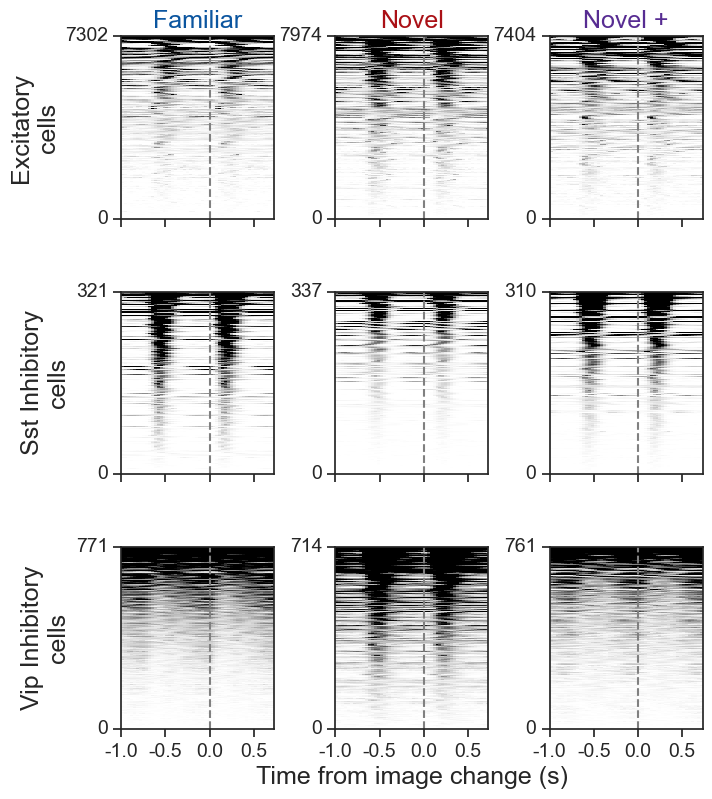

In [ ]:
df = image_mdf.copy()

xlim_seconds = [-1, 0.75]
xlim_seconds=[-1., 1.5]

event_type = 'all'

timestamps = df.trace_timestamps.values[0]
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type, row_condition, col_condition, 
                                          cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time from image change (s)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
                                          save_dir=None, folder=folder, suffix='', ax=None)

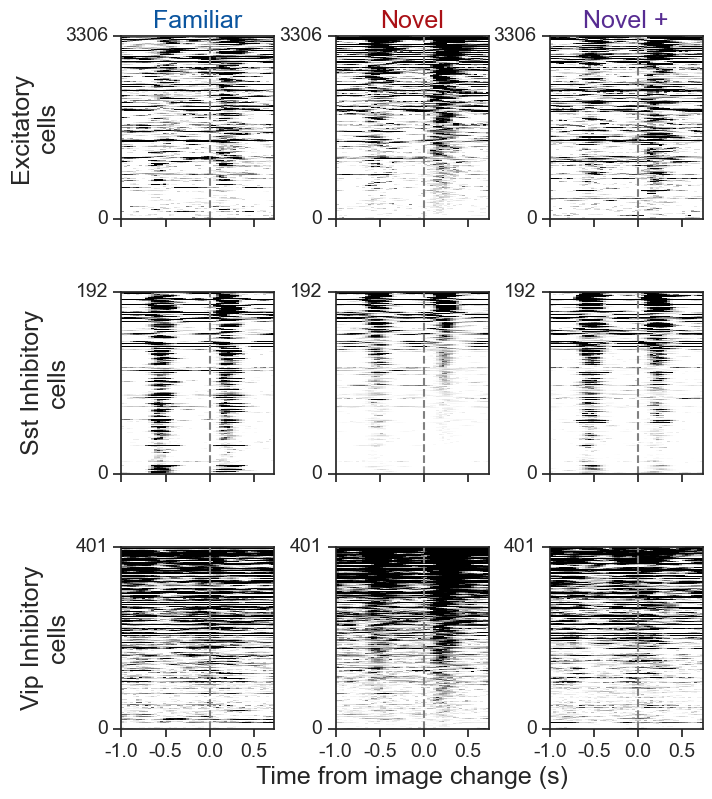

In [ ]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(change_mdf)
xlim_seconds = [-1, 0.75]
xlim_seconds=[-1., 1.5]


ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'all', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time from image change (s)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=False,
                                          save_dir=None, folder=folder, suffix='_matched', ax=None);


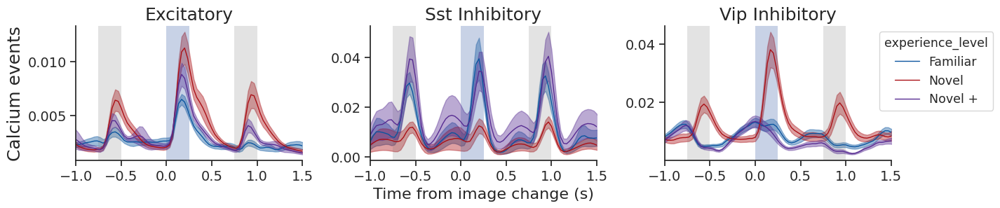

In [75]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(change_mdf)
xlim_seconds = [-1, 0.75]
xlim_seconds=[-1., 1.5]

suffix = '_changes_matched'

ax = ppf.plot_population_averages_for_conditions(matched, data_type, 'changes', axes_column, hue_column, 
                                                        ylabel='Calcium events', legend=True,
                                                        horizontal=True, xlabel='Time from image change (s)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


### Omissions

401


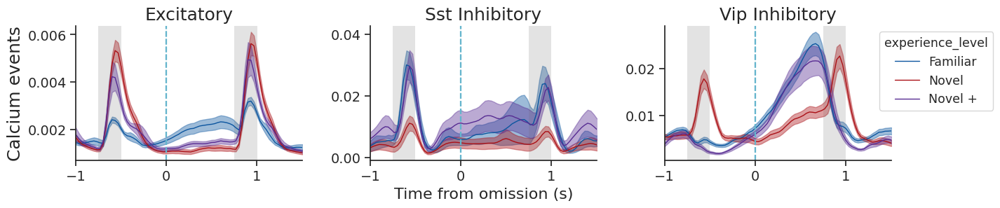

In [76]:

df = omission_mdf.copy()
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.1, 1.5]
xlim_seconds=[-1., 1.5]

suffix = '_omissions'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions', axes_column, hue_column, 
                                                ylabel='Calcium events', legend=True,
                                                horizontal=True, xlabel='Time from omission (s)',
                                                xlim_seconds=xlim_seconds, interval_sec=1,
                                                palette=palette, ax=None, title=None, suptitle=None,
                                                save_dir=save_dir, folder=folder, suffix=suffix)


401


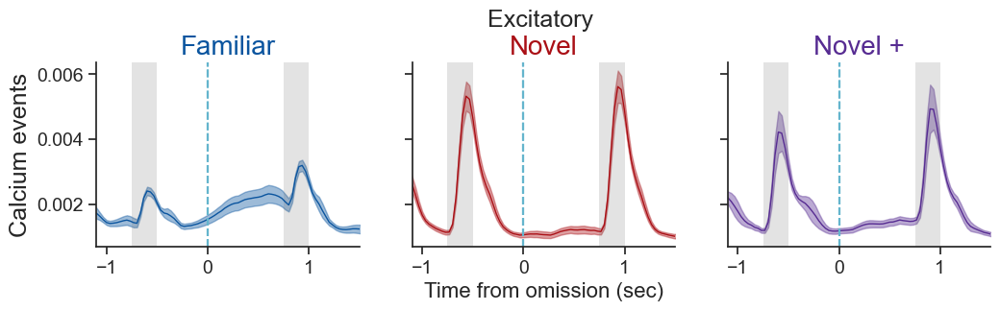

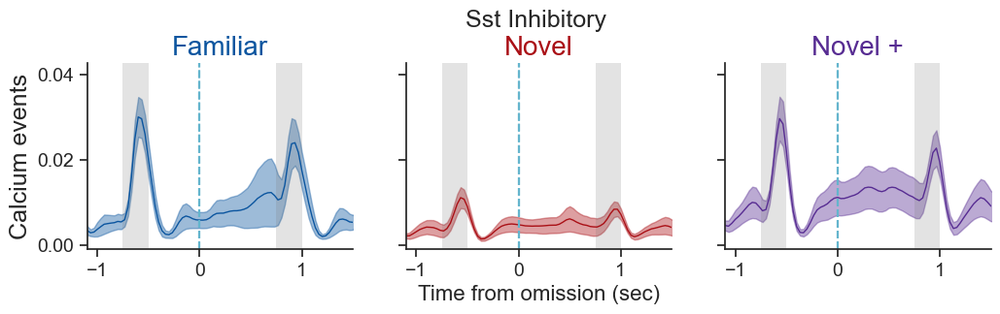

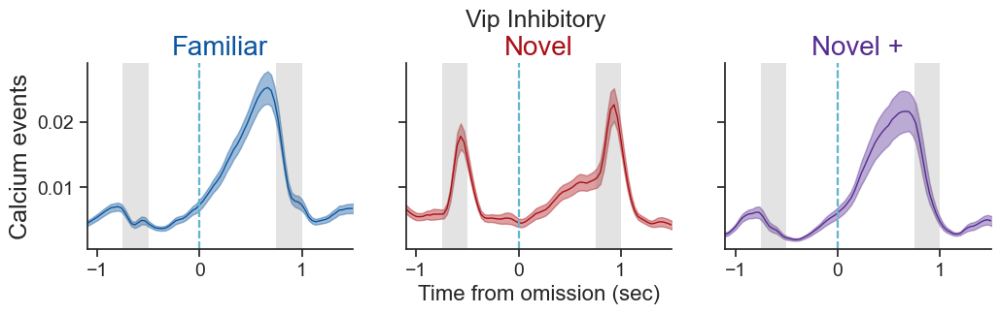

In [ ]:

df = omission_mdf.copy()
print(len(df.ophys_experiment_id.unique()))

axes_column = 'experience_level'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.1, 1.5]

cell_types = utils.get_cell_types()

for i, cell_type in enumerate(cell_types):
    df = omission_mdf[(omission_mdf.cell_type == cell_type)]
    ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions', axes_column, hue_column, 
                                                ylabel='Calcium events', sharey=True,
                                                horizontal=True, xlabel='Time from omission (s)',
                                                xlim_seconds=xlim_seconds, interval_sec=1, legend=False,
                                                palette=palette, ax=None, title=None, suptitle=cell_type,
                                                save_dir=None, folder=folder, suffix=suffix)


401


/opt/conda/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

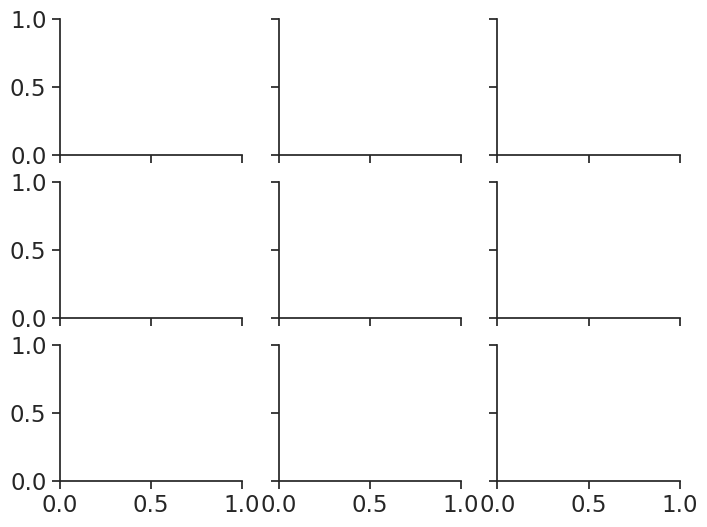

In [77]:

df = omission_mdf.copy()
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.1, 1.5]
xlim_seconds=[-1., 1.5]

suffix = '_omissions'

ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='Time from omission (s)',
                                                              ylabel='Calcium events', 
                                                              data_type=data_type, event_type='omissions', interval_sec=1,
                                                              save_dir=save_dir, folder=folder, suffix=suffix, ax=None)

In [ ]:
# # Vip only
# df = omission_mdf.copy()
# df = df[df.cre_line=='Vip-IRES-Cre']

# xlim_seconds = [-1.1, 1.5]

# timestamps = df.trace_timestamps.values[0]
# timestamps = np.asarray([np.round(time,3) for time in timestamps])
# row_condition = 'cell_type'
# col_condition = 'experience_level'
# cols_to_sort_by = ['mean_response']

# ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, 'omissions', row_condition, col_condition, 
#                                           cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time from omission (s)',
#                                           microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
#                                           save_dir=None, folder=folder, suffix='_vip', ax=None)


# # ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
# #                                           row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
# #                                           microscope=None, vmax=None, xlim_seconds=[-2, 2], match_cells=False, cbar=True,
# #                                           save_dir=save_dir, folder=folder, suffix='_cbar', ax=None)

array([<Axes: title={'center': 'Familiar'}, ylabel='Excitatory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: ylabel='Sst Inhibitory\ncells'>, <Axes: >, <Axes: >,
       <Axes: ylabel='Vip Inhibitory\ncells'>,
       <Axes: xlabel='Time from omission (s)'>, <Axes: >], dtype=object)

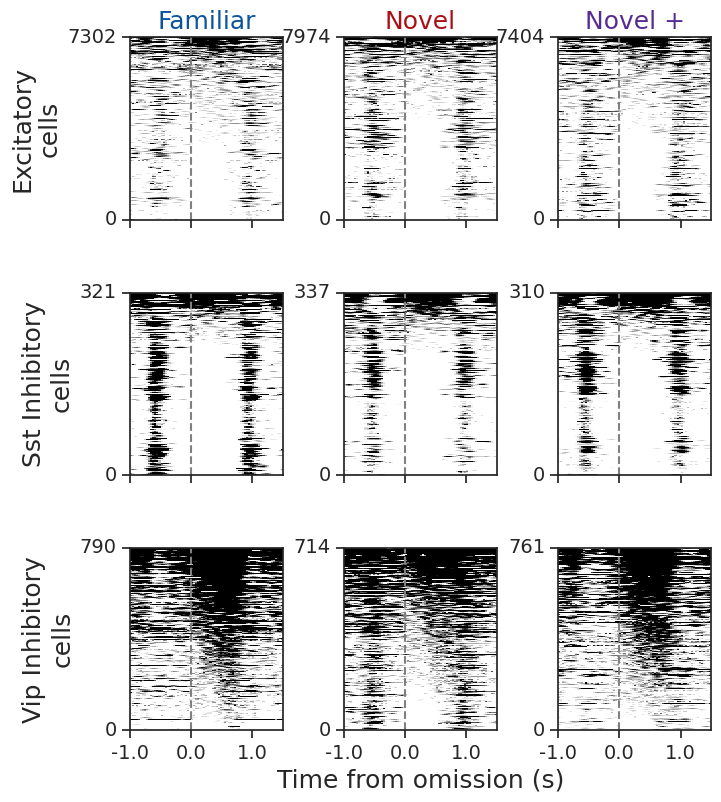

In [78]:
df = omission_mdf.copy()

xlim_seconds = [-1.1, 1.5]
xlim_seconds=[-1., 1.5]

timestamps = df.trace_timestamps.values[0]
timestamps = np.asarray([np.round(time,3) for time in timestamps])
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, 'omissions', row_condition, col_condition, 
                                          cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time from omission (s)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
                                          save_dir=None, folder=folder, suffix='', ax=None)


# ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
#                                           row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
#                                           microscope=None, vmax=None, xlim_seconds=[-2, 2], match_cells=False, cbar=True,
#                                           save_dir=save_dir, folder=folder, suffix='_cbar', ax=None)

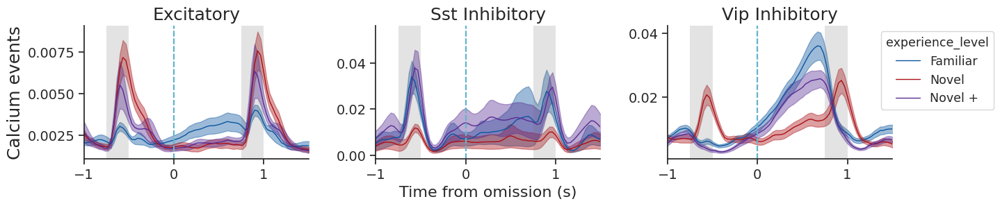

In [79]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(omission_mdf)
xlim_seconds=[-1., 1.5]

suffix = '_omissions_matched'

ax = ppf.plot_population_averages_for_conditions(matched, data_type, 'omissions', axes_column, hue_column, 
                                                horizontal=True, xlabel='Time from omission (s)',
                                                ylabel='Calcium events', legend=True,
                                                xlim_seconds=xlim_seconds, interval_sec=1,
                                                palette=palette, ax=None, title=None, suptitle=None,
                                                save_dir=save_dir, folder=folder, suffix=suffix)


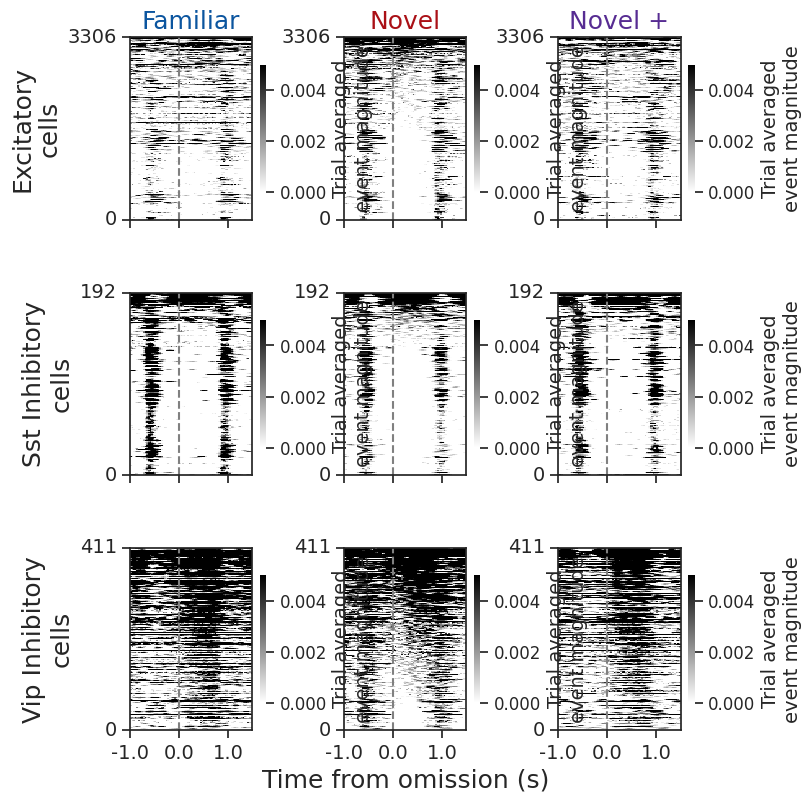

In [80]:
timestamps = omission_mdf.trace_timestamps.values[0]
timestamps = np.asarray([np.round(time,3) for time in timestamps])

matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(omission_mdf)
xlim_seconds=[-1., 1.5]

ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'omissions', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time from omission (s)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=True,
                                          cbar_label='Trial averaged\nevent magnitude', save_dir=None, folder=folder, suffix='_cbar', ax=None);


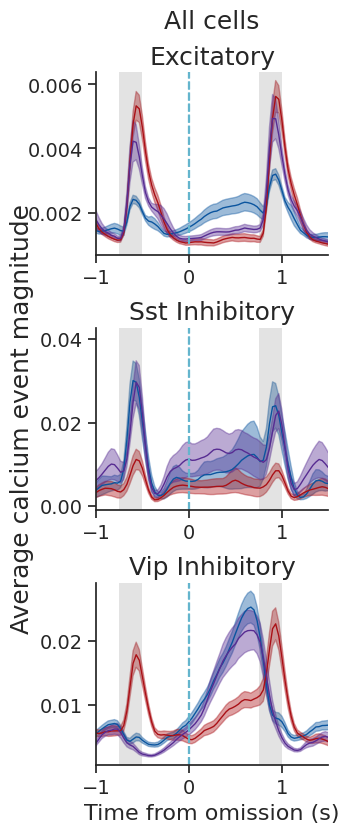

In [81]:
# matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(image_mdf)
# xlim_seconds = [-0.25, 0.7]

suffix = '_omisisons_all'

xlim_seconds=[-1., 1.5]

axes_column = 'cell_type'
hue_column = 'experience_level'
ax = ppf.plot_population_averages_for_conditions(omission_mdf, data_type, 'omissions', axes_column, hue_column,
                                                    horizontal=False, xlabel='Time from omission (s)',
                                                    ylabel='Average calcium event magnitude', legend=False,
                                                    xlim_seconds=xlim_seconds, interval_sec=1,
                                                    palette=palette, ax=None, title=None, suptitle='All cells',
                                                    save_dir=save_dir, folder=folder, suffix=suffix)


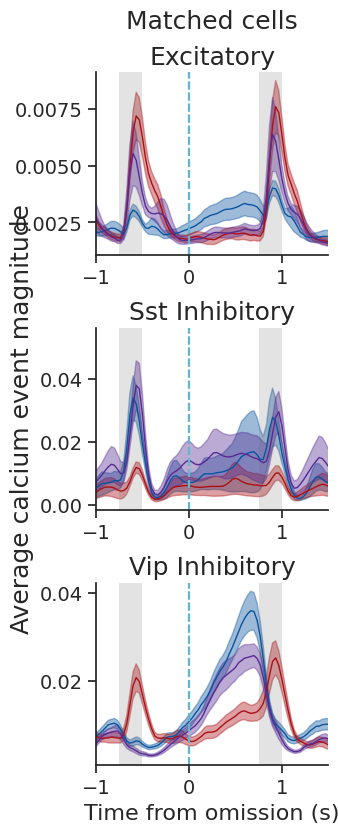

In [82]:
suffix = '_omissions_matched'

timestamps = omission_mdf.trace_timestamps.values[0]
timestamps = np.asarray([np.round(time,3) for time in timestamps])

matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(omission_mdf)
xlim_seconds=[-1., 1.5]

axes_column = 'cell_type'
hue_column = 'experience_level'
ax = ppf.plot_population_averages_for_conditions(matched, data_type, 'omissions', axes_column, hue_column,
                                                    horizontal=False, xlabel='Time from omission (s)',
                                                    ylabel='Average calcium event magnitude', legend=False,
                                                    xlim_seconds=xlim_seconds, interval_sec=1,
                                                    palette=palette, ax=None, title=None, suptitle='Matched cells',
                                                    save_dir=save_dir, folder=folder, suffix=suffix)


#### Change and omission population averages for each cohort

In [83]:
# compare cell counts for areas & depths after matching over cohorts
import visual_behavior.data_access.utilities as utilities

df = change_mdf.copy()
# limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
matched_oeids = utils.get_experiments_matched_across_project_codes(df)
df = df[df.ophys_experiment_id.isin(matched_oeids)]

utilities.count_mice_expts_containers_cells(df, conditions_to_group=['cell_type', 'project_code', 'binned_depth'], include_matched_cells=True)

n_mouse_id  \
cell_type      project_code             binned_depth               
Excitatory     VisualBehavior           175                    6   
                                        375                    7   
               VisualBehaviorMultiscope 175                    3   
                                        375                    6   
               VisualBehaviorTask1B     175                    7   
                                        375                    6   
Sst Inhibitory VisualBehavior           275                    6   
               VisualBehaviorMultiscope 275                    3   
               VisualBehaviorTask1B     275                    4   
Vip Inhibitory VisualBehavior           175                    6   
               VisualBehaviorMultiscope 175                    3   
               VisualBehaviorTask1B     175                    5   

                                                      n_ophys_session_id  \
cell_type      project_code             binned_depth                       
Excitatory     VisualBehavior           175                           18   
                                        375                           21   
               VisualBehaviorMultiscope 175                            9   
                                        375                           18   
               VisualBehaviorTask1B     175                           21   
                                        375                           18   
Sst Inhibitory VisualBehavior           275                           18   
               VisualBehaviorMultiscope 275                           10   
               VisualBehaviorTask1B     275                           12   
Vip Inhibitory VisualBehavior           175                           18   
               VisualBehaviorMultiscope 175                            9   
               VisualBehaviorTask1B     175                           15   

                                                      n_ophys_experiment_id  \
cell_type      project_code             binned_depth                          
Excitatory     VisualBehavior           175                              18   
                                        375                              21   
               VisualBehaviorMultiscope 175                               9   
                                        375                              18   
               VisualBehaviorTask1B     175                              21   
                                        375                              18   
Sst Inhibitory VisualBehavior           275                              18   
               VisualBehaviorMultiscope 275                              12   
               VisualBehaviorTask1B     275                              12   
Vip Inhibitory VisualBehavior           175                              18   
               VisualBehaviorMultiscope 175                               9   
               VisualBehaviorTask1B     175                              15   

                                                      n_ophys_container_id  \
cell_type      project_code             binned_depth                         
Excitatory     VisualBehavior           175                              6   
                                        375                              7   
               VisualBehaviorMultiscope 175                              3   
                                        375                              6   
               VisualBehaviorTask1B     175                              7   
                                        375                              6   
Sst Inhibitory VisualBehavior           275                              6   
               VisualBehaviorMultiscope 275                              4   
               VisualBehaviorTask1B     275                              4   
Vip Inhibitory VisualBehavior           175                            

In [ ]:

# df = change_mdf.copy()
# # limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
# matched_oeids = utils.get_experiments_matched_across_project_codes(df)
# df = df[df.ophys_experiment_id.isin(matched_oeids)]
# print(len(df.ophys_experiment_id.unique()))

# axes_column = 'cell_type'
# hue_column = 'experience_level'
# palette = utils.get_experience_level_colors()
# xlim_seconds = [-1, 0.75]

# project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

# for i, project_code in enumerate(project_codes): 
#     suffix = '_changes_'+project_code
#     suptitle = project_code+'\nCohort '+str(i+1)
#     tmp = df[df.project_code==project_code]
#     tmp = tmp[tmp.mean_response<np.percentile(tmp.mean_response.values, 99.7)]
#     ax = ppf.plot_population_averages_for_conditions(tmp, data_type, 'omissions', axes_column, hue_column, 
#                                                     ylabel='Averaged calcium events', legend=True,
#                                                     horizontal=False, xlabel='Time from change (s)',
#                                                     xlim_seconds=xlim_seconds, interval_sec=1,
#                                                     palette=palette, ax=None, title=None, suptitle=suptitle,
#                                                     save_dir=save_dir, folder=folder, suffix=suffix)


In [ ]:

# df = omission_mdf.copy()
# # limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
# matched_oeids = utils.get_experiments_matched_across_project_codes(df)
# df = df[df.ophys_experiment_id.isin(matched_oeids)]
# print(len(df.ophys_experiment_id.unique()))

# axes_column = 'cell_type'
# hue_column = 'experience_level'
# palette = utils.get_experience_level_colors()
# xlim_seconds = [-1.1, 1.5]

# project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

# for i, project_code in enumerate(project_codes): 
#     suffix = '_omissions_'+project_code
#     suptitle = project_code+'\nCohort '+str(i+1)
#     tmp = df[df.project_code==project_code]
#     tmp = tmp[tmp.mean_response<np.percentile(tmp.mean_response.values, 99.7)]
#     ax = ppf.plot_population_averages_for_conditions(tmp, data_type, 'omissions', axes_column, hue_column, 
#                                                     ylabel='Averaged calcium events', legend=True,
#                                                     horizontal=False, xlabel='Time from omission (s)',
#                                                     xlim_seconds=xlim_seconds, interval_sec=1,
#                                                     palette=palette, ax=None, title=None, suptitle=suptitle,
#                                                     save_dir=save_dir, folder=folder, suffix=suffix)


#### By imaging depth, meso only 

93


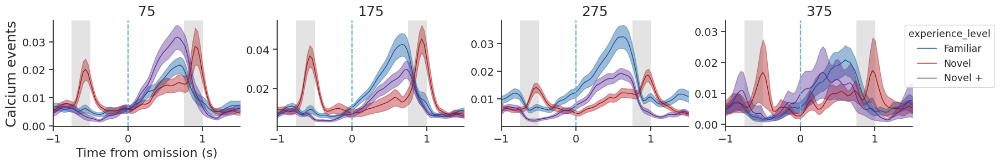

In [84]:

df = omission_mdf.copy()
# limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
# matched_oeids = utils.get_experiments_matched_across_project_codes(df)
# df = df[df.ophys_experiment_id.isin(matched_oeids)]
df = df[df.project_code=='VisualBehaviorMultiscope']
df = df[df.cre_line=='Vip-IRES-Cre']
print(len(df.ophys_experiment_id.unique()))

axes_column = 'binned_depth'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds=[-1., 1.5]

# project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']


# for i, binned_depth in enumerate(df.binned_depth.unique()): 
suffix = '_omissions_Vip_depth'
# suptitle = str(binned_depth)+' um depth'
# tmp = df[df.binned_depth==binned_depth]
tmp = df[df.mean_response<np.percentile(df.mean_response.values, 99.7)]
ax = ppf.plot_population_averages_for_conditions(tmp, data_type, 'omissions', axes_column, hue_column, 
                                                ylabel='Calcium events', legend=True,
                                                horizontal=True, xlabel='Time from omission (s)',
                                                xlim_seconds=xlim_seconds, interval_sec=1, sharey=False,
                                                palette=palette, ax=None, title=None, suptitle=None,
                                                save_dir=None, folder=folder, suffix=suffix)


In [87]:
#### Fraction image and omission responsive cells by depth 

### fraction responsive cells 

#### images

In [88]:
folder = 'response_metrics'

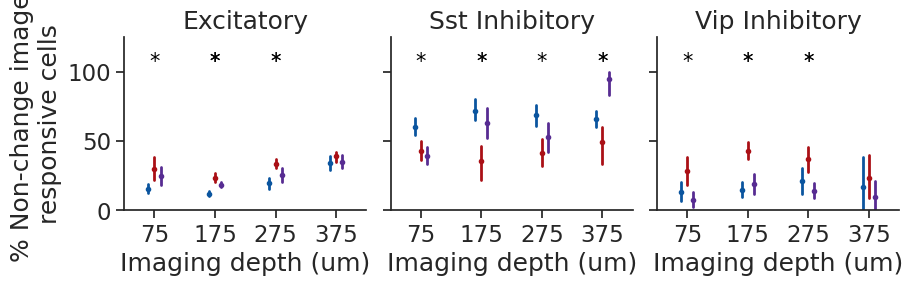

In [89]:
df = each_image_mdf[(each_image_mdf.pref_stim==True) & (each_image_mdf.is_change==False)]
fraction_responsive = ppf.get_fraction_responsive_cells(df, conditions=['cell_type', 'experience_level', 'ophys_container_id', 'ophys_experiment_id'],
                                                        responsiveness_threshold=0.1)
fraction_responsive = fraction_responsive.reset_index()
fraction_responsive = fraction_responsive.merge(platform_experiments[['ophys_container_id', 'binned_depth', 'imaging_depth']], on='ophys_container_id')
fraction_responsive = fraction_responsive.drop_duplicates(subset=['ophys_container_id', 'ophys_experiment_id'])
fraction_responsive['percent_responsive'] = fraction_responsive['fraction_responsive']*100

depths = np.sort(fraction_responsive.binned_depth.unique())

cell_types = utils.get_cell_types()
figsize = (10, 2.25)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
ax = ax.ravel()
for i, cell_type in enumerate(cell_types): 
    data = fraction_responsive[fraction_responsive.cell_type==cell_type]
    ax[i] = sns.pointplot(data=data,
                    x='binned_depth', y='percent_responsive', hue='experience_level', linestyle='none', order=depths,
                    markers='.', markersize=4, err_kws={'linewidth': 2}, palette=experience_level_colors, dodge=0.2, ax=ax[i])
    ax[i].set_title(cell_type)
    # ax[i].legend(fontsize='xx-small')
    ax[i].get_legend().remove()
    ax[i].set_xlabel('Imaging depth (um)')
    ax[i].set_ylabel('% Non-change image \nresponsive cells')
    ax[i].set_ylim(0, 100)

    ax[i], tukey_table = ppf.add_stats_to_plot_for_hues(data, 'percent_responsive', ax[i],
                                                            xorder=depths, x='binned_depth', hue='experience_level')
plt.subplots_adjust(wspace=0.1)

filename = 'percent_pref_image_responsive_cells_by_depth_stats'
utils.save_figure(fig, figsize, save_dir, folder, filename)

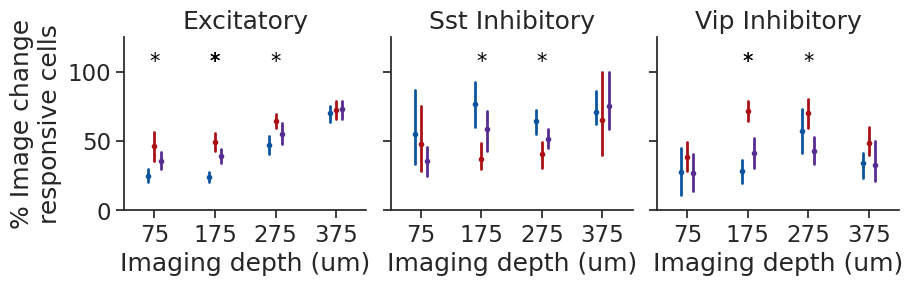

In [90]:
df = each_image_mdf[(each_image_mdf.pref_stim==True) & (each_image_mdf.is_change==True)]
fraction_responsive = ppf.get_fraction_responsive_cells(df, conditions=['cell_type', 'experience_level', 'ophys_container_id', 'ophys_experiment_id'],
                                                        responsiveness_threshold=0.1)
fraction_responsive = fraction_responsive.reset_index()
fraction_responsive = fraction_responsive.merge(platform_experiments[['ophys_container_id', 'binned_depth', 'imaging_depth']], on='ophys_container_id')
fraction_responsive = fraction_responsive.drop_duplicates(subset=['ophys_container_id', 'ophys_experiment_id'])
fraction_responsive['percent_responsive'] = fraction_responsive['fraction_responsive']*100

depths = np.sort(fraction_responsive.binned_depth.unique())

cell_types = utils.get_cell_types()
figsize = (10, 2.25)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
ax = ax.ravel()
for i, cell_type in enumerate(cell_types): 
    data = fraction_responsive[fraction_responsive.cell_type==cell_type]
    ax[i] = sns.pointplot(data=data,
                    x='binned_depth', y='percent_responsive', hue='experience_level', linestyle='none', order=depths,
                    markers='.', markersize=4, err_kws={'linewidth': 2}, palette=experience_level_colors, dodge=0.2, ax=ax[i])
    ax[i].set_title(cell_type)
    # ax[i].legend(fontsize='xx-small')
    ax[i].get_legend().remove()
    ax[i].set_xlabel('Imaging depth (um)')
    ax[i].set_ylabel('% Image change\nresponsive cells')
    ax[i].set_ylim(0, 100)

    ax[i], tukey_table = ppf.add_stats_to_plot_for_hues(data, 'percent_responsive', ax[i],
                                                            xorder=depths, x='binned_depth', hue='experience_level')
plt.subplots_adjust(wspace=0.1)

filename = 'percent_pref_image_change_responsive_cells_by_depth_stats'
utils.save_figure(fig, figsize, save_dir, folder, filename)

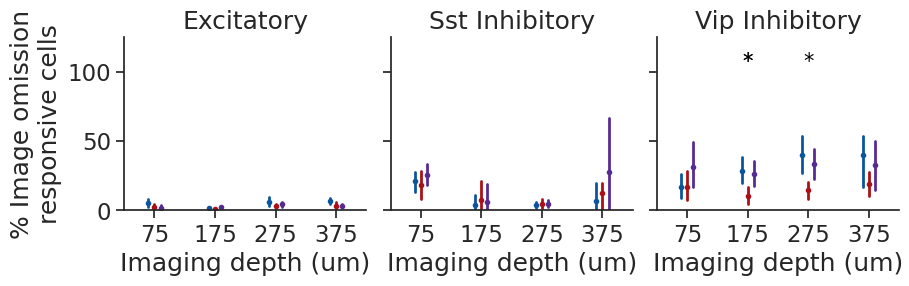

In [91]:
df = omission_mdf.copy()
fraction_responsive = ppf.get_fraction_responsive_cells(df, conditions=['cell_type', 'experience_level', 'ophys_container_id', 'ophys_experiment_id'],
                                                        responsiveness_threshold=0.1)
fraction_responsive = fraction_responsive.reset_index()
fraction_responsive = fraction_responsive.merge(platform_experiments[['ophys_container_id', 'binned_depth', 'imaging_depth']], on='ophys_container_id')
fraction_responsive = fraction_responsive.drop_duplicates(subset=['ophys_container_id', 'ophys_experiment_id'])
fraction_responsive['percent_responsive'] = fraction_responsive['fraction_responsive']*100

depths = np.sort(fraction_responsive.binned_depth.unique())

cell_types = utils.get_cell_types()
figsize = (10, 2.25)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
ax = ax.ravel()
for i, cell_type in enumerate(cell_types): 
    data = fraction_responsive[fraction_responsive.cell_type==cell_type]
    ax[i] = sns.pointplot(data=data,
                    x='binned_depth', y='percent_responsive', hue='experience_level', linestyle='none', order=depths,
                    markers='.', markersize=4, err_kws={'linewidth': 2}, palette=experience_level_colors, dodge=0.2, ax=ax[i])
    ax[i].set_title(cell_type)
    # ax[i].legend(fontsize='xx-small')
    ax[i].get_legend().remove()
    ax[i].set_xlabel('Imaging depth (um)')
    ax[i].set_ylabel('% Image omission\nresponsive cells')
    ax[i].set_ylim(0, 100)

    ax[i], tukey_table = ppf.add_stats_to_plot_for_hues(data, 'percent_responsive', ax[i],
                                                            xorder=depths, x='binned_depth', hue='experience_level')
plt.subplots_adjust(wspace=0.1)

filename = 'percent_pref_image_omission_responsive_cells_by_depth_stats'
utils.save_figure(fig, figsize, save_dir, folder, filename)

In [92]:
df = each_image_mdf[each_image_mdf.pref_stim==True]

fraction_responsive = ppf.get_fraction_responsive_cells(df, conditions=['cell_type', 'experience_level', 'ophys_container_id', 'ophys_experiment_id'],
                                                        responsiveness_threshold=0.1)
fraction_responsive = fraction_responsive.reset_index()

In [93]:
each_image_mdf.is_change.unique()

array([False,  True])

In [94]:
df.cell_type.unique()

array(['Sst Inhibitory', 'Vip Inhibitory', 'Excitatory'], dtype=object)

Excitatory includes 62 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Sst Inhibitory includes 30 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Vip Inhibitory includes 42 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='% Image responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

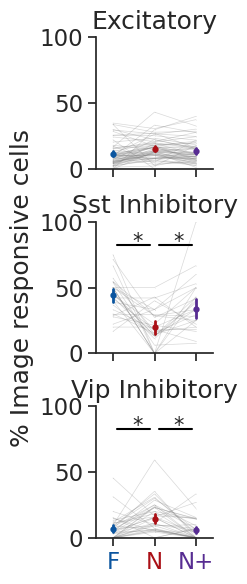

In [95]:
df = each_image_mdf[(each_image_mdf.pref_stim==True) & (each_image_mdf.is_change==False)]

ppf.plot_percent_responsive_cells(df, responsiveness_threshold=0.2, ylim=(0,100), ylabel='% Image responsive cells',
                                    save_dir=save_dir, folder=folder, suffix='_images_pref_stim', horizontal=False, ax=None)


Excitatory includes 62 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Sst Inhibitory includes 30 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Vip Inhibitory includes 42 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='% Image change responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

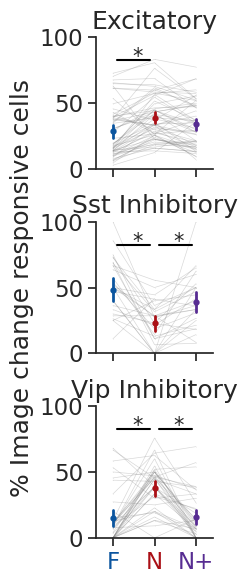

In [96]:
df = each_image_mdf[(each_image_mdf.pref_stim==True) & (each_image_mdf.is_change==True)]

ppf.plot_percent_responsive_cells(df, responsiveness_threshold=0.2, ylim=(0,100), ylabel='% Image change responsive cells',
                                    save_dir=save_dir, folder=folder, suffix='_changes_pref_stim', horizontal=False, ax=None)


Excitatory includes 62 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Sst Inhibitory includes 30 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Vip Inhibitory includes 42 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


saving_stats


array([<Axes: title={'center': 'Excitatory'}, ylabel='% Responsive cells'>,
       <Axes: title={'center': 'Sst Inhibitory'}>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

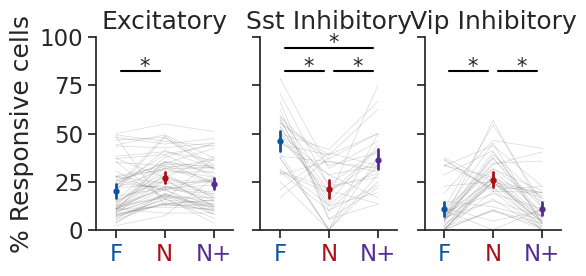

In [97]:
df = each_image_mdf[each_image_mdf.pref_stim==True]

ppf.plot_percent_responsive_cells(df, responsiveness_threshold=0.2, ylim=(0,100), ylabel='% Responsive cells',
                                    save_dir=save_dir, folder=folder, suffix='_images_pref_stim', horizontal=True, ax=None)


#### changes

401
Excitatory includes 62 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Sst Inhibitory includes 30 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Vip Inhibitory includes 42 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='% Image change responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

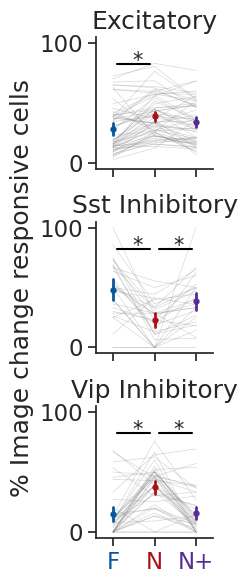

In [98]:
df = each_image_mdf[(each_image_mdf.is_change==True)& (each_image_mdf.pref_stim==True)]
print(len(df.ophys_experiment_id.unique()))

ppf.plot_percent_responsive_cells(df, responsiveness_threshold=0.2, ylim=(-5, 105), ylabel='% Image change responsive cells',
                                    save_dir=save_dir, folder =folder, suffix='_changes_pref_stim', horizontal=False, ax=None)


In [99]:
# ppf.plot_fraction_responsive_cells(change_mdf, responsiveness_threshold=0.1, ylim=(-0.02, 1), ylabel='Proportion image change responsive cells',
#                                     save_dir=save_dir, folder=folder, suffix=change_suffix, horizontal=False, ax=None)


#### omissions

Excitatory includes 62 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Sst Inhibitory includes 30 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Vip Inhibitory includes 42 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='% Image omission responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

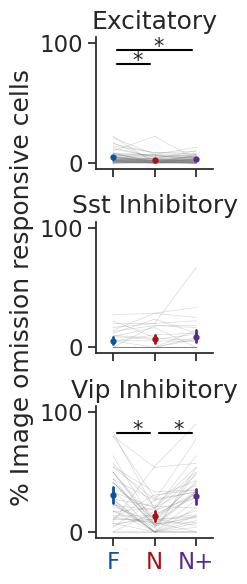

In [100]:
ppf.plot_percent_responsive_cells(omission_mdf, responsiveness_threshold=0.1, ylim=(-5, 105), stats_max=80, ylabel='% Image omission responsive cells',
                                    save_dir=save_dir, folder=folder, suffix='_omissions', horizontal=False, ax=None)


Excitatory includes 62 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Sst Inhibitory includes 30 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Vip Inhibitory includes 42 containers


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:991: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


saving_stats


array([<Axes: title={'center': 'Excitatory'}, ylabel='% Omission responsive cells'>,
       <Axes: title={'center': 'Sst Inhibitory'}>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

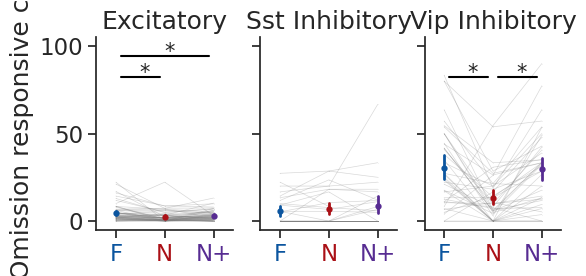

In [101]:
ppf.plot_percent_responsive_cells(omission_mdf, responsiveness_threshold=0.1, ylim=(-5, 105), ylabel='% Omission responsive cells',
                                    save_dir=save_dir, folder=folder, suffix='_omissions', horizontal=True, ax=None)


In [102]:
# ppf.plot_fraction_responsive_cells(omission_mdf, responsiveness_threshold=0.1, ylim=(-0.02, 1), ylabel='Proportion omission responsive cells',
#                                     save_dir=save_dir, folder=folder, suffix=change_suffix, horizontal=False, ax=None)


## Response metrics

#### Fraction responsive cells with metrics tables

In [103]:
# # fraction responsive cells - changes, pref image

# tmp = metrics_table.copy()
# tmp['fraction_significant_p_value_gray_screen'] = tmp.fraction_significant_p_value_gray_screen_pref_image

# ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.1, ylim=(-0.02, 1), 
#                                     ylabel='Fraction responsive cells - preferred image',
#                                     save_dir=save_dir, folder=folder, suffix='_pref_stim_images', horizontal=False, ax=None)


In [104]:
# # fraction responsive cells - changes, all images
# tmp = metrics_table.copy()
# tmp['fraction_significant_p_value_gray_screen'] = tmp.fraction_significant_p_value_gray_screen_changes

# ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.1, ylim=(-0.02, 1), 
#                                     ylabel='Fraction image change responsive cells',
#                                     save_dir=save_dir, folder=folder, suffix='_changes', horizontal=False, ax=None)


In [105]:
# # fraction responsive cells - omissions
# tmp = metrics_table.copy()
# tmp['fraction_significant_p_value_gray_screen'] = tmp.fraction_significant_p_value_gray_screen_omissions

# ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.1, ylim=(-0.02, 1), 
#                                     ylabel='Fraction omission responsive cells',
#                                     save_dir=save_dir, folder=folder, suffix='_omissions', horizontal=False, ax=None)


### Experience modulation

#### changes

In [106]:
### seaborn version 0.12.2

/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2490: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels([cell_type[:3] for cell_type in cell_types])
/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2490: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels([cell_type[:3] for cell_type in cell_types])
/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2490: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels([cell_type[:3] for cell_type in cell_types])


saving_stats


array([<Axes: title={'center': 'Novel vs. Familiar'}>,
       <Axes: title={'center': 'Novel vs. Novel +'}, xlabel='Experience modulation'>,
       <Axes: title={'center': 'Novel + vs. Familiar'}>], dtype=object)

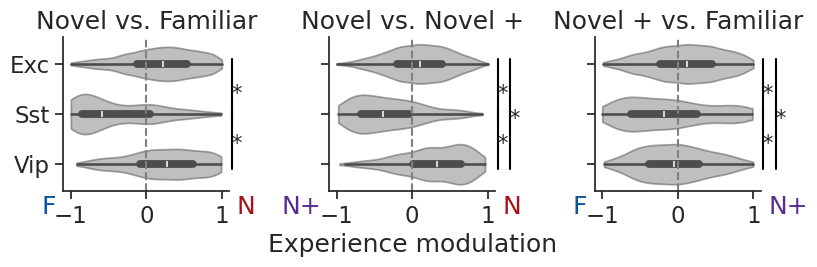

In [ ]:
metric = 'mean_response'
event_type = 'changes'
xlabel = 'Experience modulation'

ppf.plot_experience_modulation_index_annotated(image_mdf, event_type, metric, platform_cells_table, 
                                           xlabel=xlabel, xlims=(-1.1, 1.1), horiz=True,
                                            suptitle=None, suffix='', save_dir=save_dir, ax=None)


saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, xlabel='Experience modulation'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

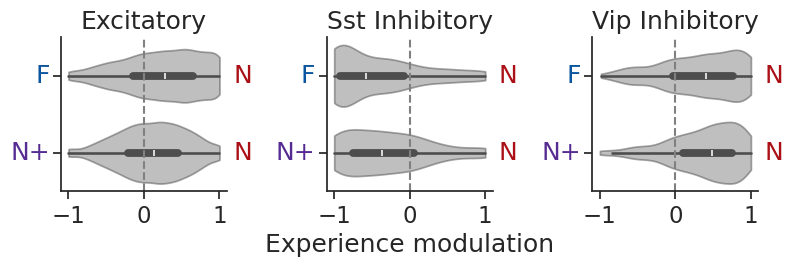

In [108]:
metric = 'mean_response'
event_type = 'changes'
xlabel = 'Experience modulation'

ppf.plot_experience_modulation_index_annotated_by_cell_type(change_mdf, event_type, metric, platform_cells_table, 
                                           xlabel=xlabel, xlims=(-1.1, 1.1), all_comparisons=False, horiz=True,
                                            suptitle=None, suffix='', save_dir=save_dir, ax=None)


saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, xlabel='Experience modulation'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

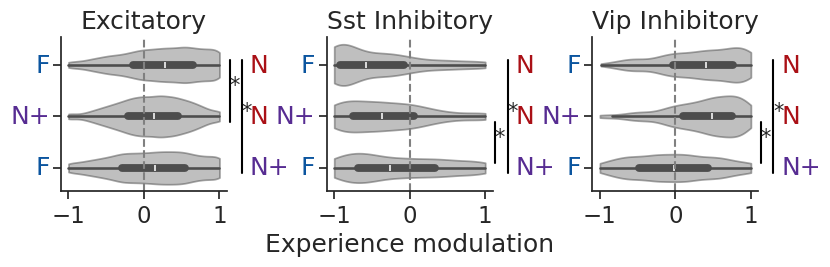

In [109]:
metric = 'mean_response'
event_type = 'changes'
xlabel = 'Experience modulation'


ppf.plot_experience_modulation_index_annotated_by_cell_type(change_mdf, event_type, metric, platform_cells_table, 
                                           xlabel=xlabel, xlims=(-1.1, 1.1), horiz=True,
                                            suptitle=None, suffix='', save_dir=save_dir, ax=None)


#### images

/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2490: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels([cell_type[:3] for cell_type in cell_types])
/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2490: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels([cell_type[:3] for cell_type in cell_types])
/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2490: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels([cell_type[:3] for cell_type in cell_types])


saving_stats


array([<Axes: title={'center': 'Novel vs. Familiar'}>,
       <Axes: title={'center': 'Novel vs. Novel +'}, xlabel='Experience modulation'>,
       <Axes: title={'center': 'Novel + vs. Familiar'}>], dtype=object)

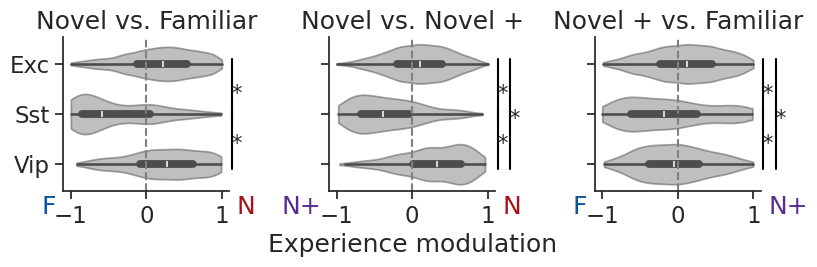

In [110]:
metric = 'mean_response'
event_type = 'images'
xlabel = 'Experience modulation'


ppf.plot_experience_modulation_index_annotated(image_mdf, event_type, metric, platform_cells_table, 
                                           xlabel=xlabel, xlims=(-1.1, 1.1), horiz=True,
                                            suptitle=None, suffix='', save_dir=save_dir, ax=None)


saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, xlabel='Experience modulation'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

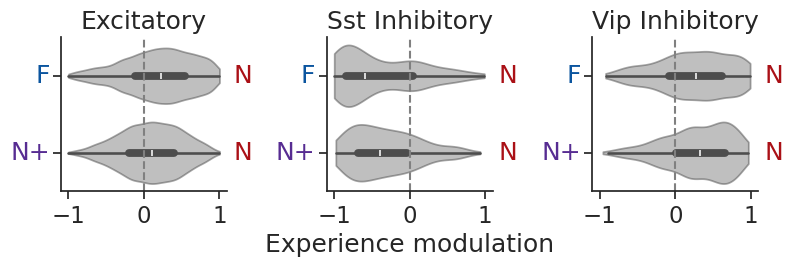

In [111]:
metric = 'mean_response'
event_type = 'images'
xlabel = 'Experience modulation'

ppf.plot_experience_modulation_index_annotated_by_cell_type(image_mdf, event_type, metric, platform_cells_table, 
                                           xlabel=xlabel, xlims=(-1.1, 1.1), all_comparisons=False, horiz=True,
                                            suptitle=None, suffix='', save_dir=save_dir, ax=None)


saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, xlabel='Experience modulation'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

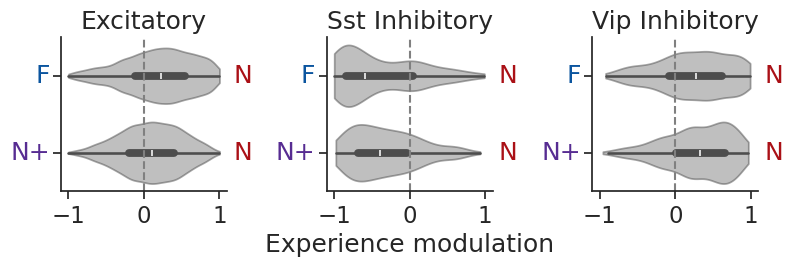

In [112]:
metric = 'mean_response'
event_type = 'images'
xlabel = 'Experience modulation'

ppf.plot_experience_modulation_index_annotated_by_cell_type(image_mdf, event_type, metric, platform_cells_table, 
                                           xlabel=xlabel, xlims=(-1.1, 1.1), all_comparisons=False, horiz=True,
                                            suptitle=None, suffix='', save_dir=save_dir, ax=None)


saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, xlabel='Experience modulation'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

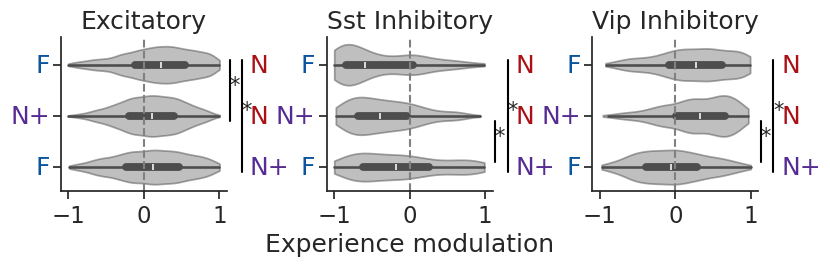

In [113]:
metric = 'mean_response'
event_type = 'images'
xlabel = 'Experience modulation'


ppf.plot_experience_modulation_index_annotated_by_cell_type(image_mdf, event_type, metric, platform_cells_table, 
                                           xlabel=xlabel, xlims=(-1.1, 1.1), horiz=True,
                                            suptitle=None, suffix='', save_dir=save_dir, ax=None)


#### omissions

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, xlabel='Experience modulation'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

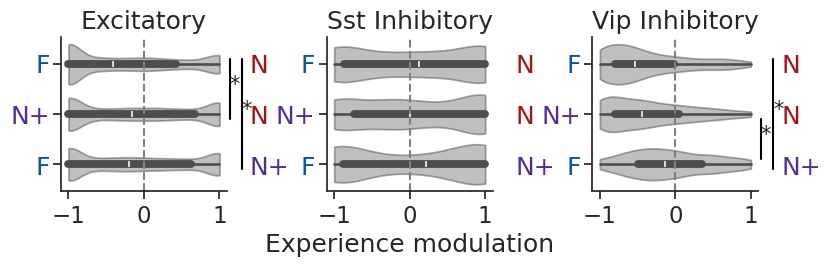

In [114]:
metric = 'mean_response'
event_type = 'omissions'
xlabel = 'Experience modulation'

ppf.plot_experience_modulation_index_annotated_by_cell_type(omission_mdf, event_type, metric, platform_cells_table, 
                                           xlabel=xlabel, xlims=(-1.1, 1.1), all_comparisons=True, horiz=True,
                                            suptitle=None, suffix='', save_dir=save_dir, ax=None)


saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, xlabel='Experience modulation'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

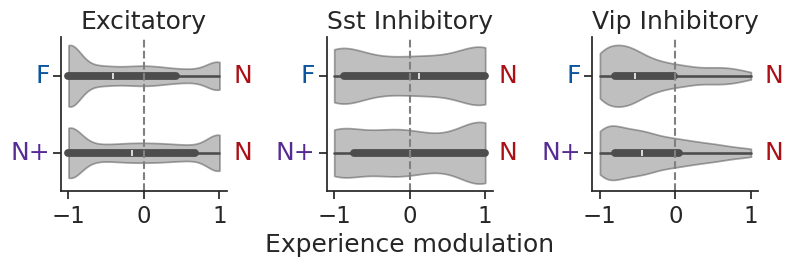

In [115]:
metric = 'mean_response'
event_type = 'omissions'
xlabel = 'Experience modulation'

ppf.plot_experience_modulation_index_annotated_by_cell_type(omission_mdf, event_type, metric, platform_cells_table, 
                                           xlabel=xlabel, xlims=(-1.1, 1.1), all_comparisons=False, horiz=True,
                                            suptitle=None, suffix='', save_dir=save_dir, ax=None)


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2490: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels([cell_type[:3] for cell_type in cell_types])
/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2490: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels([cell_type[:3] for cell_type in cell_types])
/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2490: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_yticklabels([cell_type[:3] for cell_type in cell_types])


saving_stats


array([<Axes: title={'center': 'Novel vs. Familiar'}>,
       <Axes: title={'center': 'Novel vs. Novel +'}, xlabel='Experience modulation'>,
       <Axes: title={'center': 'Novel + vs. Familiar'}>], dtype=object)

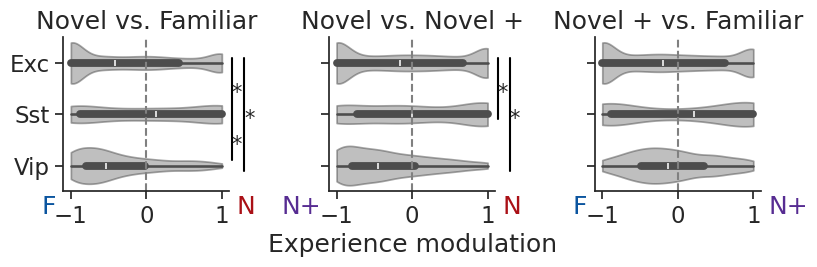

In [116]:
metric = 'mean_response'
event_type = 'omissions'
xlabel = 'Experience modulation'

ppf.plot_experience_modulation_index_annotated(omission_mdf, event_type, metric, platform_cells_table, 
                                           xlabel=xlabel, xlims=(-1.1, 1.1), horiz=True,
                                            suptitle=None, suffix='', save_dir=save_dir, ax=None)


### Mean change response 

#### everything together

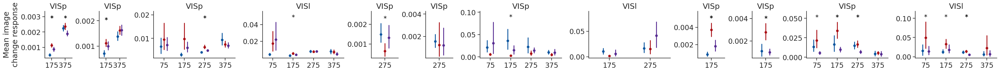

In [117]:
metric = 'mean_response_changes'
ylabel = 'Mean image\nchange response'

mdf = metrics_table.copy()
project_codes = mdf.project_code.unique()

i = 0 
fig, ax = plt.subplots(1, 12, figsize=(40,2), gridspec_kw={'width_ratios':[1, 1, 3, 3, 1, 1, 3, 3, 1, 1, 3, 3,]})

for c, cell_type in enumerate(cell_types): 
    ct_data = mdf[mdf.cell_type==cell_type]
    for p, project_code in enumerate(project_codes): 
        areas = ct_data[ct_data.project_code==project_code].targeted_structure.unique()
        for a, area in enumerate(areas): 
            data = ct_data[(ct_data.project_code==project_code) & 
                           (ct_data.targeted_structure==area)]
            imaging_depths = np.sort(data.binned_depth.unique())
            ax[i] = sns.pointplot(data=data, x='binned_depth', y=metric, hue='experience_level', order=imaging_depths,
                                            hue_order=experience_levels, palette=palette, dodge=0.3, linestyle='none',
                                            markers='.', markersize=8, err_kws={'linewidth': 2}, errorbar=('ci', 95), ax=ax[i])
            ax[i].set_ylabel('')
            ax[i].set_xlabel('')
            ax[i].get_legend().remove()
            ax[i].set_title(area)
            # ax[i], tukey_table = ppf.add_stats_to_plot(data, metric, ax[i])
            ax[i], tukey_table = ppf.add_stats_to_plot_for_hues(data, metric, ax[i],
                                                            xorder=imaging_depths, x='binned_depth', hue='experience_level')
            # , ymax=None, show_ns=False)
            i+=1
ax[0].set_ylabel(ylabel)
plt.subplots_adjust(wspace=0.5, hspace=0.5)


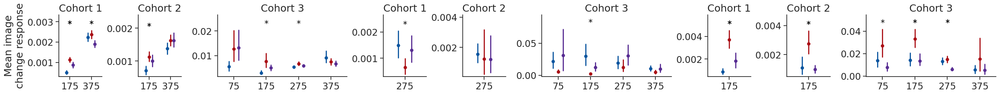

In [118]:
metric = 'mean_response_changes'
ylabel = 'Mean image\nchange response'

mdf = metrics_table.copy()
project_codes = mdf.project_code.unique()

i = 0 
fig, ax = plt.subplots(1, 9, figsize=(30, 2), gridspec_kw={'width_ratios':[1, 1, 3,  1, 1, 3,  1, 1, 3, ]})

for c, cell_type in enumerate(cell_types): 
    ct_data = mdf[mdf.cell_type==cell_type]
    for p, project_code in enumerate(project_codes): 
        data = ct_data[(ct_data.project_code==project_code)]
        imaging_depths = np.sort(data.binned_depth.unique())
        ax[i] = sns.pointplot(data=data, x='binned_depth', y=metric, hue='experience_level', order=imaging_depths,
                                        hue_order=experience_levels, palette=palette, dodge=0.3, linestyle='none',
                                        markers='.', markersize=8, err_kws={'linewidth': 2}, errorbar=('ci', 95), ax=ax[i])
        ax[i].set_ylabel('')
        ax[i].set_xlabel('')
        ax[i].get_legend().remove()
        ax[i].set_title('Cohort '+str(p+1))
        # ax[i], tukey_table = ppf.add_stats_to_plot(data, metric, ax[i])
        ax[i], tukey_table = ppf.add_stats_to_plot_for_hues(data, metric, ax[i],
                                                        xorder=imaging_depths, x='binned_depth', hue='experience_level')
        # , ymax=None, show_ns=False)
        i+=1
ax[0].set_ylabel(ylabel)
plt.subplots_adjust(wspace=0.5, hspace=0.5)


In [119]:
def plot_metric_across_cohorts(metrics_table, metric,  ylabel, x_val='binned_depth', plot_type='barplot', 
                               save_dir=None, folder=None, ax=None):
    '''
    Plot metric distributions across cre lines, with a unique axis for each cohort / project code, 
    experience levels as colors, and x-axis defined by x_val (such as 'binned_depth' or 'targeted_structure').
    Will plot stats across exp levels as an asterisk above that x value
    '''

    mdf = metrics_table.copy()
    project_codes = mdf.project_code.unique()

    # get width ratios based on how many x values there are for each condition
    width_ratios = []
    for c, cell_type in enumerate(cell_types): 
        ct_data = mdf[mdf.cell_type==cell_type]
        for p, project_code in enumerate(project_codes): 
            data = ct_data[(ct_data.project_code==project_code)]
            x_vals = np.sort(data[x_val].unique())
            width_ratios.append(len(x_vals))
    if np.sum(width_ratios) > 15: 
        fig_width = np.sum(width_ratios)*1.5
    else: 
        fig_width = np.sum(width_ratios)*2

    i = 0 
    if ax is None:
        figsize=(fig_width, 2)
        fig, ax = plt.subplots(1, 9, figsize=figsize, gridspec_kw={'width_ratios':width_ratios})

    for c, cell_type in enumerate(cell_types): 
        ct_data = mdf[mdf.cell_type==cell_type]
        for p, project_code in enumerate(project_codes): 
            data = ct_data[(ct_data.project_code==project_code)]
            x_vals = np.sort(data[x_val].unique())
            if plot_type == 'pointplot': 
                ax[i] = sns.pointplot(data=data, x=x_val, y=metric, hue='experience_level', order=x_vals,
                                            hue_order=experience_levels, palette=palette, dodge=0.3, linestyle='none',
                                            markers='.', markersize=8, err_kws={'linewidth': 2}, errorbar=('ci', 95), ax=ax[i])
            elif plot_type == 'barplot': 
                ax[i] = sns.barplot(data=data, x=x_val, y=metric, hue='experience_level', order=x_vals, width=0.5, alpha=0.75, 
                                                hue_order=experience_levels, palette=palette, err_kws={'linewidth': 2}, errorbar=('ci', 95), ax=ax[i])
            elif plot_type == 'boxplot': 
                ax[i] = sns.boxplot(data=data, x=x_val, y=metric, hue='experience_level', order=x_vals, 
                                                hue_order=experience_levels, palette=palette, 
                                                width=0.5, fliersize=0, ax=ax[i])
                plt.setp(ax[i].collections, alpha=0.75)
            ax[i].set_ylabel('')
            ax[i].set_xlabel('')
            ax[i].get_legend().remove()
            ax[i].set_title('Cohort '+str(p+1))
            # ax[i], tukey_table = ppf.add_stats_to_plot(data, metric, ax[i])
            ax[i], tukey_table = ppf.add_stats_to_plot_for_hues(data, metric, ax[i],
                                                            xorder=x_vals, x=x_val, hue='experience_level')
            # , ymax=None, show_ns=False)
            i+=1
    ax[0].set_ylabel(ylabel)
    plt.subplots_adjust(wspace=0.5, hspace=0.5)

    if save_dir: 
        filename = metric+'_by_cohort_x_'+x_val
        utils.save_figure(fig, figsize, save_dir, folder, filename)
    return ax


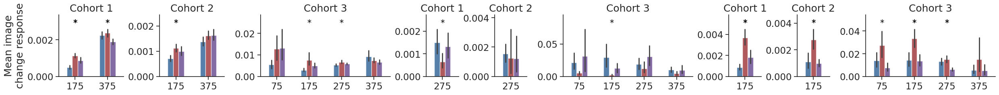

In [120]:
metric = 'mean_response_changes'
ylabel = 'Mean image\nchange response'
x_val = 'binned_depth'

plot_metric_across_cohorts(metrics_table, metric,  ylabel, x_val=x_val, plot_type='barplot', 
                               save_dir=save_dir, folder='response_metrics', ax=None);

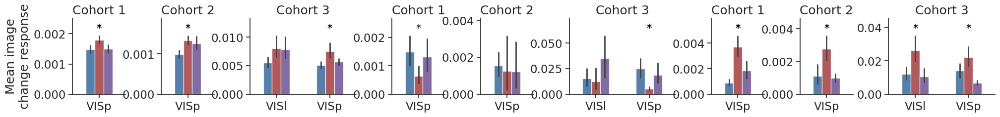

In [121]:
metric = 'mean_response_changes'
ylabel = 'Mean image\nchange response'
x_val = 'targeted_structure'

plot_metric_across_cohorts(metrics_table, metric,  ylabel, x_val=x_val, plot_type='barplot', 
                               save_dir=save_dir, folder='response_metrics', ax=None);

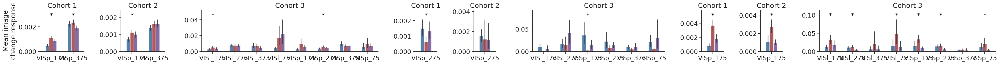

In [122]:
metric = 'mean_response_changes'
ylabel = 'Mean image\nchange response'
x_val = 'area_binned_depth'

plot_metric_across_cohorts(metrics_table, metric,  ylabel, x_val=x_val, plot_type='barplot', 
                               save_dir=save_dir, folder='response_metrics', ax=None);

In [123]:
def plot_metric_across_areas_for_cohort_3(metrics_table, metric, ylabel, plot_type='barplot', 
                               save_dir=None, folder=None, ax=None):
    '''
    Plot metric distributions across cre lines, with a unique axis for each cohort / project code, 
    experience levels as colors, and x-axis defined by x_val (such as 'binned_depth' or 'targeted_structure').
    Will plot stats across exp levels as an asterisk above that x value
    '''

    mdf = metrics_table.copy()

    limit_to_cohort_3 = False
    project_code = 'VisualBehaviorMultiscope'
    x_val='targeted_structure'

    # get width ratios based on how many x values there are for each condition
    width_ratios = []
    for c, cell_type in enumerate(cell_types): 
        ct_data = mdf[mdf.cell_type==cell_type]
        data = ct_data[(ct_data.project_code==project_code)]
        x_vals = np.sort(data[x_val].unique())
        width_ratios.append(len(x_vals))
    fig_width = np.sum(width_ratios)*1.5

    i = 0 
    if ax is None:
        figsize=(fig_width, 2)
        fig, ax = plt.subplots(1, 3, figsize=figsize, gridspec_kw={'width_ratios':width_ratios})

    for c, cell_type in enumerate(cell_types): 
        ct_data = mdf[mdf.cell_type==cell_type]
        # for p, project_code in enumerate(project_codes): 
        # data = ct_data[(ct_data.project_code==project_code)]
        data = ct_data[(ct_data.project_code==project_code)]
        x_vals = np.sort(data[x_val].unique())
        if plot_type == 'pointplot': 
            ax[i] = sns.pointplot(data=data, x=x_val, y=metric, hue='experience_level', order=x_vals,
                                        hue_order=experience_levels, palette=palette, dodge=0.3, linestyle='none',
                                        markers='.', markersize=8, err_kws={'linewidth': 2}, errorbar=('ci', 95), ax=ax[i])
        elif plot_type == 'barplot': 
            ax[i] = sns.barplot(data=data, x=x_val, y=metric, hue='experience_level', order=x_vals, width=0.5, alpha=0.75, 
                                            hue_order=experience_levels, palette=palette, err_kws={'linewidth': 2}, errorbar=('ci', 95), ax=ax[i])
        elif plot_type == 'boxplot': 
            ax[i] = sns.boxplot(data=data, x=x_val, y=metric, hue='experience_level', order=x_vals, 
                                            hue_order=experience_levels, palette=palette, 
                                            width=0.5, fliersize=0, ax=ax[i])
            plt.setp(ax[i].collections, alpha=0.75)
        ax[i].set_ylabel('')
        ax[i].set_xlabel('')
        ax[i].get_legend().remove()
        ax[i].set_title(cell_type+'\n'+'Cohort '+str(p+1))
        # ax[i], tukey_table = ppf.add_stats_to_plot(data, metric, ax[i])
        ax[i], tukey_table = ppf.add_stats_to_plot_for_hues(data, metric, ax[i],
                                                        xorder=x_vals, x=x_val, hue='experience_level')
        # , ymax=None, show_ns=False)
        i+=1
    ax[0].set_ylabel(ylabel)
    plt.subplots_adjust(wspace=0.4, hspace=0.5)

    if save_dir: 
        filename = metric+'_by_area_cohort_3'
        utils.save_figure(fig, figsize, save_dir, folder, filename)
    return ax


array([<Axes: title={'center': 'Excitatory\nCohort 3'}, ylabel='Mean image\nchange response'>,
       <Axes: title={'center': 'Sst Inhibitory\nCohort 3'}>,
       <Axes: title={'center': 'Vip Inhibitory\nCohort 3'}>], dtype=object)

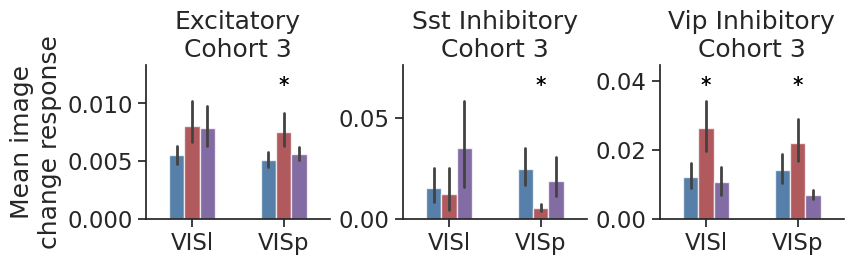

In [124]:
plot_metric_across_areas_for_cohort_3(metrics_table, metric,  ylabel,plot_type='barplot', 
                               save_dir=None, folder=None, ax=None)

In [125]:
# def plot_metric_across_cohorts_area_depth(metrics_table, metric,  ylabel,plot_type='barplot', 
#                                save_dir=None, folder=None, ax=None):
#     '''
#     Plot metric distributions across cre lines, with a unique axis for each cohort / project code, experience levels as colors. 
#     Will first plot values with binned_depth on the x-axis for the first 2 cohorts, then for cohort 3, will plot data split by 'binned_depth' and 'targeted_structure'
#     Will plot stats across exp levels as an asterisk above that x value
#     '''

#     mdf = metrics_table.copy()
#     project_codes = mdf.project_code.unique()

#     # get width ratios based on how many x values there are for each condition
#     width_ratios = []
#     for c, cell_type in enumerate(cell_types): 
#         ct_data = mdf[mdf.cell_type==cell_type]
#         for p, project_code in enumerate(project_codes): 
#             data = ct_data[(ct_data.project_code==project_code)]
#             if project_code == 'VisualBehaviorMultiscope':
#                 x_values = ['binned_depth', 'targeted_structure']
#             else: 
#                 x_values = ['binned_depth']
#             for x_val in x_values: 
#                 x_vals = np.sort(data[x_val].unique())
#                 width_ratios.append(len(x_vals))
#     if np.sum(width_ratios) > 15: 
#         fig_width = np.sum(width_ratios)*1.5
#     else: 
#         fig_width = np.sum(width_ratios)*2

#     i = 0 
#     if ax is None:
#         figsize=(fig_width, 2)
#         fig, ax = plt.subplots(1, 12, figsize=figsize, gridspec_kw={'width_ratios':width_ratios})

#     for c, cell_type in enumerate(cell_types): 
#         ct_data = mdf[mdf.cell_type==cell_type]
#         for p, project_code in enumerate(project_codes): 
#             data = ct_data[(ct_data.project_code==project_code)]
#             if project_code == 'VisualBehaviorMultiscope':
#                 x_values = ['binned_depth', 'targeted_structure']
#             else: 
#                 x_values = ['binned_depth']
#             for x_val in x_values: 
#                 x_vals = np.sort(data[x_val].unique())
#                 if plot_type == 'pointplot': 
#                     ax[i] = sns.pointplot(data=data, x=x_val, y=metric, hue='experience_level', order=x_vals,
#                                                 hue_order=experience_levels, palette=palette, dodge=0.3, linestyle='none',
#                                                 markers='.', markersize=8, err_kws={'linewidth': 2}, errorbar=('ci', 95), ax=ax[i])
#                 elif plot_type == 'barplot': 
#                     ax[i] = sns.barplot(data=data, x=x_val, y=metric, hue='experience_level', order=x_vals, width=0.5, alpha=0.75, 
#                                                     hue_order=experience_levels, palette=palette, err_kws={'linewidth': 2}, errorbar=('ci', 95), ax=ax[i])
#                 elif plot_type == 'boxplot': 
#                     ax[i] = sns.boxplot(data=data, x=x_val, y=metric, hue='experience_level', order=x_vals, 
#                                                     hue_order=experience_levels, palette=palette, 
#                                                     width=0.5, fliersize=0, ax=ax[i])
#                     plt.setp(ax[i].collections, alpha=0.75)
#                 ax[i].set_ylabel('')
#                 ax[i].set_xlabel('')
#                 ax[i].get_legend().remove()
#                 ax[i].set_title('Cohort '+str(p+1))
#                 # ax[i], tukey_table = ppf.add_stats_to_plot(data, metric, ax[i])
#                 ax[i], tukey_table = ppf.add_stats_to_plot_for_hues(data, metric, ax[i],
#                                                                 xorder=x_vals, x=x_val, hue='experience_level')
#                 # , ymax=None, show_ns=False)
#                 i+=1
#     ax[0].set_ylabel(ylabel)
#     plt.subplots_adjust(wspace=0.5, hspace=0.5)

#     if save_dir: 
#         filename = metric+'_by_cohort_depth_area'
#         utils.save_figure(fig, figsize, save_dir, folder, filename)
#     return ax


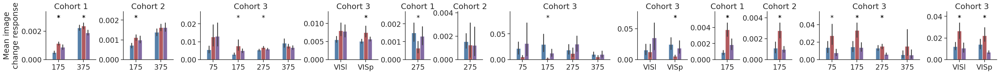

In [126]:
metric = 'mean_response_changes'
ylabel = 'Mean image\nchange response'

ppf.plot_metric_across_cohorts_area_depth(metrics_table, metric,  ylabel,plot_type='barplot', 
                               save_dir=save_dir, folder='response_metrics', ax=None);

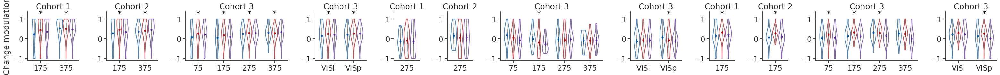

In [127]:
metric = 'change_modulation_index'
ylabel = 'Change modulation'

ppf.plot_metric_across_cohorts_area_depth(metrics_table, metric,  ylabel,plot_type='violinplot', 
                               save_dir=save_dir, folder='response_metrics', ax=None);

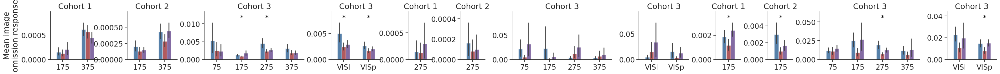

In [128]:
metric = 'mean_response_omissions'
ylabel = 'Mean image\nomission response'

ppf.plot_metric_across_cohorts_area_depth(metrics_table, metric,  ylabel,plot_type='barplot', 
                               save_dir=save_dir, folder='response_metrics', ax=None);

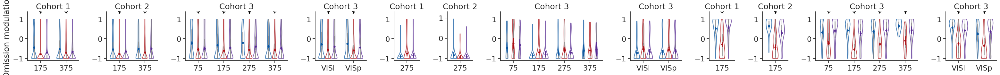

In [129]:
metric = 'omission_modulation_index'
ylabel = 'Omission modulation'

ppf.plot_metric_across_cohorts_area_depth(metrics_table, metric,  ylabel,plot_type='violinplot', 
                               save_dir=save_dir, folder='response_metrics', ax=None);

In [130]:
def plot_experience_modulation_index_annotated_by_cell_type(metrics_table, event_type, metric, cells_table,
                                                            xlims=(-1.1, 1.1), xlabel='Experience modulation',
                                                            all_comparisons=True, horiz=False,
                                                            suptitle=None, suffix='', save_dir=None, ax=None):
    """
    plots experience modulation for some event_type, which is the mean repsonse in familiar vs. novel 1 over the sum,
    and the mean response in novel 1 vs. novel >1 over the sum, giving a value between -1 and 1
    metric_data is the output of visual_behavior.ophys.response_analysis.cell_metrics.compute_experience_modulation_index()

    :param metric_data:
    :param event_type:
    :param save_dir:
    :return:
    """

    import visual_behavior.ophys.response_analysis.cell_metrics as cm

    exp_mod = cm.compute_experience_modulation_index_new(metrics_table, metric, cells_table)
    exp_mod = exp_mod.drop_duplicates(subset='cell_specimen_id')

    if all_comparisons:
        value_vars = ['F N', 'N+ N', 'F N+'][::-1]
        titles = ['Novel vs. Familiar', 'Novel vs. Novel +', 'Novel + vs. Familiar']
    else:
        value_vars = ['F N', 'N+ N', ][::-1]
        titles = ['Novel vs. Familiar', 'Novel vs. Novel +', ]
    data = exp_mod.melt(id_vars=['cell_specimen_id', 'cell_type'], var_name='comparison', value_vars=value_vars)

    metric = 'value'
    x = 'comparison'

    cell_types = np.sort(data.cell_type.unique())
    colors = utils.get_experience_level_colors()

    wspace = 0.5
    if ax is None:
        if horiz:
            if 'all_comparisons':
                figsize = (9, 2)
                wspace = 0.6
            else:
                figsize = (9, 2)
            fig, ax = plt.subplots(1, 3, figsize=figsize, sharex=False, sharey=True)
        else:
            figsize = (2, 6)
            fig, ax = plt.subplots(3, 1, figsize=figsize, sharex=True, sharey=False)

    tukey = pd.DataFrame()
    for i, cell_type in enumerate(cell_types):
        ax[i] = sns.violinplot(data=data[data.cell_type == cell_type],
                               x='value', y='comparison', order=value_vars,
                               color='gray', cut=0, ax=ax[i]) #inner_kws={'marker':'.', 'markersize':5}, ax=ax[i])
        for violin in ax[i].collections:
            violin.set_alpha(0.5)
        ax[i].set_xlim(xlims)

        ax[i].axvline(x=0, ymin=0, ymax=1, color='gray', linestyle='--')
        ax[i].set_title(cell_type)
        ax[i].set_xlabel('')
        ax[i].set_ylabel('')
        ax[i].set_yticklabels('')

        for x, comparison in enumerate(value_vars):
            annot = comparison.split(' ')

            def get_color(c):
                exp = annot[c]
                if exp == 'F':
                    color = colors[0]
                elif exp == 'N':
                    color = colors[1]
                elif exp == 'N+':
                    color = colors[2]
                return color

            if all_comparisons:
                xy_0 = (-1.25, x / 3 + 0.15)
                xy_1 = (1.4, x / 3 + 0.15)
            else:
                xy_0 = (-1.25, x / 2 + 0.25)
                xy_1 = (1.18, x / 2 + 0.25)
            c = 0
            ax[i].annotate(annot[c], xy=xy_0, xycoords=ax[i].get_xaxis_transform(), ha="right", va="center",
                           color=get_color(c))
            c = 1
            ax[i].annotate(annot[c], xy=xy_1, xycoords=ax[i].get_xaxis_transform(), ha="left", va="center",
                           color=get_color(c))
            # ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')

        if len(value_vars) > 2:
            # add stats to plot
            ax[i], tukey_table = add_stats_to_plot_xaxis(data[data.cell_type == cell_type], 'value', ax[i],
                                                             xmax=xlims[1],
                                                             column_to_compare='comparison')
            tukey_table['metric'] = metric
            tukey_table['cell_type'] = cell_type
            tukey = pd.concat([tukey, tukey_table])

        ax[i].invert_yaxis()

    if horiz:
        ax[1].set_xlabel(xlabel)
    else:
        # ax[2].annotate(annot[0], xy=(-1.2, -0.05), xycoords=ax[2].get_xaxis_transform(), ha="right", va="center", fontsize=10)
        # ax[2].annotate(annot[1], xy=(1.2, -0.05), xycoords=ax[2].get_xaxis_transform(), ha="left", va="center", fontsize=10)
        ax[2].set_xlabel(xlabel)

    if suptitle:
        plt.suptitle(suptitle, x=0.52, y=0.98, fontsize=16)

    fig.subplots_adjust(hspace=0.5, wspace=wspace)

    if save_dir:
        if horiz:
            suffix = suffix + '_horiz'
        folder = 'metric_distributions'
        filename = 'experience_modulation_annot_by_cell_type_' + event_type + '_' + suffix
        stats_filename = 'experience_modulation_by_cell_type_' + event_type + '_' + suffix
        utils.save_figure(fig, figsize, save_dir, folder, filename)
        try:
            print('saving_stats')
            # save tukey
            tukey.to_csv(os.path.join(save_dir, folder, stats_filename + '_tukey.csv'))
            # save descriptive stats
            cols_to_groupby = ['cell_type']
            stats = get_descriptive_stats_for_metric(data, metric, cols_to_groupby)
            stats.to_csv(os.path.join(save_dir, folder, stats_filename + '_values.csv'))
        except BaseException:
            print('STATS DID NOT SAVE FOR', metric)
    return ax

#### original plots

saving_stats


array([<Axes: title={'center': 'Excitatory\n(n = 12826 cells)'}>,
       <Axes: title={'center': 'Sst Inhibitory\n(n = 468 cells)'}, ylabel='Mean image\nchange response'>,
       <Axes: title={'center': 'Vip Inhibitory\n(n = 1201 cells)'}>],
      dtype=object)

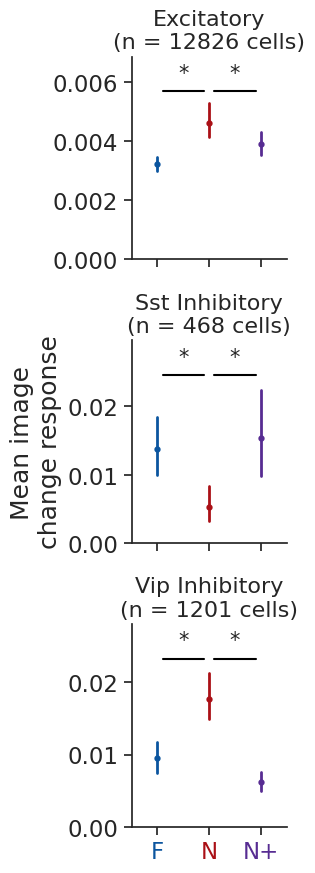

In [131]:
metric = 'mean_response_changes'
ylabel = 'Mean image\nchange response'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', #show_containers=True,
                                           add_zero_line=False, event_type=event_type, data_type=data_type, horiz=False,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


#### area & depth

saving_stats


array([<Axes: title={'center': 'Excitatory\n(n = 12826 cells)'}, ylabel='Mean image\nchange response'>,
       <Axes: title={'center': 'Sst Inhibitory\n(n = 468 cells)'}>,
       <Axes: title={'center': 'Vip Inhibitory\n(n = 1201 cells)'}>],
      dtype=object)

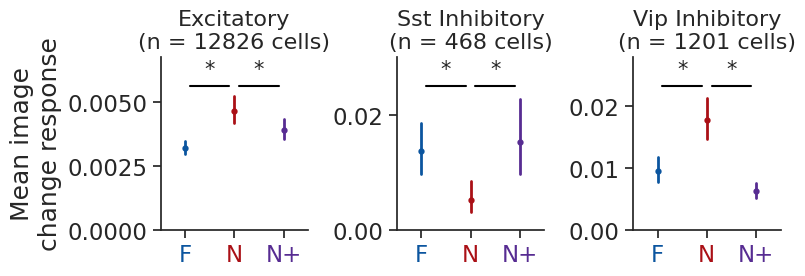

In [132]:
metric = 'mean_response_changes'
ylabel = 'Mean image\nchange response'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

# for imaging_depth in 
ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', #show_containers=True,
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


array([<Axes: title={'center': 'Excitatory\n(n = 12826 cells)'}, ylabel='Mean image change response'>,
       <Axes: title={'center': 'Sst Inhibitory\n(n = 467 cells)'}>,
       <Axes: title={'center': 'Vip Inhibitory\n(n = 1196 cells)'}>],
      dtype=object)

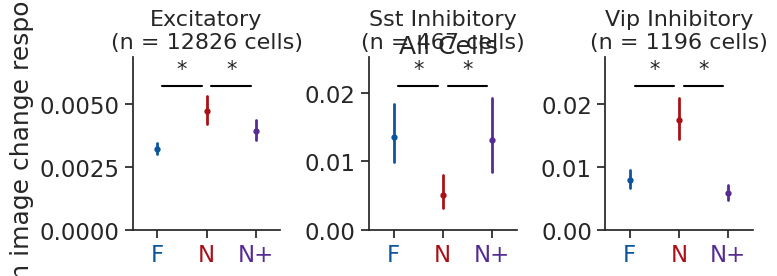

In [133]:
metric = 'mean_response'
ylabel = 'Mean image change response'
event_type = 'changes'

ylims = None #(-0.001, 0.025)

# for imaging_depth in 
ppf.plot_metric_distribution_by_experience(change_mdf, metric, plot_type='pointplot', horiz=True, suptitle='All Cells',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=None, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


saving_stats


array([<Axes: title={'center': 'Excitatory\n(n = 12826 cells)'}>,
       <Axes: title={'center': 'Sst Inhibitory\n(n = 468 cells)'}, ylabel='Mean image change response'>,
       <Axes: title={'center': 'Vip Inhibitory\n(n = 1201 cells)'}>],
      dtype=object)

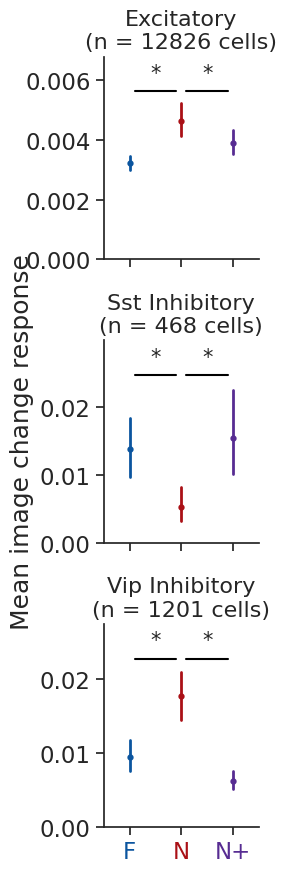

In [134]:
metric = 'mean_response_changes'
ylabel = 'Mean image change response'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

# df = metrics_table.copy()
# csids = [1086560073, 1086562892, 1086577313, 1086560671]
# csids = [1086573689, 1086573585, 1086577313, 1086577516, 1086560073, 1086560671, 1086562892, 1086563531,  1086568099, ]
# df = df[df.cell_specimen_id.isin(csids)==False]
# oeids = [920288845, 920288849]
# df = df[df.ophys_experiment_id.isin(oeids)==False]
# osid = 919888953
# df = df[df.ophys_session_id!=osid]
# for imaging_depth in 
ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', #show_containers=True,
                                           horiz=False, add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


saving_stats


array([<Axes: title={'center': 'Excitatory\n(n = 12826 cells)'}>,
       <Axes: title={'center': 'Sst Inhibitory\n(n = 468 cells)'}, ylabel='Mean image change response'>,
       <Axes: title={'center': 'Vip Inhibitory\n(n = 1201 cells)'}>],
      dtype=object)

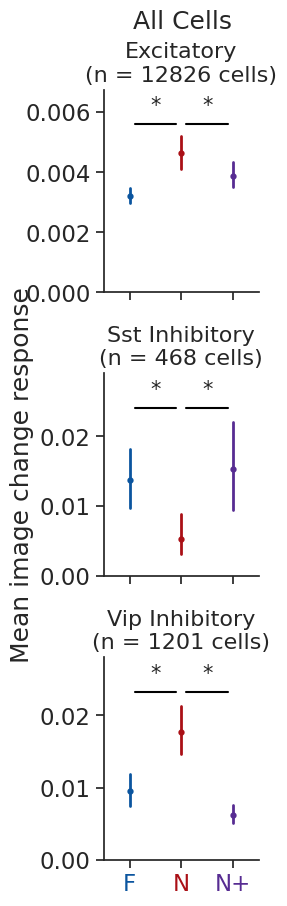

In [135]:
metric = 'mean_response_changes'
ylabel = 'Mean image change response'
event_type = 'changes'

ylims = None #(-0.001, 0.025)

# for imaging_depth in 
ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', horiz=False, suptitle='All Cells',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


saving_stats
saving_stats


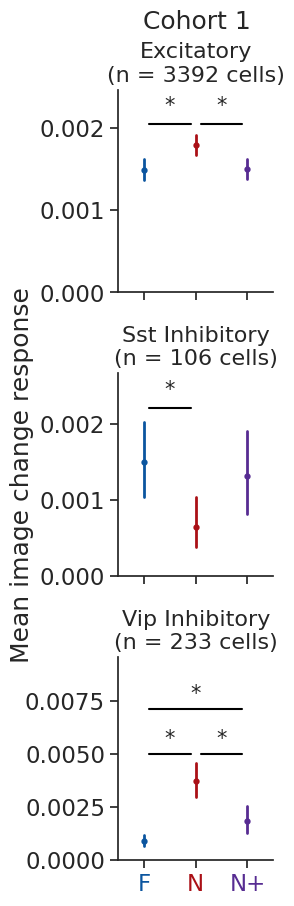

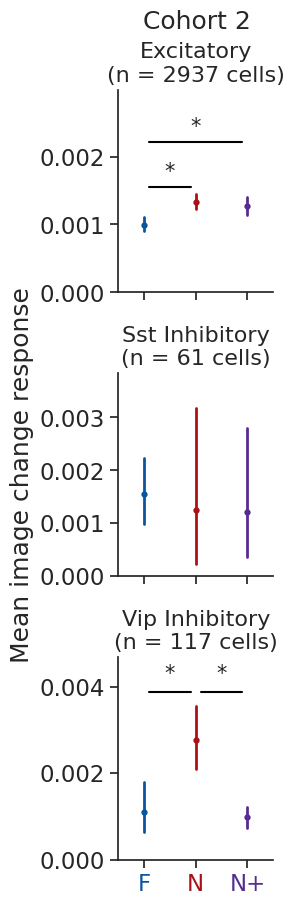

In [136]:
# split by project code 

metric = 'mean_response_changes'
ylabel = 'Mean image change response'
event_type = 'changes'

ylims = None #(-0.001, 0.025)

project_codes = ['VisualBehavior', 'VisualBehaviorTask1B']

for i, project_code in enumerate(project_codes):
    proj_data = metrics_table[metrics_table.project_code==project_code]
    suffix = '_'+project_code
    suptitle = 'Cohort '+str(i+1)
    ppf.plot_metric_distribution_by_experience(proj_data, metric, plot_type='pointplot', horiz=False, suffix=suffix, suptitle=suptitle,
                                            add_zero_line=False, event_type=event_type, data_type=data_type,
                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


In [137]:
cell_types = utils.get_cell_types()

/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:1603: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax = sns.pointplot(data=data, x=x, y=y, hue='experience_level', order=order,
/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:1674: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)
/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:1603: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax = sns.pointplot(data=data, x=x, y=y, hue='experience_level', order=order,
/root/capsule/visual_be

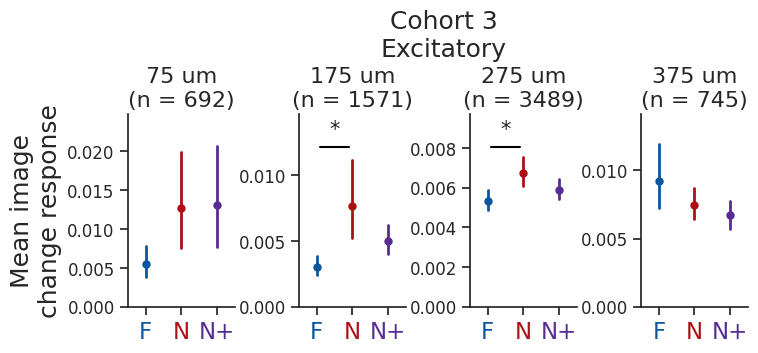

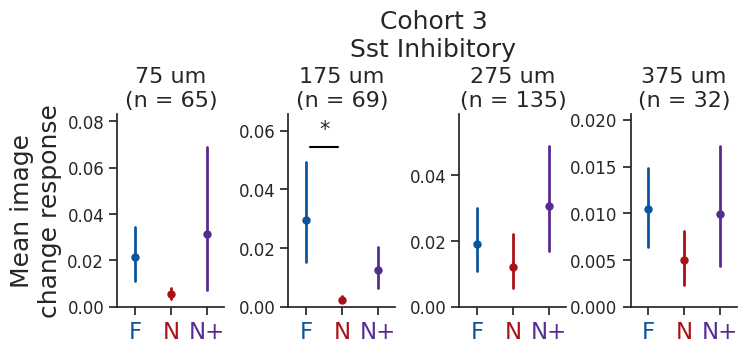

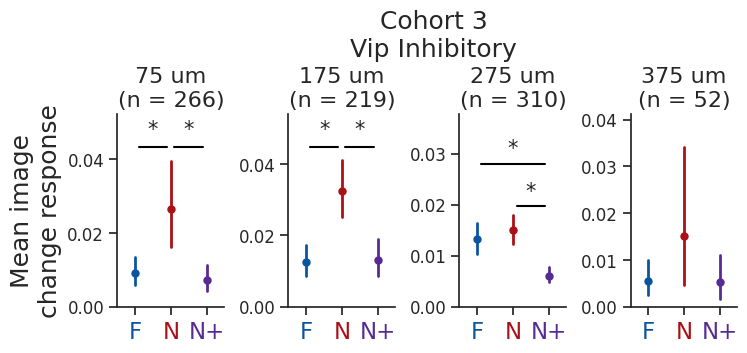

In [138]:
# split by project code and depth 

metric = 'mean_response_changes'
ylabel = 'Mean image\nchange response'
event_type = 'changes'

project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

df = metrics_table.copy()
csids = [1086560073, 1086562892, 1086577313, 1086560671]
# csids = [1086573689, 1086573585, 1086577313, 1086577516, 1086560073, 1086560671, 1086562892, 1086563531,  1086568099, ]
df = df[df.cell_specimen_id.isin(csids)==False]
# oeids = [920288845, 920288849]
# df = df[df.ophys_experiment_id.isin(oeids)==False]

proj_index = 2
project_code = project_codes[proj_index]

for c, cell_type in enumerate(cell_types): 
    ct_data = df[(df.cell_type==cell_type) & (df.project_code==project_code)]
    depths = np.sort(ct_data.binned_depth.unique())
    n_depths = len(depths)
    figsize = (2*n_depths, 2.5)
    fig, ax = plt.subplots(1, n_depths, figsize=figsize, sharey=False)
    if n_depths == 1: 
        depth_data = ct_data[ct_data.binned_depth==depths[0]]
        print(len(depth_data))
        ax = ppf.plot_metric_distribution_by_experience_no_cell_type(depth_data, metric, 
                                                                event_type=event_type, data_type=data_type, hue=None, horiz=False,
                                                                title='', ylabel=ylabel, ylims=None, save_dir=None, ax=ax, suffix='')
        ax.tick_params(axis='y', labelsize=12) 
        ax.set_title(str(depths[0])+' um')
        fig.subplots_adjust(wspace=0.6)
        fig.suptitle(cell_type+'\nCohort '+str(proj_index+1), x=0.52, y=1.2, fontsize=18)
    else: 
        for i, depth in enumerate(depths):
            depth_data = ct_data[ct_data.binned_depth==depth]
            ax[i] = ppf.plot_metric_distribution_by_experience_no_cell_type(depth_data, metric, 
                                                                    event_type=event_type, data_type=data_type, hue=None, horiz=False,
                                                                    title='', ylabel=ylabel, ylims=None, save_dir=None, ax=ax[i], suffix='')
            ax[i].tick_params(axis='y', labelsize=12) 
            ax[i].set_title(str(depth)+' um'+'\n(n = '+str(len(depth_data.cell_specimen_id.unique()))+')', fontsize=16)
            if i!=0:
                ax[i].set_ylabel('')
        fig.subplots_adjust(wspace=0.6)
        # fig.suptitle(cell_type+'\nCohort '+str(proj_index+1), x=0.52, y=1.3, fontsize=18)
        fig.suptitle('Cohort 3\n'+cell_type, x=0.52, y=1.3, fontsize=18)


/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:1603: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax = sns.pointplot(data=data, x=x, y=y, hue='experience_level', order=order,
/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:1674: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)
/root/capsule/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:1603: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax = sns.pointplot(data=data, x=x, y=y, hue='experience_level', order=order,
/root/capsule/visual_be

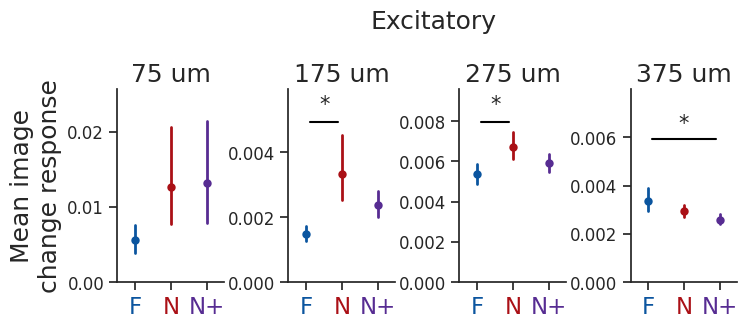

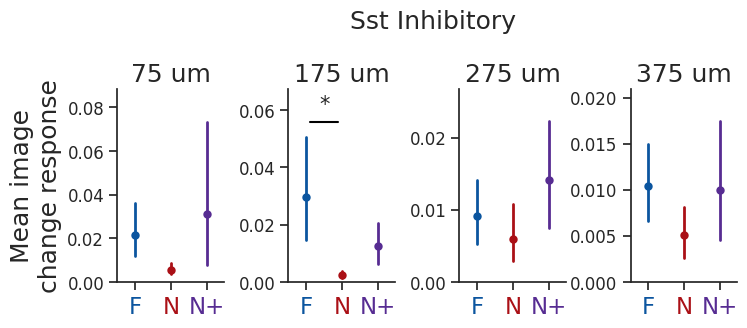

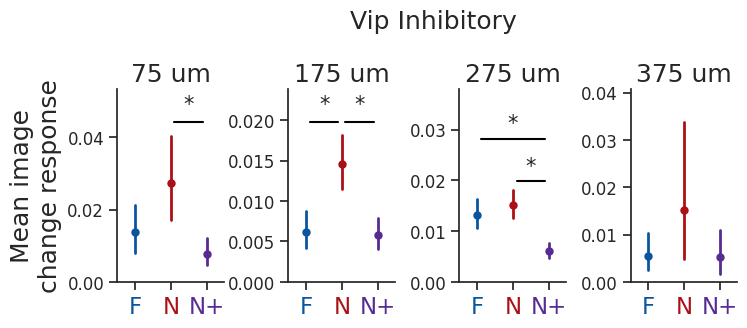

In [139]:
metric = 'mean_response_changes'
ylabel = 'Mean image\nchange response'
event_type = 'changes'


depths = np.sort(metrics_table.binned_depth.unique())

for c, cell_type in enumerate(cell_types): 
    ct_data = metrics_table[(metrics_table.cell_type==cell_type)]
    figsize = (8, 2.5)
    fig, ax = plt.subplots(1, 4, figsize=figsize, sharey=False)
    for i, depth in enumerate(depths):
        depth_data = ct_data[ct_data.binned_depth==depth]
        ax[i] = ppf.plot_metric_distribution_by_experience_no_cell_type(depth_data, metric, 
                                                                event_type=event_type, data_type=data_type, hue=None, horiz=False,
                                                                title='', ylabel=ylabel, ylims=None, save_dir=None, ax=ax[i], suffix='')
        ax[i].tick_params(axis='y', labelsize=12) 
        ax[i].set_title(str(depth)+' um')
        if i!=0:
            ax[i].set_ylabel('')
    fig.subplots_adjust(wspace=0.6)
    fig.suptitle(cell_type, x=0.52, y=1.2, fontsize=18)

    # fig.suptitle(cell_type+'\nCohort 3', x=0.52, y=1.2, fontsize=18)
    # fig.suptitle('Cohort 3\n'+cell_type, x=0.52, y=1.2, fontsize=18)


saving_stats
saving_stats
saving_stats


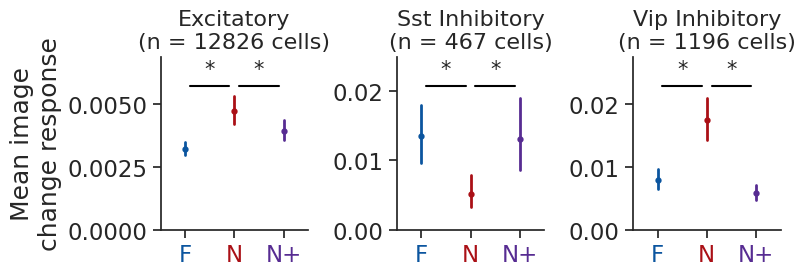

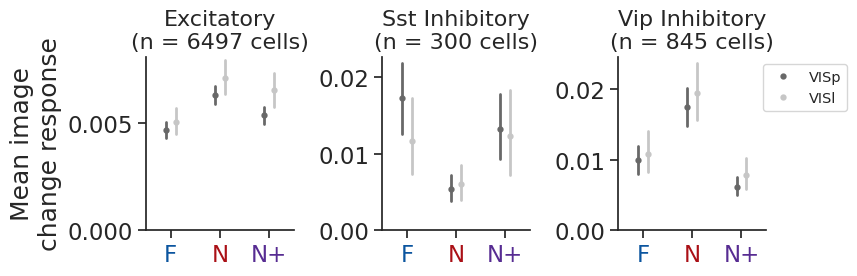

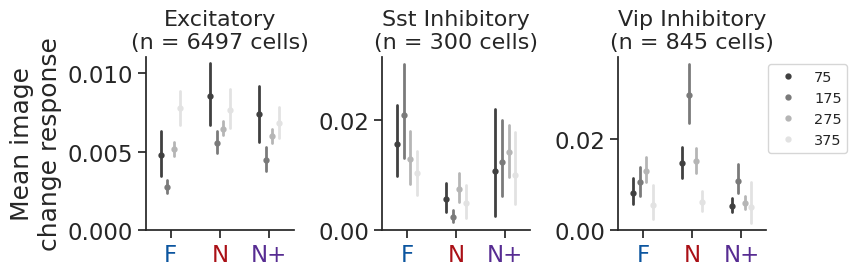

In [140]:
metric = 'mean_response'
ylabel = 'Mean image\nchange response'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_all_conditions(change_mdf, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            remove_outliers=True, add_zero_line=False, save_dir=save_dir)


##### Mean pre change response

saving_stats


array([<Axes: title={'center': 'Excitatory\n(n = 12826 cells)'}, ylabel='Mean pre-change response'>,
       <Axes: title={'center': 'Sst Inhibitory\n(n = 468 cells)'}>,
       <Axes: title={'center': 'Vip Inhibitory\n(n = 1201 cells)'}>],
      dtype=object)

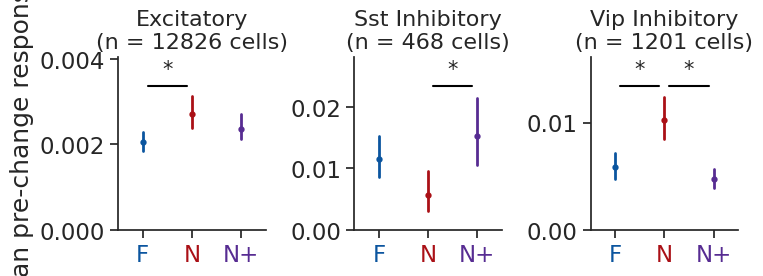

In [141]:
metric = 'mean_response_pre_change'
ylabel = 'Mean pre-change response'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


#### Change response by area & depth

saving_stats
saving_stats
saving_stats


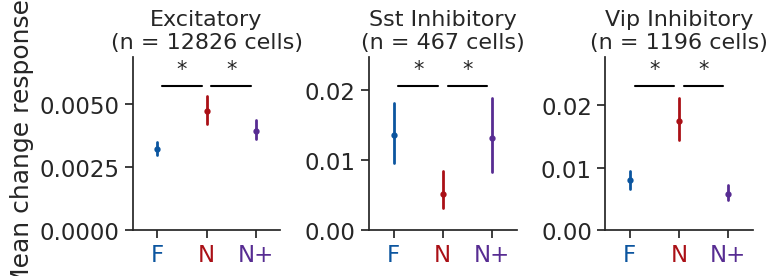

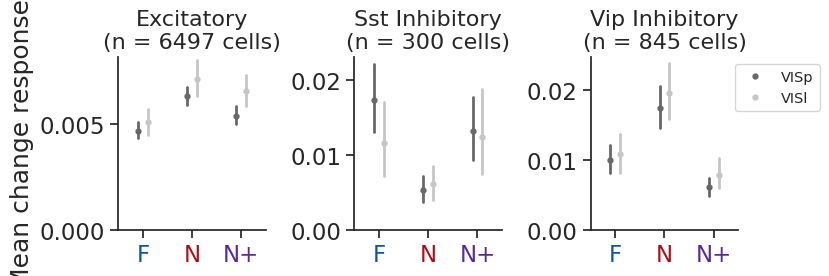

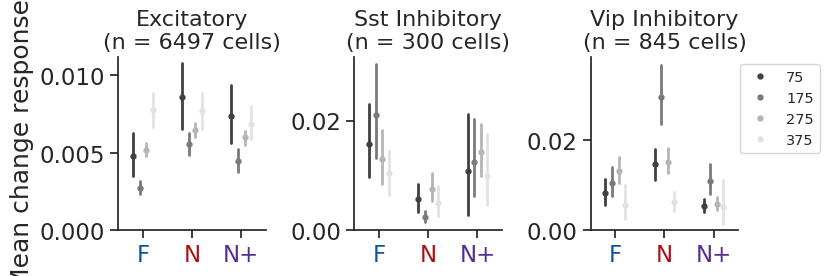

In [142]:
metric = 'mean_response'
ylabel = 'Mean change response'

event_type = 'changes'
data_type = 'filtered_events'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_all_conditions(change_mdf, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            remove_outliers=True, add_zero_line=False, save_dir=save_dir)


### Change modulation

In [143]:
metrics_table.keys()[:30]

Index(['cell_specimen_id', 'experience_level', 'ophys_experiment_id',
       'mean_response_pref_image', 'reliability_pref_image',
       'fraction_significant_p_value_gray_screen_pref_image',
       'fano_factor_pref_image', 'running_modulation_pref_image',
       'mean_response_all_images', 'lifetime_sparseness_images',
       'reliability_all_images',
       'fraction_significant_p_value_gray_screen_all_images',
       'fano_factor_all_images', 'running_modulation_all_images',
       'mean_response_omissions', 'reliability_omissions',
       'fraction_significant_p_value_gray_screen_omissions',
       'fano_factor_omissions', 'running_modulation_omissions',
       'omission_modulation_index', 'mean_response_changes',
       'mean_response_pre_change', 'lifetime_sparseness_changes',
       'reliability_changes',
       'fraction_significant_p_value_gray_screen_changes',
       'fano_factor_changes', 'running_modulation_changes',
       'change_modulation_index', 'hit_miss_index', 'be

In [144]:
folder = 'response_metrics'

In [145]:
# markers='.', scale=0.25, errwidth=0.25, 

saving_stats


array([<Axes: title={'center': 'Excitatory\n(n = 12826 cells)'}, ylabel='Change\nmodulation index'>,
       <Axes: title={'center': 'Sst Inhibitory\n(n = 468 cells)'}>,
       <Axes: title={'center': 'Vip Inhibitory\n(n = 1201 cells)'}>],
      dtype=object)

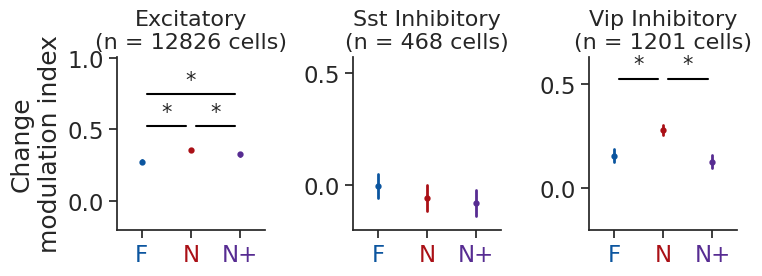

In [146]:
metric = 'change_modulation_index'
ylabel = 'Change\nmodulation index'

event_type = 'changes'

ylims = (-0.2, 0.5)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', horiz=True,
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)


saving_stats


array([<Axes: title={'center': 'Excitatory\n(n = 12826 cells)'}, ylabel='Change modulation index'>,
       <Axes: title={'center': 'Sst Inhibitory\n(n = 468 cells)'}>,
       <Axes: title={'center': 'Vip Inhibitory\n(n = 1201 cells)'}>],
      dtype=object)

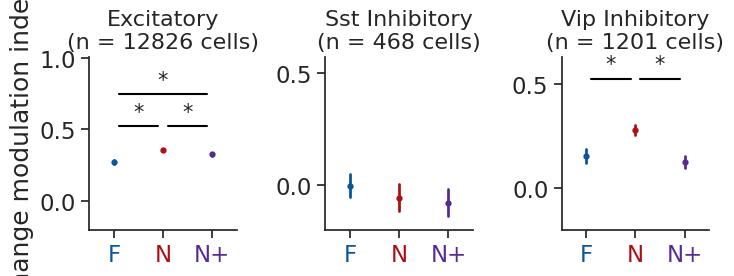

In [147]:
metric = 'change_modulation_index'
ylabel = 'Change modulation index'

event_type = 'changes'

ylims = (-0.2, 0.5)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)


In [148]:
metric = 'change_modulation_index'
xlabel = 'Change\nmodulation index'

event_type = 'changes'

In [149]:

# def plot_modulation_index_distribution(metrics_table, metric, xlabel=None, xlims=(-1.1, 1.1), horiz=False, annot=('left', 'right'), 
#                                         abbreviate_exp=True, suptitle=None, save_dir=None, folder=None, ax=None, suffix=''):
    
    
    
#     colors = utils.get_experience_level_colors()
#     experience_levels = utils.get_experience_levels()

#     data = metrics_table.copy() 

#     ax = None
#     if ax is None:
#         if horiz:
#             figsize = (8, 2.5)
#             fig, ax = plt.subplots(1, 3, figsize=figsize, sharex=False, sharey=True)
#         else:
#             figsize = (2, 6)
#             fig, ax = plt.subplots(3, 1, figsize=figsize, sharex=True, sharey=False)
#         ax = ax.ravel()
#     # stats dataframe to save
#     tukey = pd.DataFrame()
#     cell_types = utils.get_cell_types()
#     for i, cell_type in enumerate(cell_types):
#         ct_data = data[data.cell_type == cell_type]
#         ax[i] = sns.violinplot(data=ct_data, x=metric, y='experience_level', order=experience_levels, orient='h',
#                                             palette=colors, alpha=0.5,  cut=0, ax=ax[i])
#         # set title
#         ax[i].set_title(cell_type)
#         # set x and y axis properties
#         ax[i].set_ylabel('')
#         ax[i].set_xlabel('')
#         ax[i].set_xlim(xlims)
#         if abbreviate_exp: 
#             ax[i].set_yticklabels(utils.get_abbreviated_experience_levels(), rotation=0)
#         # set alpha on violinplots
#         plt.setp(ax[i].collections, alpha=0.7)
#         # line at zero value
#         ax[i].axvline(x=0, ymin=0, ymax=1, color='gray', linestyle='--')

#         # add stats to plot
#         ax[i], tukey_table = ppf.add_stats_to_plot_xaxis(ct_data, metric, ax[i], xmax=xlims[1], column_to_compare='experience_level')
#         tukey_table['metric'] = metric
#         tukey_table['cell_type'] = cell_type
#         tukey = pd.concat([tukey, tukey_table])

#     if horiz: 
#         ax[0].annotate('pre-change', xy=(-1.2, -0.05), xycoords=ax[0].get_xaxis_transform(), ha="right", va="center", fontsize=10)
#         ax[2].annotate('change', xy=(1.2, -0.05), xycoords=ax[2].get_xaxis_transform(), ha="left", va="center", fontsize=10)
#         ax[1].set_xlabel(xlabel)
#     else:
#         ax[2].annotate('pre-change', xy=(-1.2, -0.05), xycoords=ax[2].get_xaxis_transform(), ha="right", va="center", fontsize=10)
#         ax[2].annotate('change', xy=(1.2, -0.05), xycoords=ax[2].get_xaxis_transform(), ha="left", va="center", fontsize=10)
#         ax[2].set_xlabel(xlabel)    

#     if suptitle:
#         plt.suptitle(suptitle, x=0.52, y=0.98, fontsize=16)
    
#     fig.subplots_adjust(hspace=0.4, wspace=0.4)
    
#     if save_dir:
#         if horiz:
#             suffix = suffix + '_horiz'
#         folder = 'metric_distributions'
#         filename = metric + '_distribution' + suffix
#         stats_filename = metric + suffix
#         utils.save_figure(fig, figsize, save_dir, folder, filename)
#         try:
#             print('saving_stats')
#             # save tukey
#             tukey.to_csv(os.path.join(save_dir, folder, stats_filename + '_tukey.csv'))
#             # save descriptive stats
#             cols_to_groupby = ['cell_type', 'experience_level']
#             stats = ppf.get_descriptive_stats_for_metric(data, metric, cols_to_groupby)
#             stats.to_csv(os.path.join(save_dir, folder, stats_filename + '_values.csv'))
#         except BaseException:
#             print('STATS DID NOT SAVE FOR', metric)
#     return ax




saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, xlabel='Change modulation'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

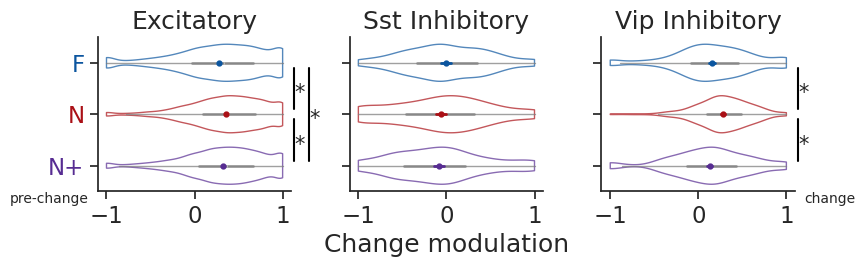

In [150]:
metric = 'change_modulation_index'
xlabel = 'Change modulation'
event_type = 'changes'
annot = ('pre-change', 'change')
xlims = (-1.1, 1.1)

ppf.plot_modulation_index_distribution(metrics_table, metric, label=xlabel, lims=xlims, horiz=True, annot=annot, 
                                        abbreviate_exp=True, suptitle=None, fill=False, save_dir=save_dir, suffix=suffix)

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}>,
       <Axes: title={'center': 'Vip Inhibitory'}, xlabel='Change modulation'>],
      dtype=object)

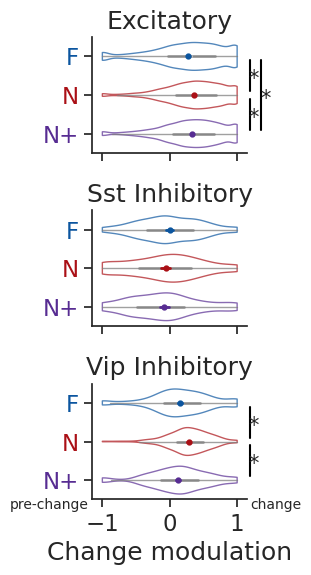

In [151]:
metric = 'change_modulation_index'
xlabel = 'Change modulation'
event_type = 'changes'
annot = ('pre-change', 'change')
xlims = (-1.15, 1.15)

ppf.plot_modulation_index_distribution(metrics_table, metric, label=xlabel, lims=xlims, horiz=False, annot=annot, 
                                        abbreviate_exp=True, suptitle=None, fill=False, save_dir=save_dir, suffix=suffix)

saving_stats


array([<Axes: title={'center': 'Excitatory\n(n = 12826 cells)'}, ylabel='Change modulation'>,
       <Axes: title={'center': 'Sst Inhibitory\n(n = 468 cells)'}>,
       <Axes: title={'center': 'Vip Inhibitory\n(n = 1201 cells)'}>],
      dtype=object)

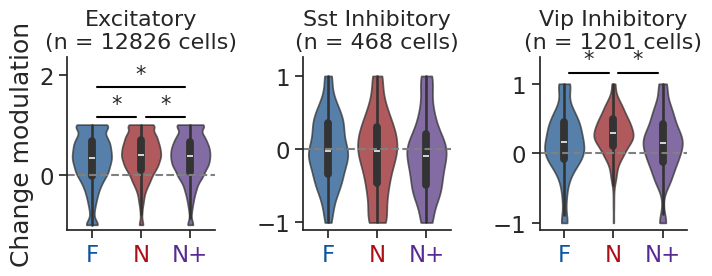

In [152]:
metric = 'change_modulation_index'
ylabel = 'Change modulation'

event_type = 'changes'

ylims = None #(-0.5, 0.5) #None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot', abbreviate_exp=True,
                                           add_zero_line=True, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

##### Change modulation index by area & depth

In [154]:
metrics_table.head()

,cell_specimen_id,experience_level,ophys_experiment_id,mean_response_pref_image,reliability_pref_image,fraction_significant_p_value_gray_screen_pref_image,fano_factor_pref_image,running_modulation_pref_image,mean_response_all_images,lifetime_sparseness_images,...,layer,area_layer,date,first_novel,n_relative_to_first_novel,last_familiar,last_familiar_active,second_novel,second_novel_active,experience_exposure
0,1086490480,Familiar,795073741,0.000131,0.122168,0.011364,0.011834,1.0,0.000066,0.348866,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
1,1086490397,Familiar,795073741,0.000961,0.452276,0.000000,0.019686,1.0,0.000396,0.424478,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
2,1086490510,Familiar,795073741,0.004260,0.183585,0.160149,0.043784,1.0,0.001107,0.574101,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
3,1086490565,Familiar,795073741,0.000229,0.738372,0.002410,0.013540,1.0,0.000092,0.374332,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
4,1086490680,Familiar,795073741,0.003442,0.336522,0.072289,0.082742,1.0,0.001172,0.441491,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3


TypeError: list indices must be integers or slices, not str

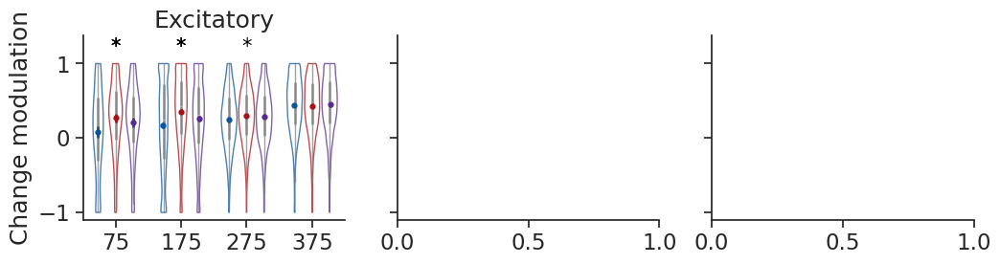

In [ ]:
metric = 'change_modulation_index'
label = 'Change modulation'
event_type = 'changes'
annot = ('pre-change', 'change')
lims = (-1.1, 1.1)

ppf.plot_modulation_index_distribution(metrics_table, metric, x_axis_col='binned_depth', x_axis_label='Imaging depth (um)',
                                       label=label, lims=lims, horiz=True, annot=annot, 
                                        abbreviate_exp=True, suptitle=None, fill=False, save_dir=save_dir, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Change modulation'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Visual area'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

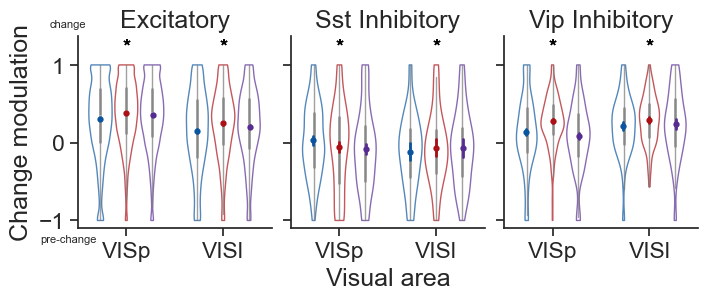

In [ ]:
metric = 'change_modulation_index'
label = 'Change modulation'
event_type = 'changes'
annot = ('pre-change', 'change')
lims = (-1.1, 1.1)

ppf.plot_modulation_index_distribution(metrics_table, metric, x_axis_col='targeted_structure', x_axis_label='Visual area',
                                       label=label, lims=lims, horiz=True, annot=annot, 
                                        abbreviate_exp=True, suptitle=None, fill=False, save_dir=save_dir, suffix=suffix)

#### regular plots

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


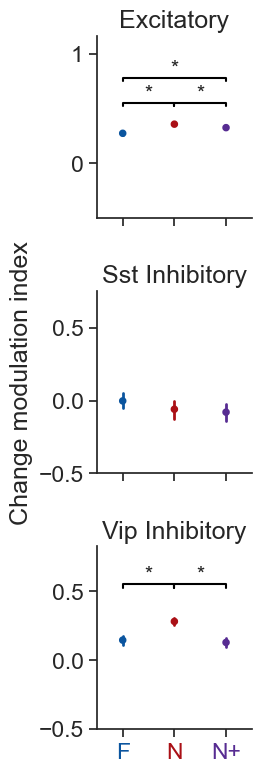

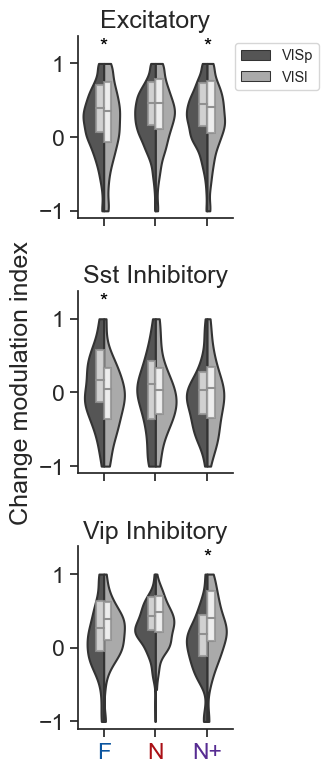

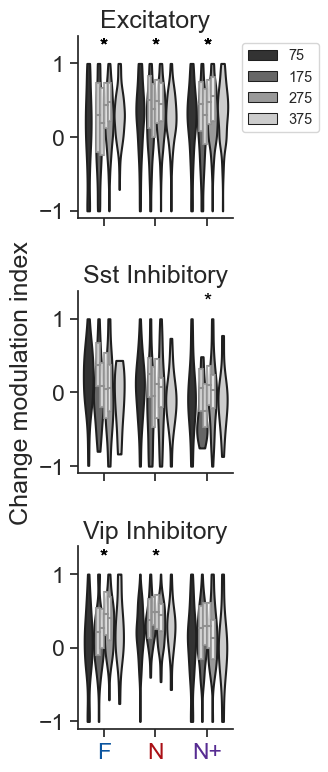

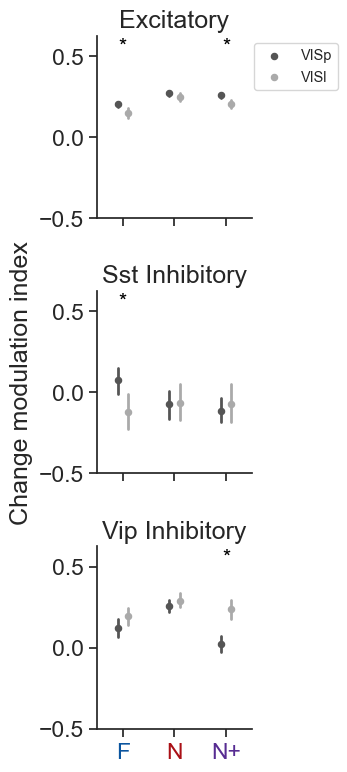

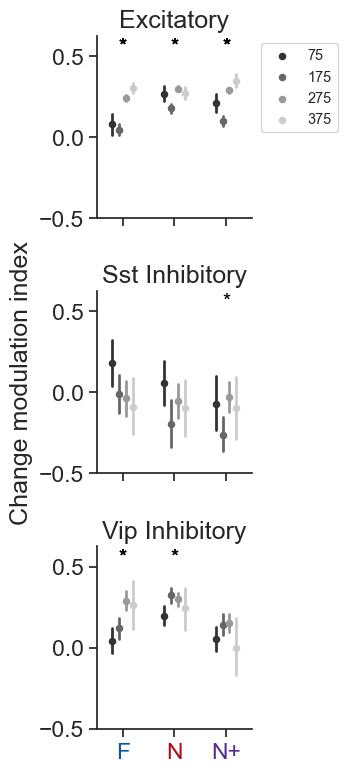

In [ ]:
metric = 'change_modulation_index'
ylabel = 'Change modulation index'

event_type = 'changes'
data_type = 'filtered_events'

ylims = None #(-0.5, 0.5) #None #(-0.001, 0.025)

# ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot', 
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, save_dir=save_dir)

#### choice modulation

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Choice modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

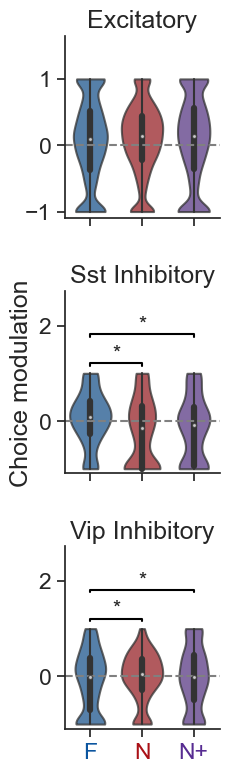

In [ ]:
metric = 'hit_miss_index'
ylabel = 'Choice modulation'

event_type = 'changes'


# ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=(-0.31, 0.31), save_dir=save_dir, ax=None)


ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot',
                                           add_zero_line=True, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=None, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

### Omission responses

#### omission modulation

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Omission modulation'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

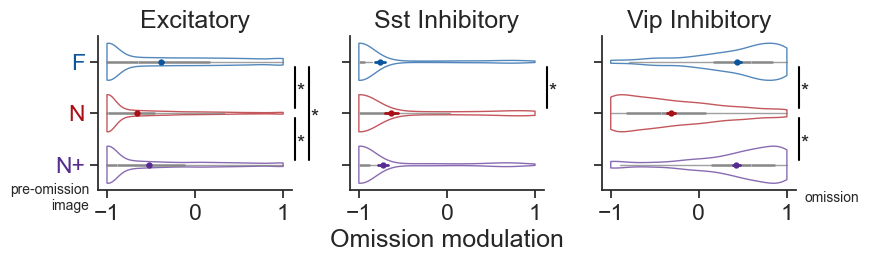

In [ ]:
metric = 'omission_modulation_index'
xlabel = 'Omission modulation'
event_type = 'omissions'
annot = ('pre-omission\nimage', 'omission')
xlims = (-1.1, 1.1)
horiz = True
suffix = ''

ppf.plot_modulation_index_distribution(metrics_table, metric, label=xlabel, lims=xlims, horiz=horiz, annot=annot, 
                                        fill=False, abbreviate_exp=True, suptitle=None, save_dir=save_dir, suffix=suffix)


saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Omission modulation'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='Imaging depth (um)'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

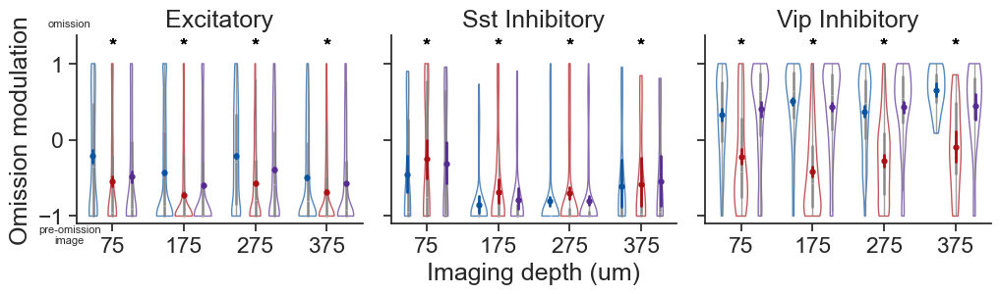

In [ ]:
metric = 'omission_modulation_index'
label = 'Omission modulation'
event_type = 'omissions'
annot = ('pre-omission\nimage', 'omission')
lims = (-1.1, 1.1)
suffix = ''

ppf.plot_modulation_index_distribution(metrics_table, metric, x_axis_col='binned_depth', x_axis_label='Imaging depth (um)',
                                       label=label, lims=lims, horiz=True, annot=annot, 
                                        abbreviate_exp=True, suptitle=None, fill=False, save_dir=save_dir, suffix=suffix)

#### Omission response magnitude

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric, palette=colors,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1866: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.point

saving_stats


array([<AxesSubplot:title={'center':'Excitatory\n(n = 12826 cells)'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory\n(n = 467 cells)'}, ylabel='Omission response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory\n(n = 1197 cells)'}>],
      dtype=object)

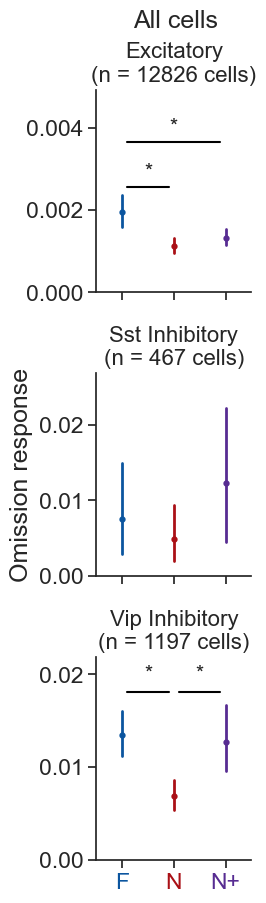

In [ ]:
metric = 'mean_response'
ylabel = 'Omission response'

event_type = 'omissions'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(omission_mdf, metric, plot_type='pointplot', horiz=False, 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           suptitle='All cells',
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, remove_outliers=True, save_dir=save_dir)

##### Omission response by cohort

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric, palette=colors,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1866: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.point

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric, palette=colors,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1866: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.point

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric, palette=colors,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1866: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.point

saving_stats


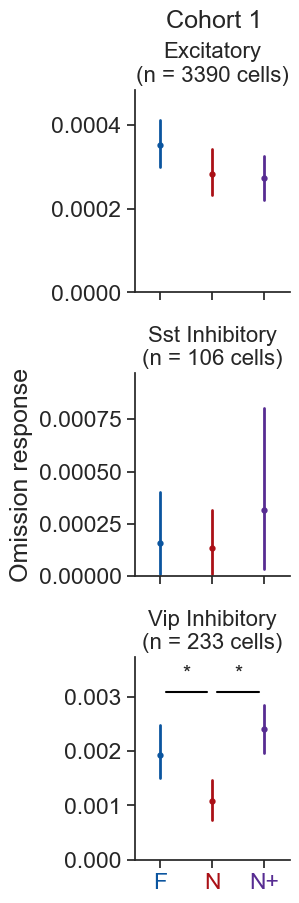

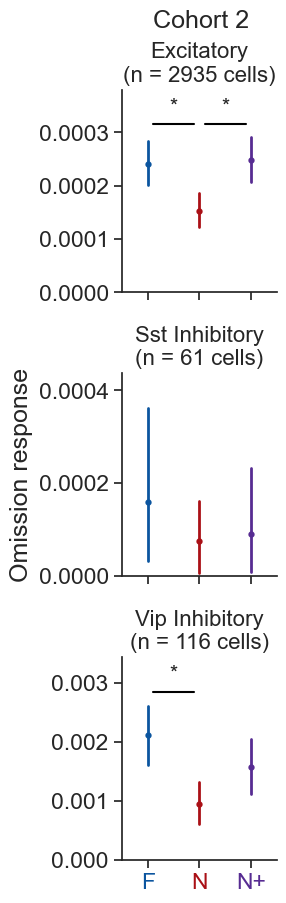

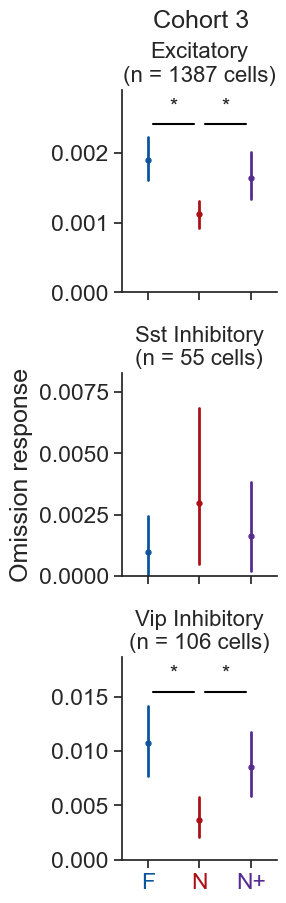

In [ ]:
# with omission mdf
metric = 'mean_response'
ylabel = 'Omission response'

df = omission_mdf.copy()
# limit to area / depths that are shared across cohorts (only Multiscope has 75 & 375 depths and VISl)
matched_oeids = utils.get_experiments_matched_across_project_codes(df)
df = df[df.ophys_experiment_id.isin(matched_oeids)]

event_type = 'omissions'

ylims = None #(-0.001, 0.025)

project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

for i, project_code in enumerate(project_codes): 
    suffix = '_omissions_'+project_code
    suptitle = 'Cohort '+str(i+1)
    tmp = df[df.project_code==project_code]
    tmp = tmp[tmp.mean_response<np.percentile(tmp.mean_response.values, 99.7)]
        
    ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot', 
                                            add_zero_line=False, event_type=event_type, data_type=data_type,
                                            suptitle=suptitle, suffix=suffix, horiz=False, 
                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, remove_outliers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1587: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax = sns.pointplot(data=data, x=x, y=y, hue='experience_level', order=order,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1658: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1587: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax = sns.pointplot(data=data, x=x, y=y, hue='experience_level', order=order,
C:\Users\marinag\Docum

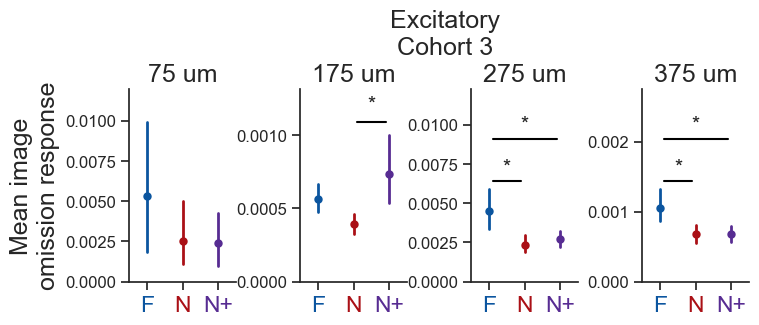

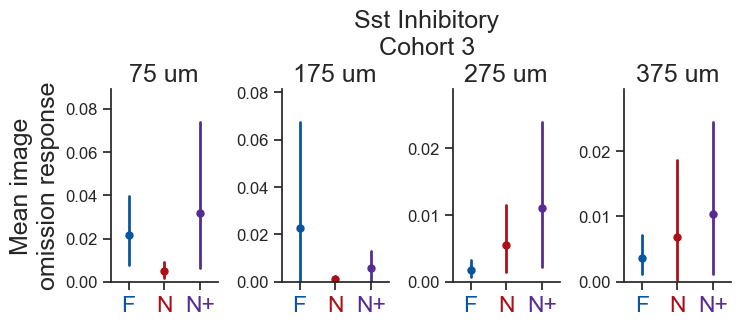

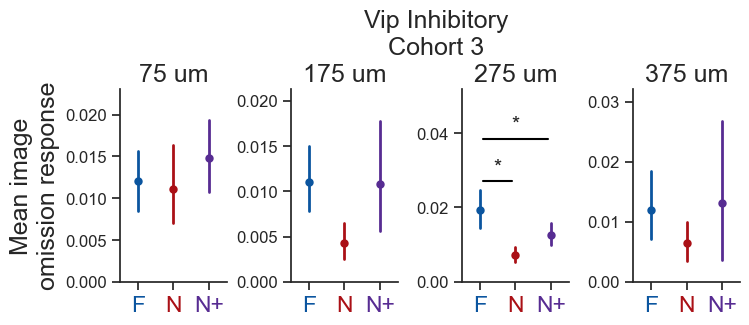

In [ ]:
metric = 'mean_response_omissions'
ylabel = 'Mean image\nomission response'
event_type = 'omissions'


depths = np.sort(metrics_table.binned_depth.unique())

for c, cell_type in enumerate(cell_types): 
    ct_data = metrics_table[(metrics_table.cell_type==cell_type)]
    figsize = (8, 2.5)
    fig, ax = plt.subplots(1, 4, figsize=figsize, sharey=False)
    for i, depth in enumerate(depths):
        depth_data = ct_data[ct_data.binned_depth==depth]
        ax[i] = ppf.plot_metric_distribution_by_experience_no_cell_type(depth_data, metric, 
                                                                event_type=event_type, data_type=data_type, hue=None, horiz=False,
                                                                title='', ylabel=ylabel, ylims=None, save_dir=None, ax=ax[i], suffix='')
        ax[i].tick_params(axis='y', labelsize=12) 
        ax[i].set_title(str(depth)+' um')
        if i!=0:
            ax[i].set_ylabel('')
    fig.subplots_adjust(wspace=0.6)
    fig.suptitle(cell_type+'\nCohort 3', x=0.52, y=1.2, fontsize=18)

    # fig.suptitle(cell_type+'\nCohort 3', x=0.52, y=1.2, fontsize=18)
    # fig.suptitle('Cohort 3\n'+cell_type, x=0.52, y=1.2, fontsize=18)


In [ ]:
# # with metrics table 
# metric = 'mean_response_omissions'
# ylabel = 'Mean omission response'

# df = metrics_table.copy()
# event_type = 'omissions'

# ylims = None #(-0.001, 0.025)

# project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']

# for i, project_code in enumerate(project_codes): 
#     suffix = '_omissions_'+project_code
#     suptitle = project_code+'\nCohort '+str(i+1)
#     tmp = df[df.project_code==project_code]
#     tmp = tmp[tmp[metric]<np.percentile(tmp[metric].values, 99.7)]
        
#     ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot', 
#                                             add_zero_line=False, event_type=event_type, data_type=data_type,
#                                             suptitle=suptitle, suffix=suffix,
#                                             ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, remove_outliers=True, save_dir=save_dir)

saving_stats
saving_stats
saving_stats


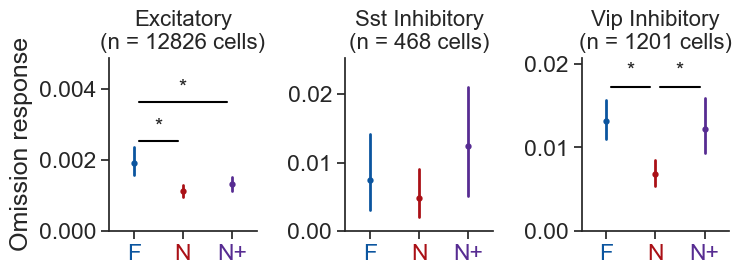

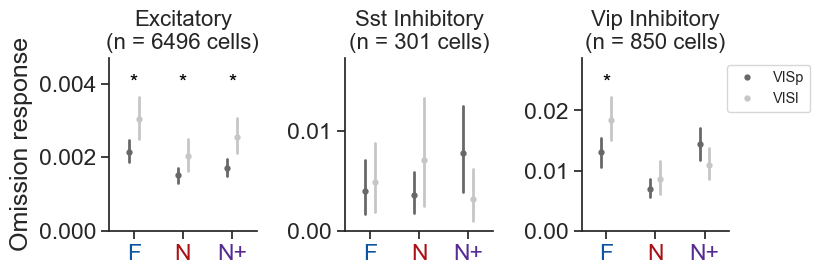

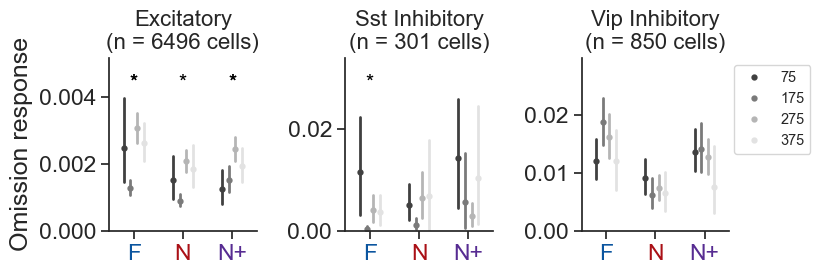

In [ ]:
metric = 'mean_response_omissions'
ylabel = 'Omission response'

event_type = 'omissions'
data_type = 'filtered_events'

ylims = None #(-0.001, 0.025)

# ppf.plot_metric_distribution_by_experience(omission_mdf, metric, plot_type='pointplot', 
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, remove_outliers=True, save_dir=save_dir)

401 experiments in metric_data before merging with cells_table
14490 cells in metric_data before merging with cells_table
401 experiments in metric_data after merging with cells_table
14490 cells in metric_data after merging with cells_table


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:2178: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:2178: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:2178: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavi

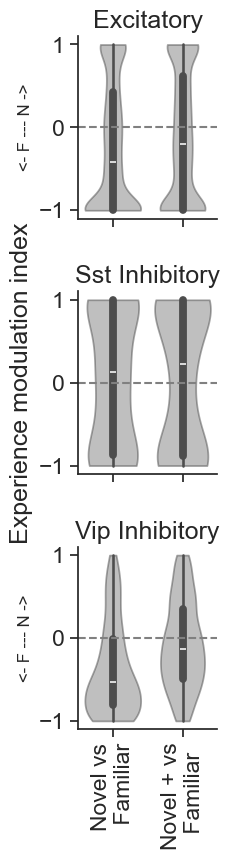

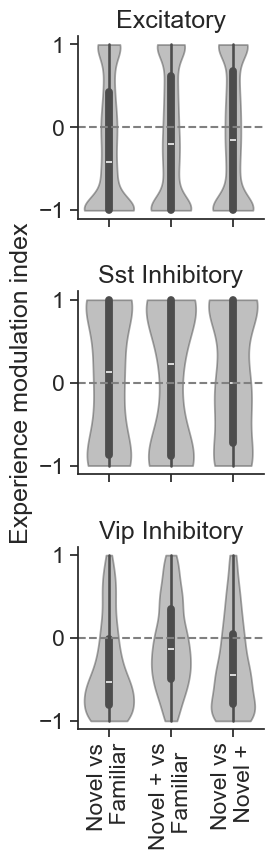

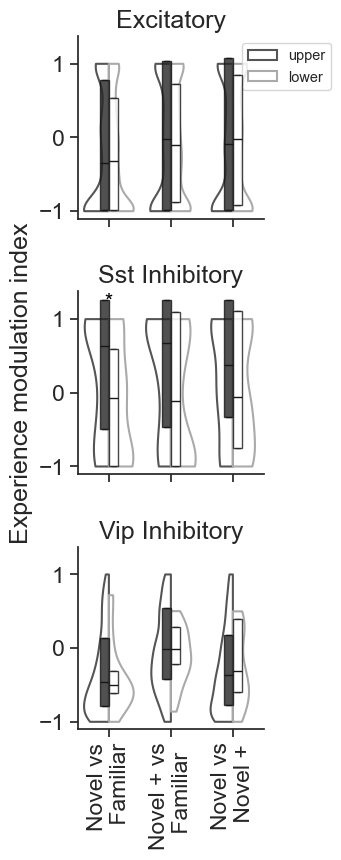

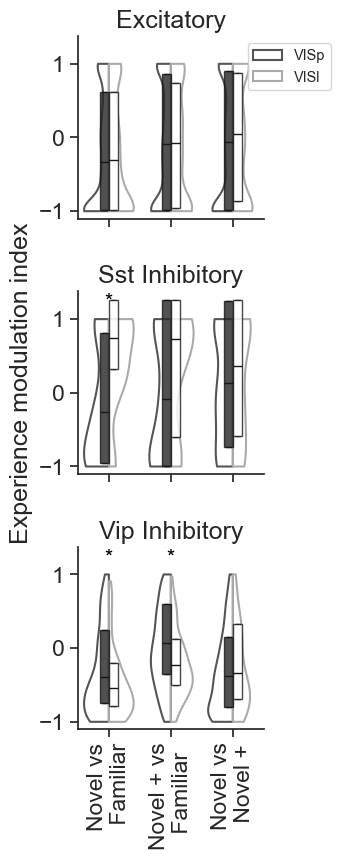

In [ ]:
metric = 'mean_response'
event_type = 'omissions'

exp_mod = cm.compute_experience_modulation_index(omission_mdf, metric, platform_cells_table)
exp_mod = exp_mod.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)


In [ ]:
# metric = 'mean_response_omissions'
# ylabel = 'Omission response'

# event_type = 'omissions'

# ylims = None #(-0.001, 0.025)

# ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', 
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

In [ ]:
# metric = 'mean_response_omissions'
# event_type = 'omissions'

# exp_mod = cm.compute_experience_modulation_index(metrics_table, metric, platform_cells_table)
# exp_mod = exp_mod.drop_duplicates(subset='cell_specimen_id')

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)


#### Reliability

please provide ylims
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Change response reliability'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

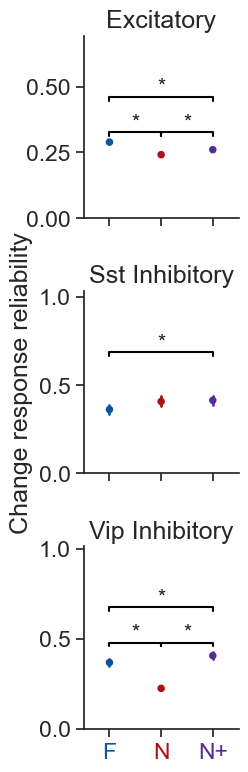

In [ ]:
metric = 'reliability_changes'
ylabel = 'Change response reliability'
event_type = 'changes'
data_type = 'filtered_events'

ylims = None

df = metrics_table.copy()

ppf.plot_metric_distribution_by_experience(df, metric, plot_type='pointplot', 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(df, metric, event_type, data_type,
#                     ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)


please provide ylims
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Change response fano factor'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

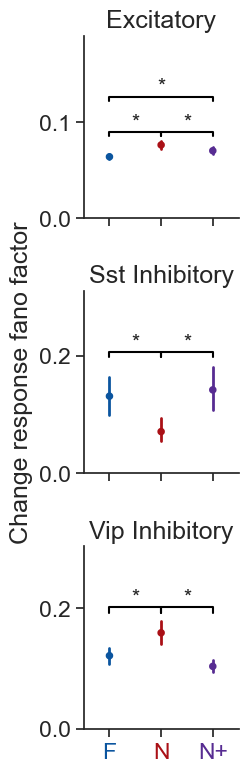

In [ ]:
metric = 'fano_factor_changes'
ylabel = 'Change response fano factor'
event_type = 'changes'
data_type = 'filtered_events'

ylims = None

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)


# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type,
#                     ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)


#### Running modulation

In [ ]:
# metric = 'running_modulation_changes'
# ylabel = 'Running modulation'
# event_type = 'changes'
# data_type = 'filtered_events'

# ylims = (-0.6, 0.6)

# metrics_table = metrics_table.copy()

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type,
#                             ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### Image selectivity 

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot(data=ct_data, y=metric, x='experience_level', order=order,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1860: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinp

saving_stats


array([<AxesSubplot:title={'center':'Excitatory\n(n = 12826 cells)'}, ylabel='Image selectivity - all cells'>,
       <AxesSubplot:title={'center':'Sst Inhibitory\n(n = 468 cells)'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory\n(n = 1201 cells)'}>],
      dtype=object)

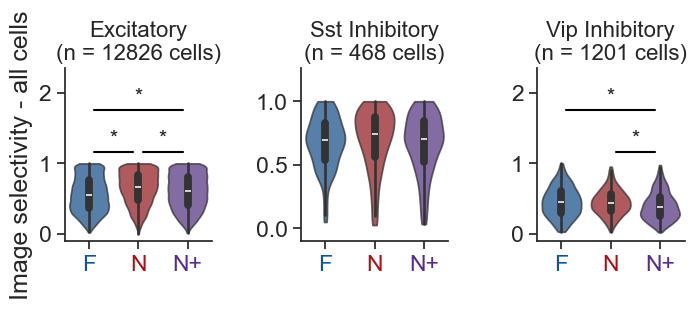

In [ ]:
# all cells 

metric = 'lifetime_sparseness_images'
ylabel = 'Image selectivity - all cells'

event_type = 'images'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot', horiz=True,
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot(data=ct_data, y=metric, x='experience_level', order=order,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1860: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1808: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinp

saving_stats


array([<AxesSubplot:title={'center':'Excitatory\n(n = 5395 cells)'}, ylabel='Image selectivity - responsive cells'>,
       <AxesSubplot:title={'center':'Sst Inhibitory\n(n = 341 cells)'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory\n(n = 453 cells)'}>],
      dtype=object)

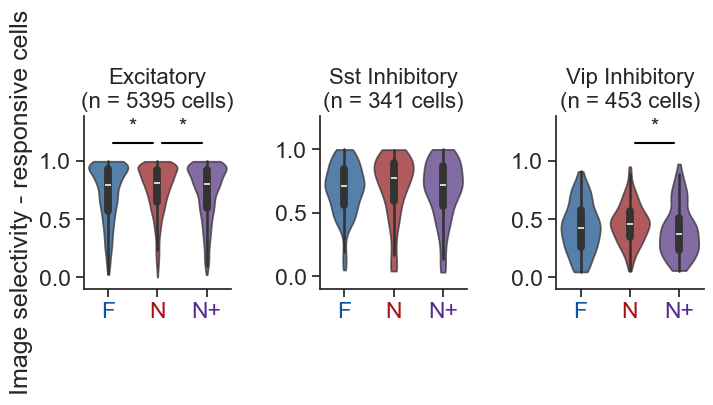

In [ ]:
# responsive cells 

metric = 'lifetime_sparseness_images'
ylabel = 'Image selectivity - responsive cells'

event_type = 'images'

ylims = [-0.1, 1.1]

tmp = metrics_table[metrics_table.fraction_significant_p_value_gray_screen_pref_image>0.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(tmp, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

saving_stats
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity - changes, all cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

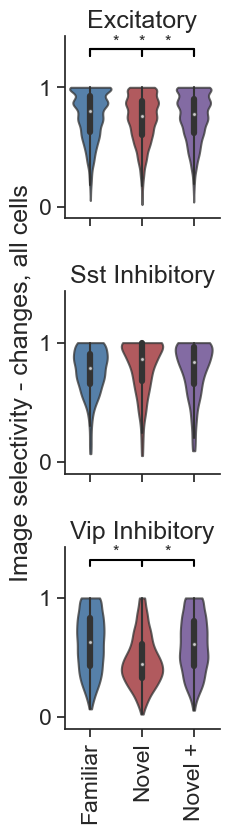

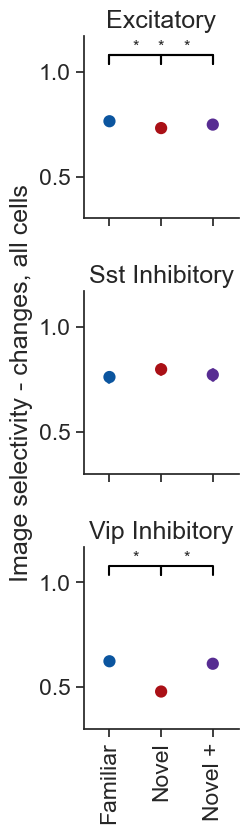

In [ ]:
# all cells 

metric = 'lifetime_sparseness_changes'
ylabel = 'Image selectivity - changes, all cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


saving_stats
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity - changes, responsive cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

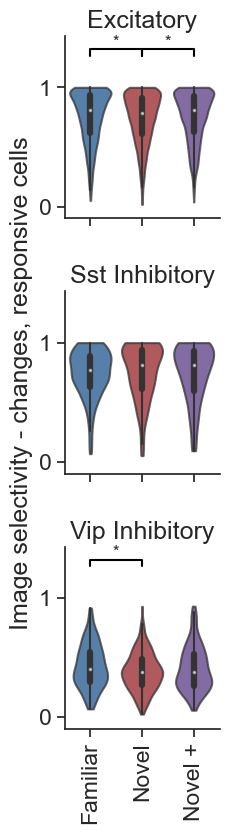

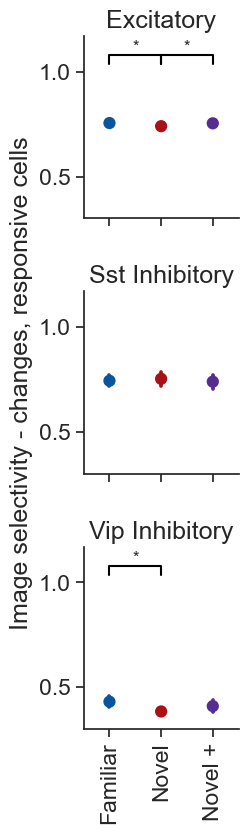

In [ ]:

# responsive cells 

metric = 'lifetime_sparseness_changes'
ylabel = 'Image selectivity - changes, responsive cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

tmpt = metrics_table[metrics_table.fraction_significant_p_value_gray_screen_changes>0.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(tmp, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

#### filter by responsiveness to preferred image for changes

In [ ]:
# # changes
# condition = 'changes'
# stimuli = 'pref_image'
# data_type = 'events'
# change_response_metrics = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)


In [ ]:
metrics_table.keys()

Index(['cell_specimen_id', 'experience_level', 'ophys_experiment_id',
       'mean_response_pref_image', 'reliability_pref_image',
       'fraction_significant_p_value_gray_screen_pref_image',
       'fano_factor_pref_image', 'running_modulation_pref_image',
       'mean_response_all_images', 'lifetime_sparseness_images',
       'reliability_all_images',
       'fraction_significant_p_value_gray_screen_all_images',
       'fano_factor_all_images', 'running_modulation_all_images',
       'mean_response_omissions', 'reliability_omissions',
       'fraction_significant_p_value_gray_screen_omissions',
       'fano_factor_omissions', 'running_modulation_omissions',
       'omission_modulation_index', 'mean_response_changes',
       'mean_response_pre_change', 'lifetime_sparseness_changes',
       'reliability_changes',
       'fraction_significant_p_value_gray_screen_changes',
       'fano_factor_changes', 'running_modulation_changes',
       'change_modulation_index', 'hit_miss_index', 'be

saving_stats
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity - changes, all cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

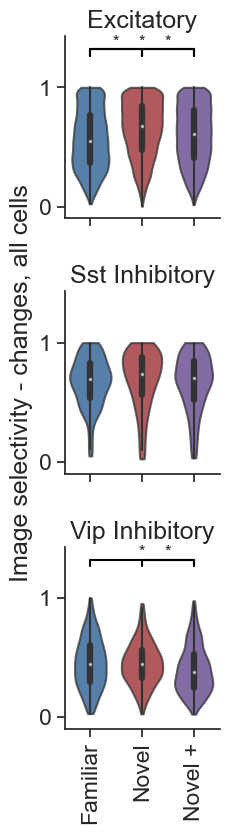

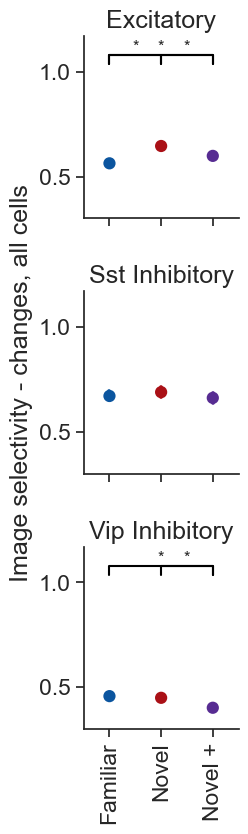

In [ ]:
# all cells

# tmp = change_response_metrics.copy()

tmp = metrics_table.copy()

metric = 'lifetime_sparseness_images'
ylabel = 'Image selectivity - changes, all cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


saving_stats
saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Image selectivity - changes, pref image responsive cells'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

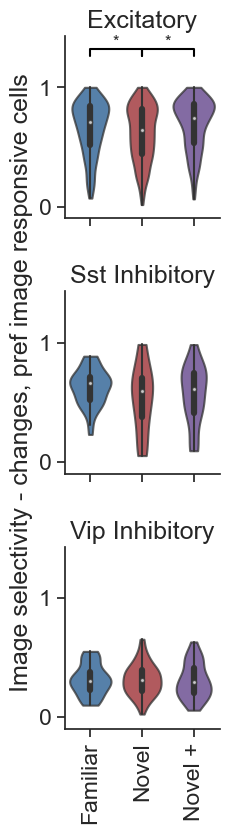

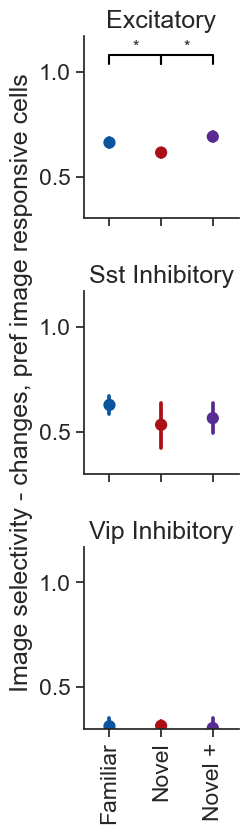

In [ ]:
# responsive cells
tmp = metrics_table.copy()
tmp = tmp[tmp.fraction_significant_p_value_gray_screen_changes>0.2]

metric = 'lifetime_sparseness_changes'
ylabel = 'Image selectivity - changes, pref image responsive cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


## Within session changes

### Changes across epochs

In [ ]:
# params for stim response df creation
data_type = 'events'
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change', 'epoch']


suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

change_epoch_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=5)

change_epoch_mdf = change_epoch_mdf[change_epoch_mdf.is_change==True]

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl


In [ ]:
len(change_epoch_mdf.ophys_experiment_id.unique())

396

In [ ]:
change_epoch_mdf.epoch.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13,  0],
      dtype=int64)

### Omissions across epochs

In [ ]:
data_type

'events'

In [ ]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted', 'epoch']


suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

epoch_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=5)
original_epoch_mdf = epoch_mdf.copy()

omission_epoch_mdf = epoch_mdf[epoch_mdf.omitted==True]
image_epoch_mdf = epoch_mdf[epoch_mdf.omitted==False]

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_omitted_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_omitted_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1879 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


In [ ]:
omission_epoch_mdf.epoch.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [ ]:
len(omission_epoch_mdf.ophys_experiment_id.unique())

401

In [ ]:
omission_epoch_mdf.experience_level.unique()

array(['Familiar', 'Novel', 'Novel +'], dtype=object)

In [ ]:
# # remove truncated last epoch
# omission_epoch_mdf = omission_epoch_mdf[omission_epoch_mdf.epoch!=6]
# # image_epoch_mdf = image_epoch_mdf[image_epoch_mdf.epoch!=6]

# omission_epoch_mdf['experience_epoch'] = [omission_epoch_mdf.iloc[row].experience_label + ' - ' + str(omission_epoch_mdf.iloc[row].epoch) for row in omission_epoch_mdf.index.values]
# # image_epoch_mdf['experience_epoch'] = [image_epoch_mdf.iloc[row].experience_label + ' - ' + str(image_epoch_mdf.iloc[row].epoch) for row in image_epoch_mdf.index.values]

In [ ]:
# experience_epoch = np.sort(omission_epoch_mdf.experience_epoch.unique())
# experience_epoch = np.sort(omission_epoch_mdf[omission_epoch_mdf.experience_level==experience_levels[0]].experience_epoch.unique())
# experience_epoch = np.sort(omission_epoch_mdf.epoch.unique())
# print(experience_epoch)

# xticks = np.arange(0, len(experience_epoch), 1)
# xticklabels = np.arange(0, len(experience_epoch), 1)
# # xticklabels = [experience_epoch.split(' ')[1] for experience_epoch in experience_epoch]
# xticklabels

#### epoch response heatmap

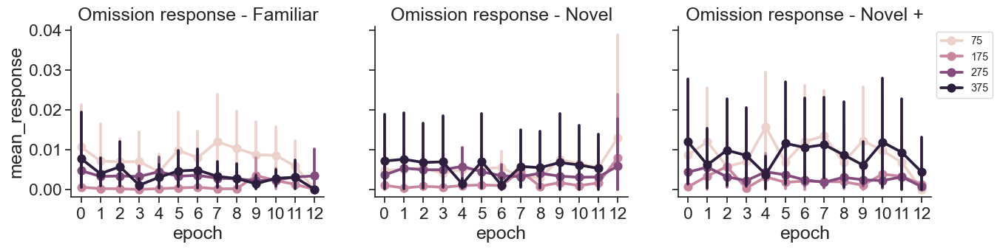

In [ ]:
df = omission_epoch_mdf.copy()
df = df[(df.project_code=='VisualBehaviorMultiscope') & (df.cell_type=='Sst Inhibitory')]
df = df[df.mean_response<np.percentile(df.mean_response.values, 98)]

fig, ax = plt.subplots(1, 3, figsize= (15,3), sharey=True)

for i, experience_level in enumerate(experience_levels): 
        ax[i] = sns.pointplot(data=df[df.experience_level==experience_level], x='epoch', y='mean_response', hue='binned_depth', ax=ax[i])
        ax[i].set_title('Omission response - '+experience_level)
        ax[i].get_legend().remove()
ax[i].legend(bbox_to_anchor=(1,1), fontsize='xx-small')

In [ ]:
df = omission_epoch_mdf.copy()
df = df[(df.project_code=='VisualBehaviorMultiscope')]
df = df[df.mean_response<np.percentile(df.mean_response.values, 98)]
df = df[df.epoch!=12]


df = df[(df.cell_type=='Sst Inhibitory') & (df.experience_level=='Familiar')]

exp_data = df.reset_index().pivot(index=['cell_specimen_id'], columns='epoch', values='mean_response')
exp_data = exp_data.sort_values(by=[0], ascending=False)
# df = df.reset_index()

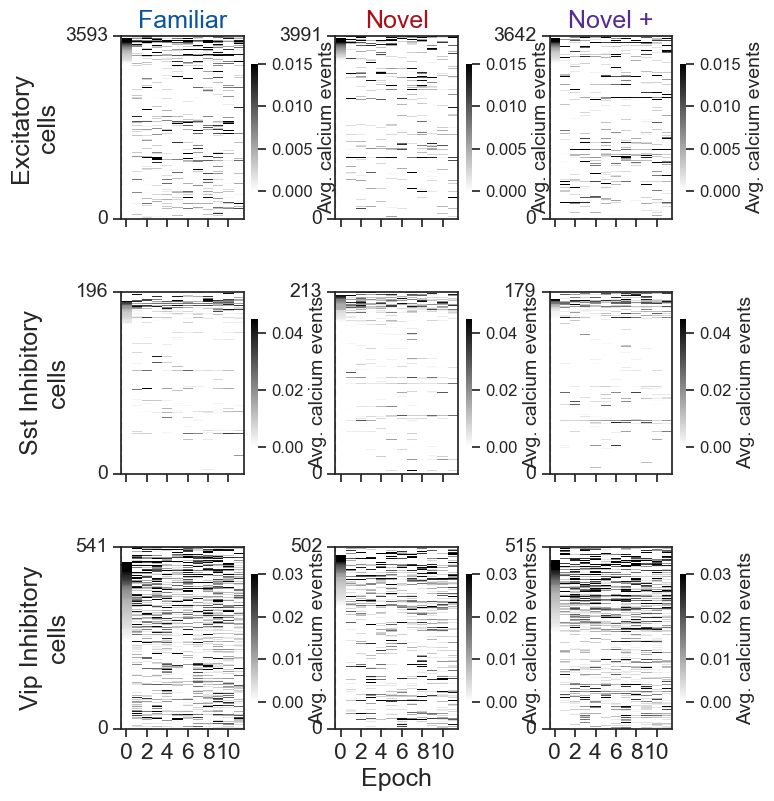

In [ ]:
df = omission_epoch_mdf.copy()
df = df[(df.project_code=='VisualBehaviorMultiscope')]
df = df[df.mean_response<np.percentile(df.mean_response.values, 98)]
df = df[df.epoch!=12]


timestamps = np.sort(df.epoch.unique())
event_type = 'omissions'
row_condition = 'cell_type'
col_condition = 'experience_level'


ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
                                          row_condition, col_condition, plot_epochs=True,
                                          matched_cells_table=matched_cells_table, match_cells=False, 
                                          cols_to_sort_by=None, cell_order=None, suptitle=None,
                                          microscope=None, xlim_seconds=None, xlabel='Epoch',
                                          cbar=True, cbar_label='Avg. calcium events',
                                          save_dir=None, folder=None, suffix='', ax=None);

Excitatory [1086512389 1086549096 1086548590] [1086573765 1086529503 1086543986]
Excitatory [1086512389 1086549096 1086548590] [1086573765 1086529503 1086543986]
Excitatory [1086512389 1086549096 1086548590] [1086573765 1086529503 1086543986]
Sst Inhibitory [1086619317 1086551301 1086550481] [1086552709 1086569242 1086579159]
Sst Inhibitory [1086619317 1086550481 1086576319] [1120094237 1086569242 1086579159]
Sst Inhibitory [1120094089 1086557083 1086551301] [1086557434 1086552709 1086579159]
Vip Inhibitory [1086608326 1086616016 1086616112] [1086610642 1086617128 1086510096]
Vip Inhibitory [1086608326 1086615860 1086616016] [1086610642 1086617128 1086510096]
Vip Inhibitory [1086608326 1086615860 1086616016] [1086617255 1086610642 1086617128]


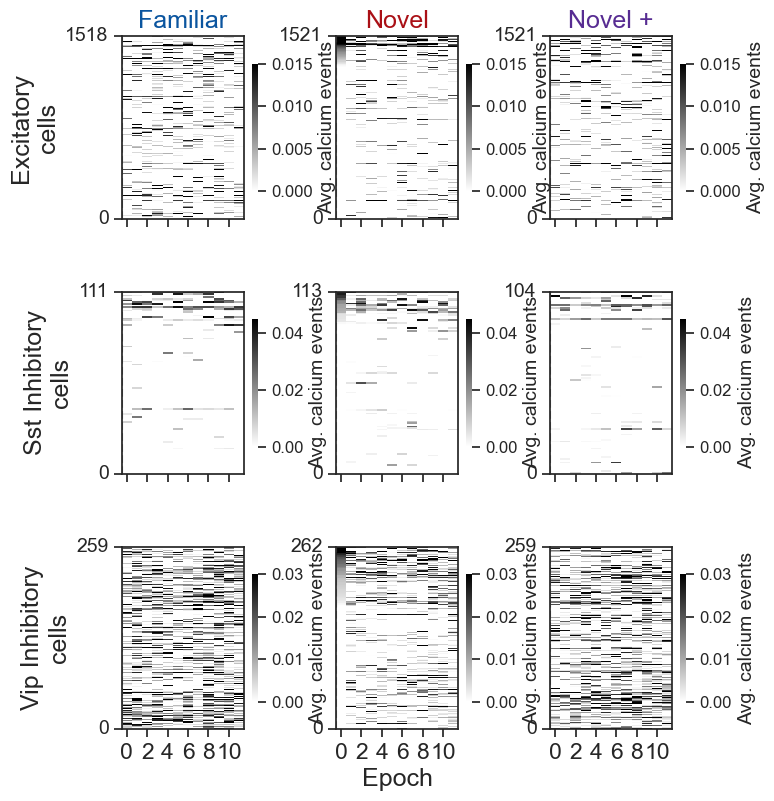

In [ ]:
df = omission_epoch_mdf.copy()
df = df[(df.project_code=='VisualBehaviorMultiscope')]
df = df[df.mean_response<np.percentile(df.mean_response.values, 98)]
df = df[df.epoch!=12]


timestamps = np.sort(df.epoch.unique())
event_type = 'omissions'
row_condition = 'cell_type'
col_condition = 'experience_level'


ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
                                          row_condition, col_condition, plot_epochs=True,
                                          matched_cells_table=matched_cells_table, match_cells=True, 
                                          cols_to_sort_by=None, cell_order=None, suptitle=None,
                                          microscope=None, xlim_seconds=None, xlabel='Epoch',
                                          cbar=True, cbar_label='Avg. calcium events',
                                          save_dir=None, folder=None, suffix='', ax=None);

#### changes epoch heatmap

In [ ]:
df = change_epoch_mdf.copy()
df = df[(df.project_code=='VisualBehaviorMultiscope')]
df = df[df.mean_response<np.percentile(df.mean_response.values, 98)]
df = df[df.epoch!=12]


timestamps = np.sort(df.epoch.unique())
event_type = 'changes'
row_condition = 'cell_type'
col_condition = 'experience_level'


ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
                                          row_condition, col_condition, plot_epochs=True,
                                          matched_cells_table=matched_cells_table, match_cells=False, 
                                          cols_to_sort_by=None, cell_order=None, suptitle=None,
                                          microscope=None, xlim_seconds=None, xlabel='Epoch',
                                          cbar=True, cbar_label='Avg. calcium events',
                                          save_dir=None, folder=None, suffix='', ax=None);

#### mean response by epoch

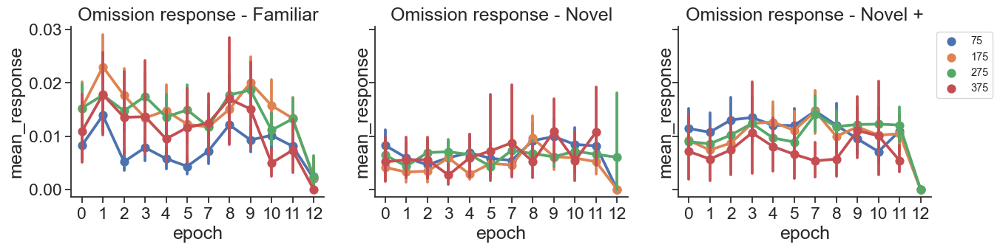

In [ ]:
df = omission_epoch_mdf.copy()
df = df[(df.project_code=='VisualBehaviorMultiscope') & (df.cell_type=='Vip Inhibitory')]
df = df[df.mean_response<np.percentile(df.mean_response.values, 98)]

fig, ax = plt.subplots(1, 3, figsize= (15,3), sharey=True)

for i, experience_level in enumerate(experience_levels): 
        ax[i] = sns.pointplot(data=df[df.experience_level==experience_level], x='epoch', y='mean_response', hue='binned_depth', ax=ax[i])
        ax[i].set_title('Omission response - '+experience_level)
        ax[i].get_legend().remove()
ax[i].legend(bbox_to_anchor=(1,1), fontsize='xx-small')

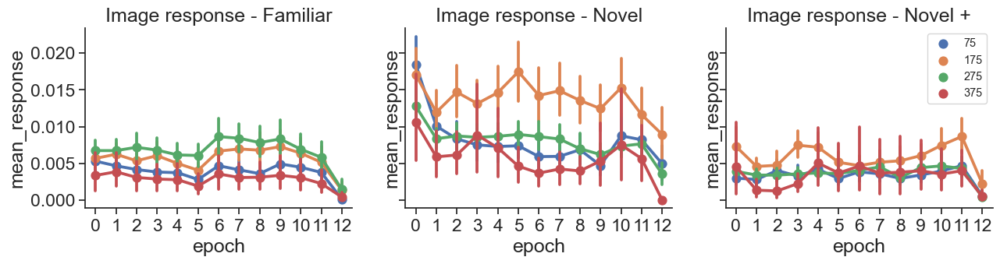

In [ ]:
df = image_epoch_mdf.copy()
df = df[(df.project_code=='VisualBehaviorMultiscope') & (df.cell_type=='Vip Inhibitory')]
df = df[df.mean_response<np.percentile(df.mean_response.values, 99)]

fig, ax = plt.subplots(1, 3, figsize= (15,3), sharey=True)

for i, experience_level in enumerate(experience_levels): 
        ax[i] = sns.pointplot(data=df[df.experience_level==experience_level], x='epoch', y='mean_response', hue='binned_depth', ax=ax[i])
        ax[i].set_title('Image response - '+experience_level)
        ax[i].get_legend().remove()
ax[i].legend(bbox_to_anchor=(1,1), fontsize='xx-small')

Text(0.5, 1.0, 'image response')

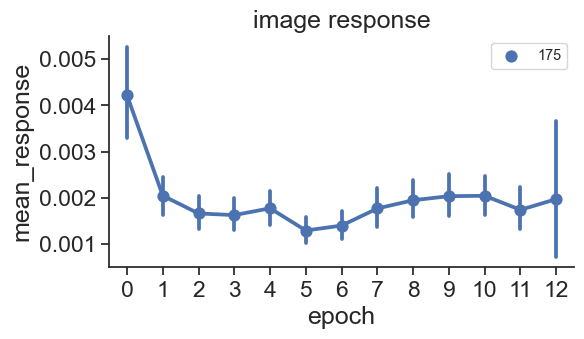

In [ ]:
df = image_epoch_mdf.copy()
df = df[(df.project_code!='VisualBehaviorMultiscope') & (df.cell_type=='Vip Inhibitory') & 
        (df.experience_level=='Novel')]

fig, ax = plt.subplots(figsize= (6,3))

ax = sns.pointplot(data=df, x='epoch', y='mean_response', hue='binned_depth', ax=ax)
ax.legend(bbox_to_anchor=(1,1), fontsize='xx-small')
ax.set_title('image response')

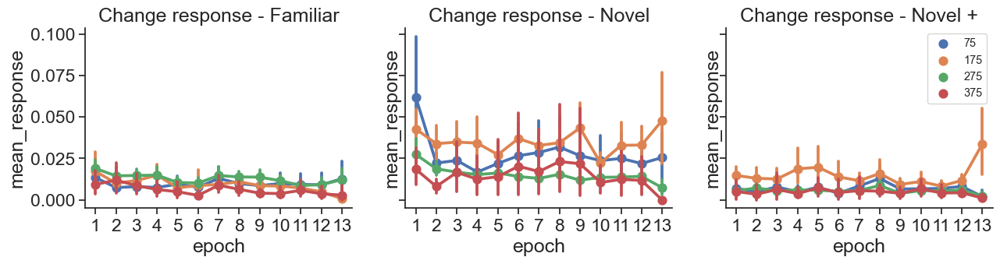

In [ ]:
df = change_epoch_mdf.copy()
df = df[(df.project_code=='VisualBehaviorMultiscope') & (df.cell_type=='Vip Inhibitory')]

fig, ax = plt.subplots(1, 3, figsize= (15,3), sharey=True)

for i, experience_level in enumerate(experience_levels): 
        ax[i] = sns.pointplot(data=df[df.experience_level==experience_level], x='epoch', y='mean_response', hue='binned_depth', ax=ax[i])
        ax[i].set_title('Change response - '+experience_level)
        ax[i].get_legend().remove()
ax[i].legend(bbox_to_anchor=(1,1), fontsize='xx-small')

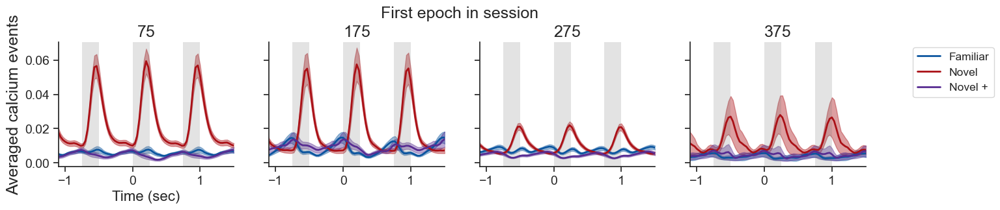

In [ ]:

df = image_epoch_mdf.copy()
df = df[(df.project_code=='VisualBehaviorMultiscope') & (df.cell_type=='Vip Inhibitory')]
df = df[df.epoch<1]

axes_column = 'binned_depth'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.1, 1.5]

suptitle = 'First epoch in session'

tmp = df[df.mean_response<np.percentile(df.mean_response.values, 99.7)]
ax = ppf.plot_population_averages_for_conditions(tmp, data_type, 'images', axes_column, hue_column, 
                                                ylabel='Averaged calcium events', legend=True,
                                                horizontal=True, xlabel='Time (s)', 
                                                xlim_seconds=xlim_seconds, interval_sec=1, sharey=True,
                                                palette=palette, ax=None, title=None, suptitle=suptitle,
                                                save_dir=None, folder=folder, suffix=suffix)


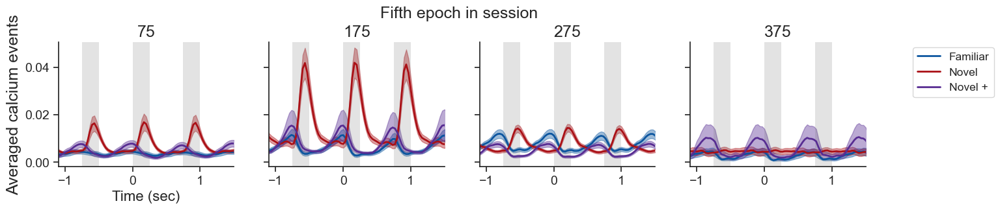

In [ ]:

df = image_epoch_mdf.copy()
df = df[(df.project_code=='VisualBehaviorMultiscope') & (df.cell_type=='Vip Inhibitory')]
df = df[df.epoch==5]

axes_column = 'binned_depth'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.1, 1.5]

suptitle = 'Fifth epoch in session'

tmp = df[df.mean_response<np.percentile(df.mean_response.values, 99.7)]
ax = ppf.plot_population_averages_for_conditions(tmp, data_type, 'images', axes_column, hue_column, 
                                                ylabel='Averaged calcium events', legend=True,
                                                horizontal=True, xlabel='Time (s)', 
                                                xlim_seconds=xlim_seconds, interval_sec=1, sharey=True,
                                                palette=palette, ax=None, title=None, suptitle=suptitle,
                                                save_dir=None, folder=folder, suffix=suffix)


#### across exp levels

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:301: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  epoch_df['experience_epoch'] = epoch_df[['experience_level', 'epoch']].apply(axis=1, func=merge_experience_epoch)


[ 0  1  2  3  4  5  6  7  8  9 10 11]
Excitatory
Sst Inhibitory
Vip Inhibitory


array([<AxesSubplot:title={'center':'Excitatory'}, xlabel='epoch within session', ylabel='Mean omission response'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='epoch within session', ylabel='Mean omission response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, xlabel='epoch within session', ylabel='Mean omission response'>],
      dtype=object)

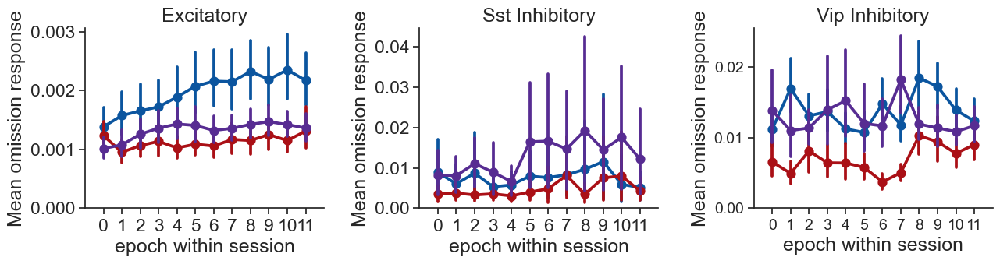

In [ ]:
# plot for all cells within each cre line
suffix = '_omission_within_session'
ppf.plot_mean_response_by_epoch(omission_epoch_mdf, metric='mean_response', horizontal=True, ymin=0, ylabel='Mean omission response', estimator=np.mean,
                                save_dir=save_dir, folder='epochs', max_epoch=11, suptitle=None, suffix=suffix, ax=None)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:301: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  epoch_df['experience_epoch'] = epoch_df[['experience_level', 'epoch']].apply(axis=1, func=merge_experience_epoch)


[ 0  1  2  3  4  5  6  7  8  9 10 11]
Excitatory
Sst Inhibitory
Vip Inhibitory


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Mean response'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='Mean response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, xlabel='epoch within session', ylabel='Mean response'>],
      dtype=object)

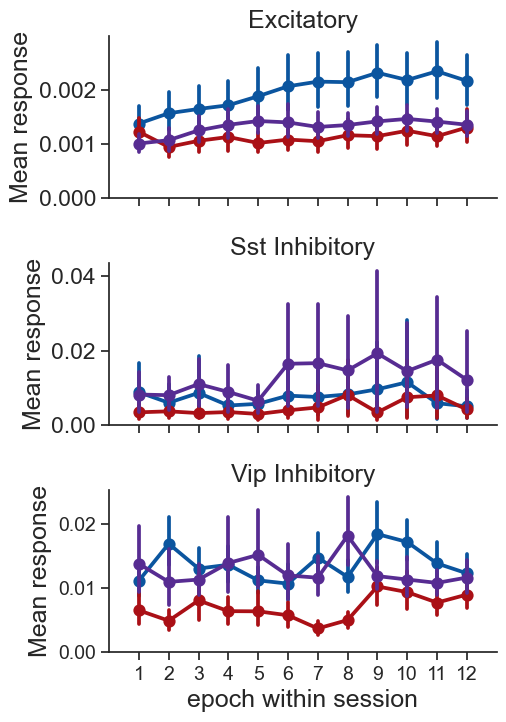

In [ ]:
# plot for all cells within each cre line
suffix = '_omission_within_session'
ppf.plot_mean_response_by_epoch(omission_epoch_mdf, metric='mean_response', horizontal=False, ymin=0, ylabel='Mean response', estimator=np.mean,
                                save_dir=save_dir, folder='epochs', max_epoch=11, suptitle=None, suffix=suffix, ax=None)

#### all images within session

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:301: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  epoch_df['experience_epoch'] = epoch_df[['experience_level', 'epoch']].apply(axis=1, func=merge_experience_epoch)


[ 0  1  2  3  4  5  6  7  8  9 10 11]
Excitatory
Sst Inhibitory
Vip Inhibitory


array([<AxesSubplot:title={'center':'Excitatory'}, xlabel='epoch within session', ylabel='event magnitude'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='epoch within session', ylabel='event magnitude'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, xlabel='epoch within session', ylabel='event magnitude'>],
      dtype=object)

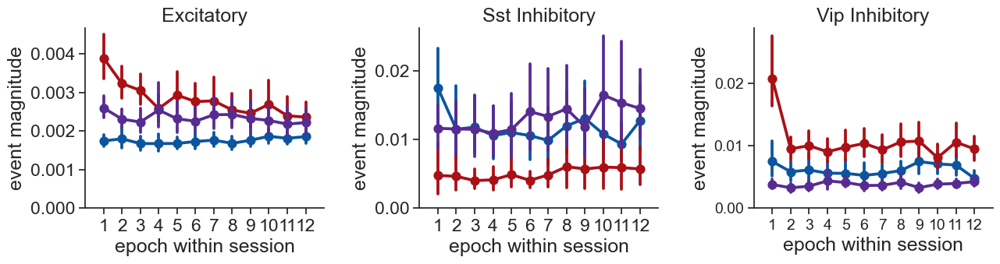

In [ ]:
# plot for all cells within each cre line
suffix = '_images_within_session'
ppf.plot_mean_response_by_epoch(image_epoch_mdf, metric='mean_response', horizontal=True, ymin=0, ylabel='event magnitude', estimator=np.mean,
                                save_dir=save_dir, folder='epochs', max_epoch=11, suptitle=None, suffix=suffix, ax=None)

## Population averages for active/passive

In [ ]:
# # get metadata for active passive expts and save it
# active_passive_experiment_table = loading.get_active_passive_sessions_for_platform_dataset()
# print(len(active_passive_experiment_table))
# # active_passive_experiment_table.to_csv(os.path.join(platform_cache_dir, 'platform_active_passive_experiments_table.csv'))

In [ ]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted']

inclusion_criteria = 'platform_active_passive'

passive_omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.omitted==True]

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_filtered_events_all_omitted_platform_active_passive.pkl


  6%|▌         | 1/18 [00:09<02:36,  9.18s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_G


 22%|██▏       | 4/18 [00:15<00:48,  3.46s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_B_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:23<00:33,  3.02s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_G
no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_A


 61%|██████    | 11/18 [00:32<00:18,  2.67s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_H
no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:40<00:10,  2.61s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_H_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_A


100%|██████████| 18/18 [00:46<00:00,  2.58s/it]


no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_A


 11%|█         | 2/18 [00:02<00:20,  1.29s/it]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_G
no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_A_passive


 28%|██▊       | 5/18 [00:05<00:12,  1.03it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_G_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_A


 44%|████▍     | 8/18 [00:08<00:10,  1.10s/it]

no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_G


 56%|█████▌    | 10/18 [00:12<00:10,  1.37s/it]

no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_H


 72%|███████▏  | 13/18 [00:15<00:06,  1.22s/it]

no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_B_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_H_passive


100%|██████████| 18/18 [00:18<00:00,  1.05s/it]


no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_H


  6%|▌         | 1/18 [00:03<00:56,  3.34s/it]

no multi_session_df for VisualBehavior OPHYS_1_images_B
no multi_session_df for VisualBehavior OPHYS_1_images_G


 22%|██▏       | 4/18 [00:05<00:18,  1.33s/it]

no multi_session_df for VisualBehavior OPHYS_2_images_B_passive
no multi_session_df for VisualBehavior OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:08<00:11,  1.07s/it]

no multi_session_df for VisualBehavior OPHYS_3_images_B
no multi_session_df for VisualBehavior OPHYS_3_images_G
no multi_session_df for VisualBehavior OPHYS_4_images_A


 61%|██████    | 11/18 [00:10<00:05,  1.18it/s]

no multi_session_df for VisualBehavior OPHYS_4_images_H
no multi_session_df for VisualBehavior OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:13<00:03,  1.23it/s]

no multi_session_df for VisualBehavior OPHYS_5_images_H_passive
no multi_session_df for VisualBehavior OPHYS_6_images_A


100%|██████████| 18/18 [00:15<00:00,  1.13it/s]


no multi_session_df for VisualBehavior OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_B


 17%|█▋        | 3/18 [00:03<00:19,  1.27s/it]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_B_passive


 33%|███▎      | 6/18 [00:07<00:15,  1.30s/it]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_B


 50%|█████     | 9/18 [00:12<00:12,  1.43s/it]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_B


 67%|██████▋   | 12/18 [00:16<00:08,  1.43s/it]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_B_passive


 83%|████████▎ | 15/18 [00:20<00:04,  1.35s/it]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_B


100%|██████████| 18/18 [00:24<00:00,  1.36s/it]


saving multi session df to pkl
there are 1879 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
1243 total experiments


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
402 platform experiments
134 platform containers
854 experiments in platform dataset
134 containers in platform dataset
3 experience levels in platform dataset


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\loading.py:377: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_platform_experiments['experience_level'] = [utils.convert_experience_level(experience_level) for
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1780: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date_of_acquisition'].apply(dateformat)


233 passive expts closest to first novel day


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1780: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date_of_acquisition'].apply(dateformat)


268 active expts closest to first novel day
501 merged passive and active expts
134 containers in active passive set
there are 500 experiments in the multi_session_df after limiting to active-passive experiments from platform paper containers
there are 500 experiments after filtering for inclusion criteria -  platform_active_passive


In [ ]:
print(len(passive_omission_mdf.mouse_id.unique()), 'mice')
print(len(passive_omission_mdf.ophys_container_id.unique()), 'containers')
print(len(passive_omission_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(passive_omission_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
500 experiments
15880 cells


66 mice
134 containers
848 experiments
19872 cells

In [ ]:
conditions_to_group=['full_genotype', 'passive', 'second_novel', 'last_familiar']

utilities.count_mice_expts_containers_cells(passive_omission_mdf, conditions_to_group, include_matched_cells=False)

n_mouse_id  \
full_genotype                                      passive second_novel last_familiar               
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                  26   
                                                                        True                   26   
                                                           True         False                  14   
                                                   True    False        False                  30   
                                                                        True                    8   
                                                           True         False                  20   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                  11   
                                                                        True                   12   
                                                           True         False                   5   
                                                   True    False        False                  11   
                                                                        True                    4   
                                                           True         False                  12   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                  11   
                                                                        True                   12   
                                                           True         False                   8   
                                                   True    False        False                  12   
                                                                        True                    5   
                                                           True         False                  10   

                                                                                       n_ophys_session_id  \
full_genotype                                      passive second_novel last_familiar                       
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                          30   
                                                                        True                           27   
                                                           True         False                          14   
                                                   True    False        False                          38   
                                                                        True                            8   
                                                           True         False                          20   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                          16   
                                                                        True                           12   
                                                           True         False                           5   
                                                   True    False        False                          14   
                                                                        True                            4   
                                                           True         False                          12   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                          15   
                                                                        True                           13   
                                                           True         False                           9   
                                                   True    False        False                          17   
                                                                        True                            

In [ ]:
# # limit to mice in platform expts
# passive_omission_mdf.mouse_id = [int(mouse_id) for mouse_id in passive_omission_mdf.mouse_id.values]

# passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.mouse_id.isin(platform_expts.mouse_id.unique())]
# print(len(passive_omission_mdf.mouse_id.unique()))

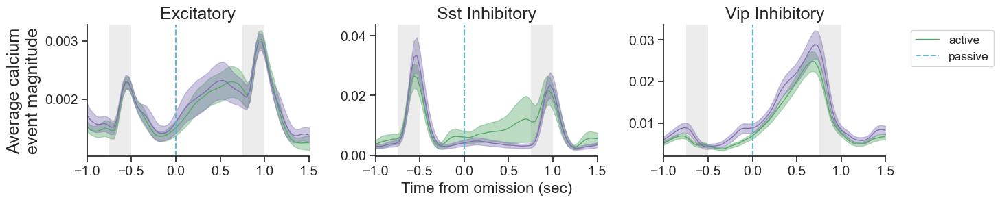

In [ ]:
df = passive_omission_mdf.copy()
df = df[df.experience_level=='Familiar']

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions', axes_column, hue_column, 
                                                 horizontal=True, ylabel='Average calcium\nevent magnitude',
                                                 xlabel='Time from omission (s)', xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)


In [ ]:
df = passive_omission_mdf.copy()
# df = utilities.limit_to_containers_with_all_experience_levels(df)
active_passive_experiment_table = loading.get_active_passive_sessions_for_platform_dataset()
df = df[df.ophys_experiment_id.isin(active_passive_experiment_table.index.values)]
print(len(df.ophys_experiment_id.unique()))


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
1243 total experiments


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
402 platform experiments
134 platform containers
854 experiments in platform dataset
134 containers in platform dataset
3 experience levels in platform dataset


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\loading.py:377: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_platform_experiments['experience_level'] = [utils.convert_experience_level(experience_level) for
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1780: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date_of_acquisition'].apply(dateformat)


233 passive expts closest to first novel day


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1780: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date_of_acquisition'].apply(dateformat)


268 active expts closest to first novel day
501 merged passive and active expts
134 containers in active passive set
500


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
1243 total experiments


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
402 platform experiments
134 platform containers
854 experiments in platform dataset
134 containers in platform dataset
3 experience levels in platform dataset


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\loading.py:377: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_platform_experiments['experience_level'] = [utils.convert_experience_level(experience_level) for
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1780: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date_of_acquisition'].apply(dateformat)


233 passive expts closest to first novel day


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1780: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date_of_acquisition'].apply(dateformat)


268 active expts closest to first novel day
501 merged passive and active expts
134 containers in active passive set
250


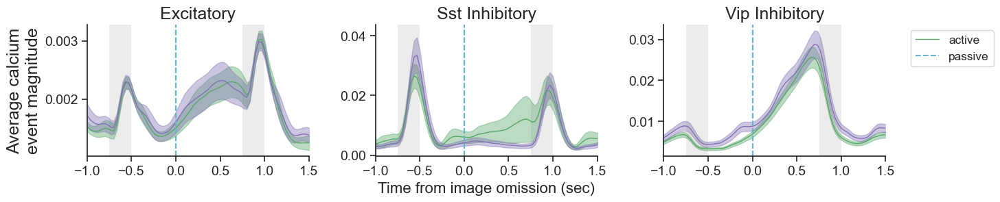

In [ ]:
df = passive_omission_mdf.copy()
# df = utilities.limit_to_containers_with_all_experience_levels(df)
active_passive_experiment_table = loading.get_active_passive_sessions_for_platform_dataset()
df = df[df.ophys_experiment_id.isin(active_passive_experiment_table.index.values)]
df = df[df.ophys_session_id!=919888953]
df = df[df.experience_level=='Familiar']
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions', axes_column, hue_column, 
                                                horizontal=True, ylabel='Average calcium\nevent magnitude',
                                                xlabel='Time from image omission (s)', xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                palette=palette, save_dir=save_dir, folder='population_averages', ax=None)

#### Changes for active passive

In [ ]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change']

# inclusion_criteria = 'platform_active_passive'
inclusion_criteria = 'test2'
data_type = 'events'
interpolate = True
output_sampling_rate = 30

passive_change_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

passive_change_mdf = passive_change_mdf[passive_change_mdf.is_change==True]

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_is_change_test2.pkl


  6%|▌         | 1/18 [00:05<01:38,  5.82s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_G


 22%|██▏       | 4/18 [00:11<00:37,  2.65s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_B_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:18<00:27,  2.47s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_G
no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_A


 61%|██████    | 11/18 [00:26<00:15,  2.29s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_H
no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:33<00:08,  2.20s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_H_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_A


100%|██████████| 18/18 [00:37<00:00,  2.11s/it]


no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_A


 11%|█         | 2/18 [00:02<00:20,  1.30s/it]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_G
no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_A_passive


 28%|██▊       | 5/18 [00:05<00:13,  1.01s/it]

no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_G_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_A


 44%|████▍     | 8/18 [00:08<00:10,  1.02s/it]

no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_G


 56%|█████▌    | 10/18 [00:11<00:10,  1.26s/it]

no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_H


 72%|███████▏  | 13/18 [00:14<00:05,  1.11s/it]

no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_B_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_H_passive


100%|██████████| 18/18 [00:17<00:00,  1.04it/s]


no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_H


  6%|▌         | 1/18 [00:03<00:59,  3.51s/it]

no multi_session_df for VisualBehavior OPHYS_1_images_B
no multi_session_df for VisualBehavior OPHYS_1_images_G


 22%|██▏       | 4/18 [00:06<00:19,  1.40s/it]

no multi_session_df for VisualBehavior OPHYS_2_images_B_passive
no multi_session_df for VisualBehavior OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:08<00:11,  1.02s/it]

no multi_session_df for VisualBehavior OPHYS_3_images_B
no multi_session_df for VisualBehavior OPHYS_3_images_G
no multi_session_df for VisualBehavior OPHYS_4_images_A


 61%|██████    | 11/18 [00:10<00:05,  1.28it/s]

no multi_session_df for VisualBehavior OPHYS_4_images_H
no multi_session_df for VisualBehavior OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:12<00:03,  1.32it/s]

no multi_session_df for VisualBehavior OPHYS_5_images_H_passive
no multi_session_df for VisualBehavior OPHYS_6_images_A


100%|██████████| 18/18 [00:15<00:00,  1.19it/s]


no multi_session_df for VisualBehavior OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_B


 17%|█▋        | 3/18 [00:03<00:17,  1.19s/it]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_B_passive


 33%|███▎      | 6/18 [00:10<00:22,  1.88s/it]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_B


 50%|█████     | 9/18 [00:14<00:14,  1.65s/it]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_B


 67%|██████▋   | 12/18 [00:18<00:08,  1.47s/it]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_B_passive


 83%|████████▎ | 15/18 [00:22<00:04,  1.42s/it]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_B


100%|██████████| 18/18 [00:26<00:00,  1.45s/it]


saving multi session df to pkl
there are 1881 experiments in the full multi_session_df


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 1874 experiments after filtering for inclusion criteria -  test2


In [ ]:
tmp_expts = loading.get_platform_paper_experiment_table(limit_to_closest_active=False,
                                                                add_extra_columns=True,
                                                                include_4x2_data=True,
                                                                remove_Ai94=True,
                                                                remove_flagged=True)
len(tmp_expts.mouse_id.unique())

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments


99

In [ ]:
passive_change_mdf[passive_change_mdf.mouse_id=='453990'].ophys_session_id.unique()

<IntegerArray>
[916650386, 925478114, 917498735, 919041767, 919888953, 920695792, 921922878,
 927787876, 923705570]
Length: 9, dtype: Int64

In [ ]:
tmp_expts[tmp_expts.mouse_id=='453990'].ophys_session_id.unique()

<IntegerArray>
[916650386, 917498735, 919041767, 919888953, 920695792, 921922878, 923705570,
 925478114, 927787876]
Length: 9, dtype: Int64

In [ ]:
active_passive_experiment_table = loading.get_active_passive_sessions_for_platform_dataset()
active_passive_experiment_table[active_passive_experiment_table.mouse_id=='453990'].ophys_session_id.unique()

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
1243 total experiments


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
402 platform experiments
134 platform containers
854 experiments in platform dataset
134 containers in platform dataset
3 experience levels in platform dataset


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\loading.py:377: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_platform_experiments['experience_level'] = [utils.convert_experience_level(experience_level) for
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1780: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date_of_acquisition'].apply(dateformat)


233 passive expts closest to first novel day


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1780: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date_of_acquisition'].apply(dateformat)


268 active expts closest to first novel day
501 merged passive and active expts
134 containers in active passive set


<IntegerArray>
[917498735, 921922878, 927787876, 919888953, 923705570]
Length: 5, dtype: Int64

9


Text(0.5, 1.0, '2019-08-08 14:35:37.217000+00:00\nOPHYS_3_images_A\n919888953')

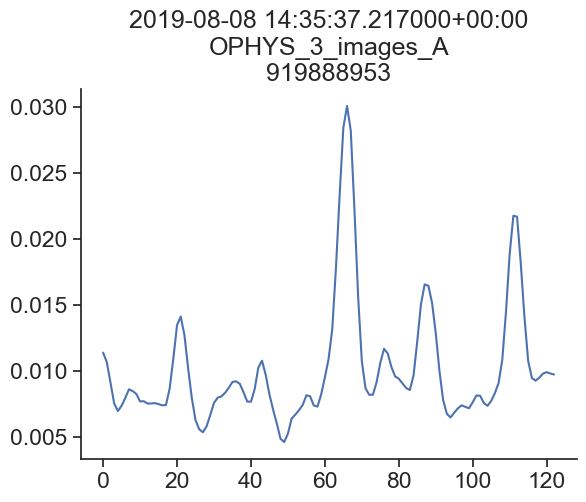

In [ ]:
tmp = passive_change_mdf[passive_change_mdf.mouse_id=='453990']
print(len(tmp.ophys_session_id.unique()))

ophys_session_id = 919888953
data = tmp[tmp.ophys_session_id==ophys_session_id]
fig, ax = plt.subplots()
ax.plot(data.mean_trace.mean())
ax.set_title(str(data.date_of_acquisition.unique()[0])+'\n'+data.session_type.unique()[0]+'\n'+str(ophys_session_id))

In [ ]:
# tmp = passive_change_mdf[passive_change_mdf.mouse_id=='453990']
# print(len(tmp.ophys_session_id.unique()))

# ophys_session_id = 919888953
# for ophys_session_id in tmp.ophys_session_id.unique():
#     data = tmp[tmp.ophys_session_id==ophys_session_id]
#     fig, ax = plt.subplots()
#     ax.plot(data.mean_trace.mean())
#     ax.set_title(str(data.date_of_acquisition.unique()[0])+'\n'+data.session_type.unique()[0]+'\n'+str(ophys_session_id))

In [ ]:
print(len(passive_change_mdf.mouse_id.unique()), 'mice')
print(len(passive_change_mdf.ophys_container_id.unique()), 'containers')
print(len(passive_change_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(passive_change_mdf.cell_specimen_id.unique()), 'cells')

99 mice
318 containers
1874 experiments
39997 cells


In [ ]:
# # params for stim response df creation
# event_type = 'all'

# # params for mean response df creation
# conditions = ['cell_specimen_id', 'is_change']


# passive_change_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, 'containers_with_all_levels', 
#                                                         interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
#                                                          epoch_duration_mins=None)

# passive_change_mdf = passive_change_mdf[passive_change_mdf.is_change==True]

958


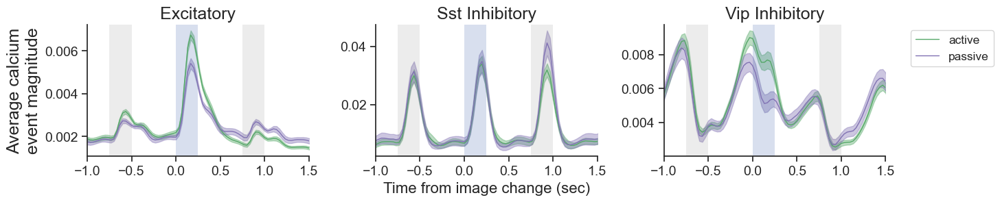

In [ ]:
df = passive_change_mdf.copy()
df = df[df.experience_level=='Familiar']
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, 
                                                 horizontal=True, ylabel='Average calcium\nevent magnitude',
                                                xlabel='Time from image change (s)', xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)

c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
1243 total experiments


c:\users\marinag\documents\code\allensdk\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
402 platform experiments
134 platform containers
854 experiments in platform dataset
134 containers in platform dataset
3 experience levels in platform dataset


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\loading.py:377: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_platform_experiments['experience_level'] = [utils.convert_experience_level(experience_level) for
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1780: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date_of_acquisition'].apply(dateformat)


233 passive expts closest to first novel day


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\data_access\utilities.py:1780: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = df['date_of_acquisition'].apply(dateformat)


268 active expts closest to first novel day
501 merged passive and active expts
134 containers in active passive set
249


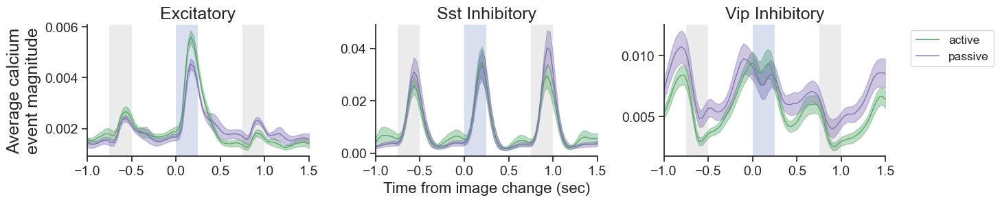

In [ ]:
df = passive_change_mdf.copy()
df = utilities.limit_to_containers_with_all_experience_levels(df)
active_passive_experiment_table = loading.get_active_passive_sessions_for_platform_dataset()
df = df[df.ophys_experiment_id.isin(active_passive_experiment_table.index.values)]
df = df[df.ophys_session_id!=919888953]
df = df[df.experience_level=='Familiar']
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, 
                                                horizontal=True, ylabel='Average calcium\nevent magnitude',
                                                xlabel='Time from image change (s)', xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                palette=palette, save_dir=save_dir, folder='population_averages', ax=None)

694


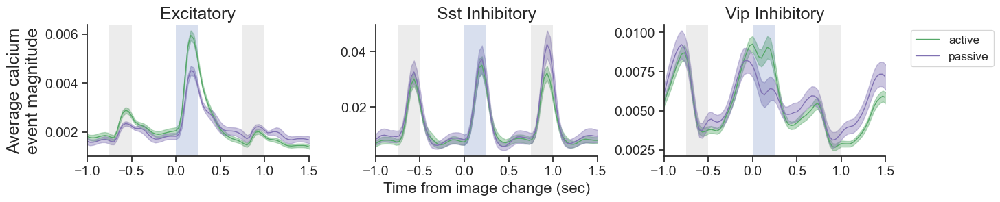

In [ ]:
df = passive_change_mdf.copy()
df = utilities.limit_to_containers_with_all_experience_levels(df)
# df = df[df.ophys_session_id!=919888953]
df = df[df.experience_level=='Familiar']
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, 
                                                 horizontal=True, ylabel='Average calcium\nevent magnitude',
                                                xlabel='Time from image change (s)', xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)

254


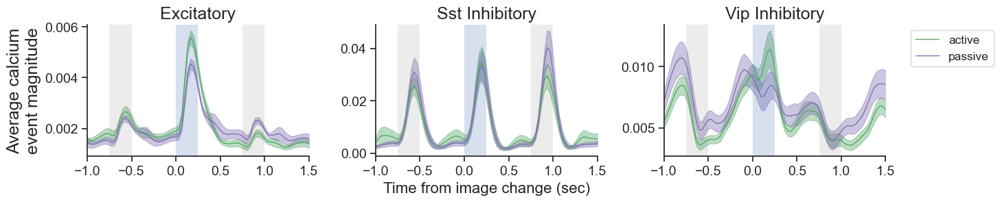

In [ ]:
df = passive_change_mdf.copy()
df = df[df.ophys_experiment_id.isin(active_passive_experiment_table.index.values)]
df = df[df.experience_level=='Familiar']
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, 
                                                 horizontal=True, ylabel='Average calcium\nevent magnitude',
                                                xlabel='Time from image change (s)', xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)

249


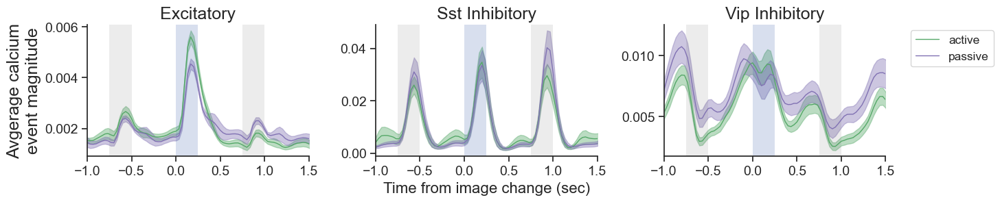

In [ ]:
df = passive_change_mdf.copy()
df = df[df.ophys_experiment_id.isin(active_passive_experiment_table.index.values)]
df = df[df.ophys_session_id!=919888953]
df = df[df.experience_level=='Familiar']
print(len(df.ophys_experiment_id.unique()))


axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, 
                                                 horizontal=True, ylabel='Avgerage calcium\nevent magnitude',
                                                xlabel='Time from image change (s)', xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)

### get cell metrics table for changes

In [ ]:
import visual_behavior.ophys.response_analysis.cell_metrics as cm
import visual_behavior.dimensionality_reduction.clustering.processing as processing

In [ ]:
experiments_table = platform_experiments.copy()

In [ ]:
# ophys_experiment_ids = experiments_table.index.values

# condition = 'changes'
# stimuli = 'all_images'
# session_subset = 'full_session'
    
# inclusion_criteria = 'platform_experiments'

# # metrics_table = processing.generate_merged_table_of_model_free_metrics(data_type='events', session_subset='full_session',
# #                                                 inclusion_criteria='platform_experiment_table', save_dir=save_dir)

# # original_metrics_table = metrics_table.copy()
# change_metrics_table = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)

In [ ]:
print(len(metrics_table.ophys_experiment_id.unique()))

402


In [ ]:
len(metrics_table.cell_specimen_id.unique())

14495